<a href="https://colab.research.google.com/github/rajagopalmotivate/try1/blob/master/DCGAN_for_odd_sized_images_ver23_Datavar1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Try to freeze one of the generators 

In [4]:
from IPython.display import Image
from keras.utils import plot_model
# Install dependencies
!apt install graphviz
!pip install pydot pydot-ng
!echo "Double check with Python 3"
!python -c "import pydot"

Using TensorFlow backend.


Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.
Double check with Python 3


In [5]:
!pip install pydot pydot-ng


In [0]:
from IPython.display import Image
from keras.utils import plot_model

In [0]:
# Restart runtime to allow Jupyter to know the changes above
import os
#os._exit(0)

In [0]:
from keras.datasets import mnist
from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, Average, merge
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Model
from keras.optimizers import Adam
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from keras.models import load_model
from google.colab import files
import copy 

In [0]:
def load_large_data():
    (X_train1, ytrain1), (_, _) = fashion_mnist.load_data()
    (X_train2, ytrain2), (_, _) = fashion_mnist.load_data()
    
    X_trainlarge = np.zeros([100000,28,56],dtype=np.uint8)
    
    for i in range(0, 100):
      for j in range(0, 1000):    
          aimage1 = X_train2[i]
          aimage2 = X_train2[j]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage1
          X_trainlarge[i*1000 + j] = largeimage
 
    
    fig=plt.figure(figsize=(16, 16))
    for i in range(0, 10):
      for j in range(0, 10):
          fig.add_subplot(10, 10, i*10 + j +1)
          plt.imshow(X_trainlarge[i*100 + j + 600])
  ##plt.show()
    
    print(X_train2.shape)
    print(X_trainlarge.shape)
    
    plt.imshow(aimage1)
    plt.show()  
 
    plt.imshow(aimage2)
    plt.show()
    
    plt.imshow(largeimage, interpolation='none')
    plt.show()
    

    X_trainlarge = (X_trainlarge.astype(np.float32) - 127.5) / 127.5
    X_trainlarge = np.expand_dims(X_trainlarge, axis=3)


    return X_trainlarge

In [0]:
def load_large_dataPaired():
    
    (X_train1, ytrain1), (_, _) = mnist.load_data()
    (X_train1, ytrain1), (_, _) = mnist.load_data()

    (X_train2, ytrain2), (_, _) = mnist.load_data()
    
    X_train1label0 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label1 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label2 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label3 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label4 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label5 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label6 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label7 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label8 = np.zeros([10000,28,28],dtype=np.uint8)
    X_train1label9 = np.zeros([10000,28,28],dtype=np.uint8)
    
    
    
    count0 = 0 
    count1 = 1
    count2 = 2 
    count3 = 3
    count4 = 4
    count5 = 5
    count6 = 6
    count7 = 7
    count8 = 8    
    count9 = 9
    for i in range(0, 50000):
      if(ytrain1[i]==0):
        X_train1label0[count0] = X_train1[i]
        count0 = count0 +1 
      if(ytrain1[i]==1):
        X_train1label1[count1] = X_train1[i]
        count1 = count1 +1
      if(ytrain1[i]==2):
        X_train1label2[count2] = X_train1[i]
        count2 = count2 +1
      if(ytrain1[i]==3):
        X_train1label3[count3] = X_train1[i]
        count3 = count3 +1
      if(ytrain1[i]==4):
        X_train1label4[count4] = X_train1[i]
        count4 = count4 +1
      if(ytrain1[i]==5):
        X_train1label5[count5] = X_train1[i]
        count5 = count5 +1  
      if(ytrain1[i]==6):
        X_train1label6[count6] = X_train1[i]
        count6 = count6 +1  
      if(ytrain1[i]==7):
        X_train1label7[count7] = X_train1[i]
        count7 = count7 +1  
      if(ytrain1[i]==8):
        X_train1label8[count8] = X_train1[i]
        count8 = count8 +1  
      if(ytrain1[i]==9):
        X_train1label9[count9] = X_train1[i]
        count9 = count9 +1  

                                                
    
    totalsamples = 50000
    X_trainlarge = np.zeros([50000,28,56],dtype=np.uint8)
    
    fillount = 0
    for i in range(0, 10000): 
          if( (fillount + 3) > totalsamples  ):
            break
          aimage1 = X_train1label0[i]
          aimage2 = X_train1label1[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1
          aimage1 = X_train1label1[i]
          aimage2 = X_train1label2[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1          
          aimage1 = X_train1label2[i]
          aimage2 = X_train1label3[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1
          aimage1 = X_train1label3[i]
          aimage2 = X_train1label4[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1
          aimage1 = X_train1label4[i]
          aimage2 = X_train1label5[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1 
          aimage1 = X_train1label5[i]
          aimage2 = X_train1label6[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1 
          aimage1 = X_train1label6[i]
          aimage2 = X_train1label7[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1
          aimage1 = X_train1label7[i]
          aimage2 = X_train1label8[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1           
          aimage1 = X_train1label8[i]
          aimage2 = X_train1label9[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1 
          aimage1 = X_train1label9[i]
          aimage2 = X_train1label0[i]
          largeimage =  np.zeros([28,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage1
          largeimage[0:28, 28:56] = aimage2
          X_trainlarge[fillount] = largeimage
          fillount = fillount + 1           
    
    fig=plt.figure(figsize=(16, 16))
    for i in range(0, 10):
      for j in range(0, 10):
          fig.add_subplot(10, 10, i*10 + j +1)
          plt.imshow(X_trainlarge[i*10 + j + 44700])
    plt.show()
    
    print(X_train2.shape)
    print(X_trainlarge.shape)

    

    X_trainlarge = (X_trainlarge.astype(np.float32) - 127.5) / 127.5
    X_trainlarge = np.expand_dims(X_trainlarge, axis=3)


    return X_trainlarge

In [0]:
def load_large_data5656():
    (X_train1, _), (_, _) = mnist.load_data()
    (X_train2, _), (_, _) = fashion_mnist.load_data()
    
    X_trainlarge = np.zeros([10000,56,56],dtype=np.uint8)
    
    for i in range(0, 100):
      for j in range(0, 100):    
          aimage1 = X_train2[i]
          aimage2 = X_train2[j]
          largeimage =  np.zeros([56,56],dtype=np.uint8)
          largeimage[0:28, 0:56] = 40
          largeimage[0:28, 0:28] = aimage2
          largeimage[0:28, 28:56] = aimage1
          X_trainlarge[i*100 + j] = largeimage
 
    
    fig=plt.figure(figsize=(16, 16))
    for i in range(0, 10):
      for j in range(0, 10):
          fig.add_subplot(10, 10, i*10 + j +1)
          plt.imshow(X_trainlarge[i*100 + j + 1000])
  ##plt.show()
    
    print(X_train2.shape)
    print(X_trainlarge.shape)
    
    plt.imshow(aimage1)
    plt.show()  
 
    plt.imshow(aimage2)
    plt.show()
    
    plt.imshow(largeimage, interpolation='none')
    plt.show()
    

    X_trainlarge = (X_trainlarge.astype(np.float32) - 127.5) / 127.5
    X_trainlarge = np.expand_dims(X_trainlarge, axis=3)


    return X_trainlarge

(60000, 28, 28)
(100000, 28, 56)


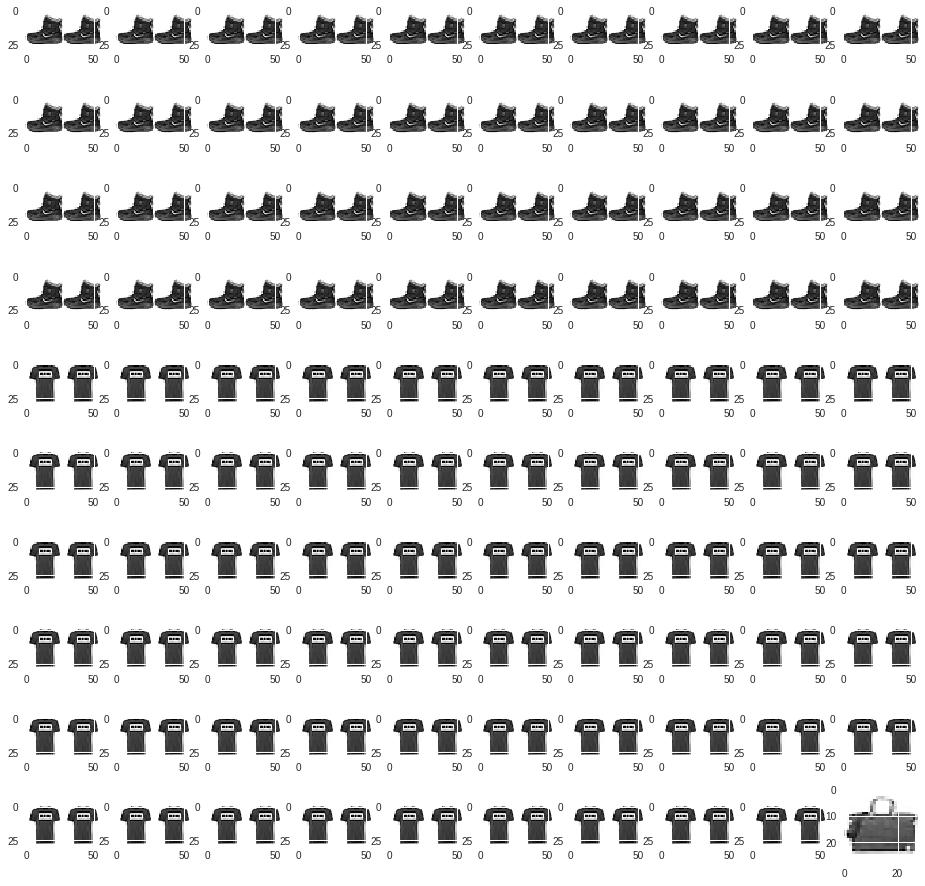

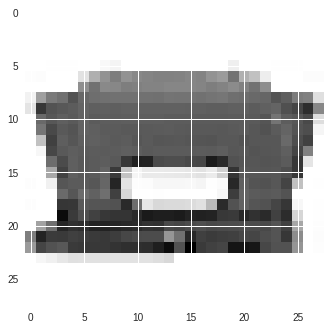

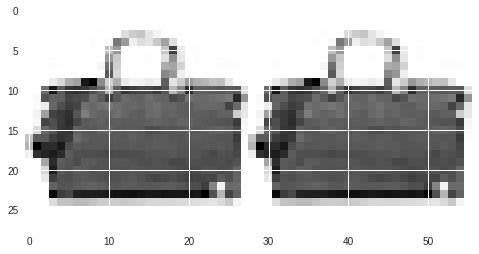

In [12]:
X_trainlarge = load_large_data()

In [0]:
#X_trainlarge5656 = load_large_data5656()

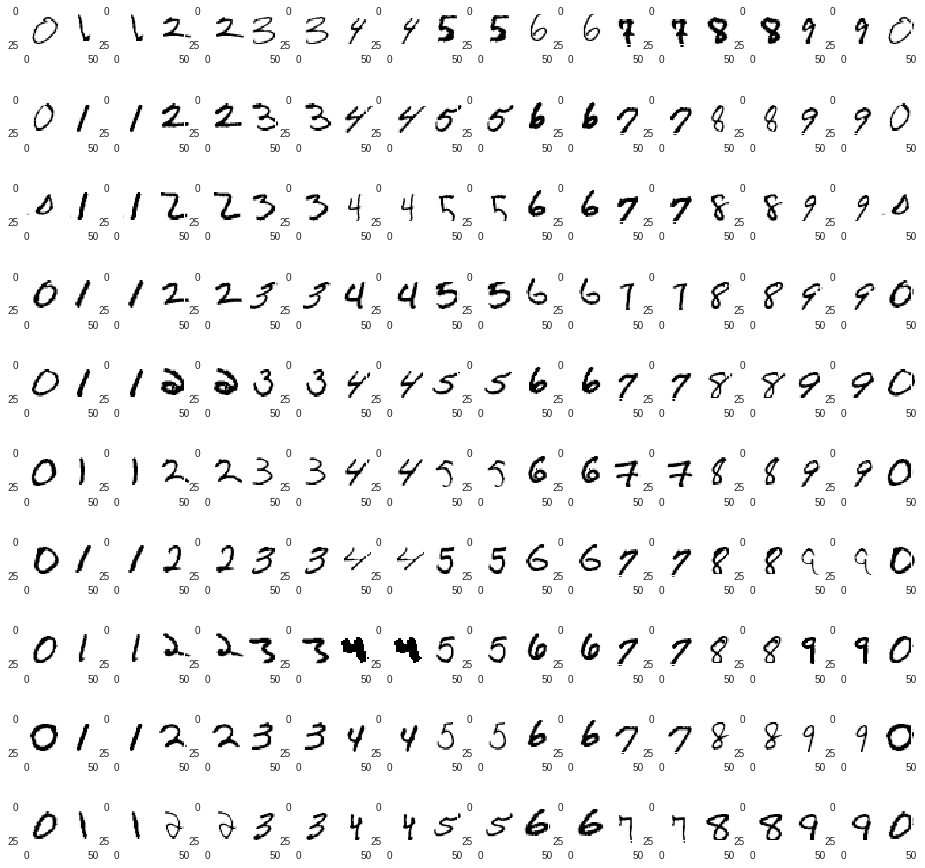

(60000, 28, 28)
(50000, 28, 56)


In [14]:
X_trainlargepaired = load_large_dataPaired()

In [0]:
def load_databydatasetname(datasetname):
  if (datasetname == 1):   
    (X_train, _), (_, _) = mnist.load_data()
  if (datasetname == 2):   
    (X_train, _), (_, _) = fashion_mnist.load_data()
  if (datasetname == 3):   
     X_train = X_trainlarge
  if (datasetname == 4):   
     X_train = X_trainlarge5656
  if (datasetname == 5):   
     X_train = X_trainlargepaired
      
  X_train = (X_train.astype(np.float32) - 127.5) / 127.5
  X_train = np.expand_dims(X_train, axis=3)
  return X_train
  

In [0]:
def build_discriminator(img_shape):
    input = Input(img_shape)
    x =Conv2D(32, kernel_size=3, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = (LeakyReLU(alpha=0.2))(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.25)(x)
    x = Flatten()(x)
    out = Dense(1, activation='sigmoid')(x)

    model = Model(input, out)
  #  print("-- Discriminator -- ")
   # model.summary()
    return model

In [0]:
def save_imgs(generator, epoch, batch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    ##fig.savefig("images/mnist_%d_%d.png" % (epoch, batch))
    plt.show()
    plt.close()

In [0]:
def save_imgs_all(generator1, generator2, generator3, epoch, batch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator1.predict(noise)

    # Rescale images 0 - 1
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    ##fig.savefig("images/mnist_%d_%d.png" % (epoch, batch))
    plt.show()
    plt.close()
    
    gen_imgs = generator2.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()
    plt.close()
    
    gen_imgs = generator3.predict(noise)
    gen_imgs = 0.5 * gen_imgs + 0.5
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.show()
    plt.close()

In [0]:


def plotamodel(amodel, showdetails=True):
  # Model summary
  print(amodel.summary())

  if (showdetails==True):
    # Plot model graph
    plot_model(amodel, show_shapes=True, show_layer_names=True, to_file='model.png')
    #Image(retina=True, filename='model.png')
  if (showdetails==False):
    # Plot model graph
    plot_model(amodel, show_shapes=False, show_layer_names=False, to_file='modelsmall.png')
   # Image(retina=True, filename='modelsmall.png')

In [0]:
def build_combined_model():

    discriminatormymodel = build_classifier_model

    generatormymodel = build_generator_model()
   
    optimizer1 = Adam(lr=0.0002, beta_1=0.5)


    z = Input(shape=(100,))
    img = generatormymodel(z)
    discriminatormymodel.trainable = False
    real = discriminatormymodel(img)
    
    combined = Model(z, real)
    
    combined.compile(loss='binary_crossentropy', optimizer=optimizer1)
    return combined

In [0]:
def getlastlayer(amodel):
  for layer in amodel.layers:
    layerlast = layer
  print(layer)
  print(layer.get_config())
  print(layer.input)
  print(layer.input_shape)
  print(layer.output)
  print('output shape of last is ')
  print(layer.output_shape)
  return layer

In [0]:
def train(generator1, generator2, discriminator, combined, mergedmodel,  epochs=2000, batch_size=128, save_interval=50, modeltotrain=1):

    X_train = load_databydatasetname(2)
    X_train5656 = None

    
    if modeltotrain == 3:
          X_train5656 = load_databydatasetname(3)
         # X_train = load_databydatasetname(5)

    num_examples = X_train.shape[0]
    num_batches = int(num_examples / float(batch_size))
    print('Number of examples: ', num_examples)
    print('Number of Batches: ', num_batches)
    print('Number of epochs: ', epochs)

    half_batch = int(batch_size / 2)
    ##quater_batch = int(half_batch / 2) 

    for epoch in range(epochs + 1):
        for batch in range(num_batches):
            noise1 = np.random.normal(0, 1, (half_batch, 100))
            fake_images1 = generator1.predict(noise1)
            fake_labels1 = np.zeros((half_batch, 1))
            
           ## noise2 = np.random.normal(0, 1, (half_batch, 100))
            noise2 = copy.deepcopy(noise1)
            fake_images2 = generator2.predict(noise2)
            fake_labels2 = np.zeros((half_batch, 1))
            
        
            
           ## fake_images = np.append(fake_images1 , fake_images2, axis=0)
           ## fake_labels = np.append( fake_labels1 , fake_labels2, axis=0)
            
            if modeltotrain == 1:
              fake_images = fake_images1
              fake_labels = fake_labels1
            if modeltotrain == 2:
              fake_images = fake_images2
              fake_labels = fake_labels2
            if modeltotrain == 3:
              noise2 = copy.deepcopy(noise1)
              fake_images3 = mergedmodel.predict(noise2)
              fake_labels3 = np.zeros((half_batch, 1))    
              fake_images = fake_images3
              fake_labels = fake_labels3              
            


            X_train = X_trainlarge
            X_train = X_trainlargepaired
            #X_train = X_train5656
            # real images for batch
            idx = np.random.randint(0, X_train.shape[0], half_batch)            
            real_images = X_train[idx]
            real_labels = np.ones((half_batch, 1))
            
            if(batch == 0):
              print('noise half batch')
              print(noise1)
              print("G1 output numpy array shape")
              print(fake_images1.shape)
              print("G1+G2 appended numpy array shape")
              print(fake_images.shape)
              print("real images")
              print(real_images.shape)

            # Train the discriminator (real classified as ones and generated as zeros)
            d_loss_real = discriminator.train_on_batch(real_images, real_labels)
            d_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, 100))
            
            
            # Train the generator
            g_loss = combined.train_on_batch(noise, np.ones((batch_size, 1)))

            # Plot the progress
            print("Epoch %d Batch %d/%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (epoch,batch, num_batches, d_loss[0], 100 * d_loss[1], g_loss))

            if batch % 100 == 0:
                 save_imgs_all(generator1, generator2, mergedmodel,  epoch, batch)
            #if batch % 101 == 0:
                 #save_imgs(generator2, epoch, batch)
            #if batch % 102 == 0:
                 #save_imgs(mergedmodel, epoch, batch)
                








In [23]:

generator1, generator2, discriminator, combined , mergedmodel = build_modelsNandriNEW( averagemode = 3 ,  loadpretrainedweights=True)




    
    

    


<class 'tensorflow.python.framework.ops.Tensor'>
(?, 28, 28, 1)
<class 'tensorflow.python.framework.ops.Tensor'>
(?, 28, 28, 1)
merge layers
(?, 28, 28, 1)
(?, 28, 28, 1)
(?, 28, 56, 1)


In [0]:
def build_modelsNandriNEW(averagemode = 1, loadpretrainedweights=False):
    z = Input(shape=(100,))
    inputz = z
    x = Dense(128 * 7 * 7, activation="relu")(inputz)
    x = Reshape((7, 7, 128))(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(128, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = UpSampling2D()(x)
    x = Conv2D(64, kernel_size=3, padding="same")(x)
    x = Activation("relu")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = Conv2D(1, kernel_size=3, padding="same")(x)
    out = Activation("tanh")(x)    
    generator1 = Model(inputz, out)
    
    inputz2 = z
    x1 = Dense(128 * 7 * 7, activation="relu")(inputz2)
    x1 = Reshape((7, 7, 128))(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(128, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = UpSampling2D()(x1)
    x1 = Conv2D(64, kernel_size=3, padding="same")(x1)
    x1 = Activation("relu")(x1)
    x1 = BatchNormalization(momentum=0.8)(x1)
    x1 = Conv2D(1, kernel_size=3, padding="same")(x1)
    out1 = Activation("tanh")(x1)    
    generator2 = Model(inputz2, out1)
    
    
    img1 = generator1(z)
    img2 = generator2(z)
    
    
    aoptimizer = Adam(lr=0.0002, beta_1=0.5)   
    discriminator = build_discriminator(img_shape=(28, 56, 1))
    discriminator.compile(loss='binary_crossentropy', optimizer=aoptimizer,  metrics=['accuracy'])
    if(loadpretrainedweights==True):
      generator1.load_weights('my_model_weights_orgmnist.h5')
      generator1.trainable = False
      generator1.compile(loss='binary_crossentropy', optimizer=aoptimizer)

    
    
    
    
    #generator1.trainable = False

    if(averagemode == 1):
          models = [generator1, generator1]
    if(averagemode == 2):
          models = [generator2, generator2]
    if(averagemode == 3):
          models = [generator1, generator2]


  ##  models = [generator1, generator2]
 ##   models = [generator1, generator1]
    outputs = [model.outputs[0] for model in models]
    for obj1 in outputs:
      print(type(obj1))
      print(obj1.shape)
        
    mergedlayer = Concatenate(axis=2)(outputs)
    ##x = merge([lstm_out, auxiliary_input], mode='concat')
   ## output = merge([tower_1, tower_2, tower_3], mode='concat', concat_axis=1)
  #  mergedlayer = merge([generator1, generator2], mode='concat', concat_axis=1)
  
   #mergedlayer = merge([out1, out], mode='concat', concat_axis=1)
#contact axis can be -1 to 0 , 1 for inception , 2 , 3 or remove it
  #  mergedlayer = merge([generator1, generator1])

    print('merge layers')
    print(out1.shape)
    print(out.shape)
    print(mergedlayer.shape)

  

    
    
    mergedmodel = Model(z, mergedlayer)
    
    discriminator.trainable = False
    real = discriminator(mergedlayer)
    combined = Model(z, real)
   # discriminator.compile(loss='binary_crossentropy', optimizer=aoptimizer,  metrics=['accuracy'])
  
        

    
#    if(loadpretrainedweights==True):
 #     generator1.load_weights('my_model_weights_mnistver2.h5')
  #    generator1.compile(loss='binary_crossentropy', optimizer=aoptimizer)

      #generator1.load_weights('my_model_weights_orgmnist.h5')
      #generator2.load_weights('my_model_weights_mnist.h5')
      #generator1 = load_model('generator2fmnist.h5')
      #generator2 = load_model('generator2fmnist.h5')
      

    
    generator2.compile(loss='binary_crossentropy', optimizer=aoptimizer)  
    combined.compile(loss='binary_crossentropy', optimizer=aoptimizer) 
  
   # plotamodel(mergedmodel)
   # plotamodel(combined)
    
    return generator1, generator2, discriminator, combined ,  mergedmodel

In [25]:
plotamodel(mergedmodel)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 6272)         633472      input_1[0][0]                    
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 6272)         633472      input_1[0][0]                    
__________________________________________________________________________________________________
reshape_1 (Reshape)             (None, 7, 7, 128)    0           dense_1[0][0]                    
__________________________________________________________________________________________________
reshape_2 

In [26]:
!wget https://github.com/rajagopalmotivate/try1/raw/master/my_model_weights_mnist.h5
!wget https://github.com/rajagopalmotivate/try1/raw/master/my_model_weights_mnistver2.h5
!wget https://github.com/rajagopalmotivate/try1/raw/master/my_model_weights_orgmnist.h5

  

  

--2018-12-08 09:53:22--  https://github.com/rajagopalmotivate/try1/raw/master/my_model_weights_mnist.h5
Resolving github.com (github.com)... 192.30.253.112, 192.30.253.113
Connecting to github.com (github.com)|192.30.253.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rajagopalmotivate/try1/master/my_model_weights_mnist.h5 [following]
--2018-12-08 09:53:23--  https://raw.githubusercontent.com/rajagopalmotivate/try1/master/my_model_weights_mnist.h5
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3460672 (3.3M) [application/octet-stream]
Saving to: ‘my_model_weights_mnist.h5.9’

my_model_weights_mn 100%[===================>]   3.30M  --.-KB/s    in 0.07s   

2018-12-08 09:53:23 (50.0 MB/s) - ‘my_m

In [27]:
plotamodel(combined)
files.download('model.png')




__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 6272)         633472      input_1[0][0]                    
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 6272)         633472      input_1[0][0]                    
__________________________________________________________________________________________________
reshape_1 (Reshape)             (None, 7, 7, 128)    0           dense_1[0][0]                    
__________________________________________________________________________________________________
reshape_2 

In [28]:
plotamodel(discriminator)
files.download('model.png')




_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 28, 56, 1)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 14, 28, 32)        320       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 28, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 28, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 7, 14, 64)         18496     
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin (None, 8, 15, 64)         0         
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 15, 64)         0         
__________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


In [0]:
#train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=32, save_interval=10, modeltotrain=1)

Number of examples:  60000
Number of Batches:  1875
Number of epochs:  1
noise half batch
[[ 0.91076504  1.75752837 -1.27601812 ...  1.24682712  0.21251359
   1.43756976]
 [-0.82684456  1.14647919  1.7345416  ...  1.16756911 -1.01974149
   0.64337154]
 [-0.22407644 -0.89613628  1.10228119 ... -2.06418722  1.10948403
   1.29378828]
 ...
 [ 2.41931946  0.67970553  1.19939957 ...  0.59281186 -0.26473778
  -0.07787231]
 [-0.0910763  -0.45876269 -0.00310869 ... -0.01842224 -1.21600645
   1.36361439]
 [ 1.38600834  0.09083376 -1.11984526 ...  0.53736929 -0.68562107
   2.38542924]]
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 56, 1)
real images
(16, 28, 56, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/1875 [D loss: 1.005095, acc.: 37.50%] [G loss: 0.640424]


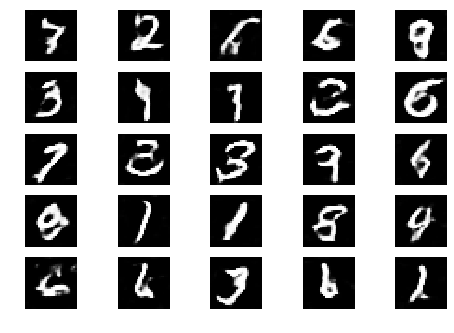

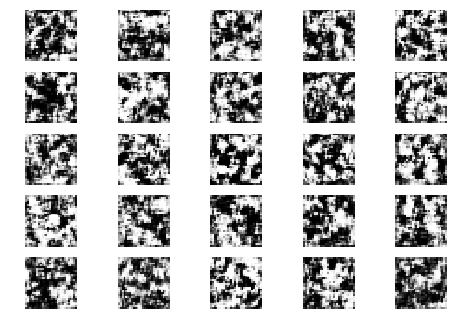

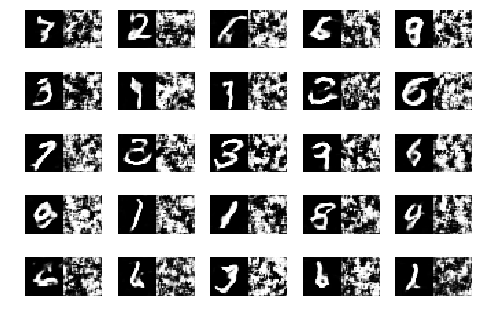

Epoch 0 Batch 1/1875 [D loss: 0.580953, acc.: 68.75%] [G loss: 0.863537]
Epoch 0 Batch 2/1875 [D loss: 0.478345, acc.: 78.12%] [G loss: 1.494935]
Epoch 0 Batch 3/1875 [D loss: 0.481853, acc.: 87.50%] [G loss: 1.805492]
Epoch 0 Batch 4/1875 [D loss: 0.333681, acc.: 93.75%] [G loss: 1.747588]
Epoch 0 Batch 5/1875 [D loss: 0.311433, acc.: 93.75%] [G loss: 2.119164]
Epoch 0 Batch 6/1875 [D loss: 0.326159, acc.: 84.38%] [G loss: 2.106571]
Epoch 0 Batch 7/1875 [D loss: 0.179078, acc.: 100.00%] [G loss: 2.108563]
Epoch 0 Batch 8/1875 [D loss: 0.326092, acc.: 90.62%] [G loss: 2.506442]
Epoch 0 Batch 9/1875 [D loss: 0.312995, acc.: 87.50%] [G loss: 2.325837]
Epoch 0 Batch 10/1875 [D loss: 0.187675, acc.: 90.62%] [G loss: 2.546087]
Epoch 0 Batch 11/1875 [D loss: 0.290444, acc.: 90.62%] [G loss: 2.469622]
Epoch 0 Batch 12/1875 [D loss: 0.262339, acc.: 93.75%] [G loss: 2.251997]
Epoch 0 Batch 13/1875 [D loss: 0.376978, acc.: 84.38%] [G loss: 2.562137]
Epoch 0 Batch 14/1875 [D loss: 0.259942, acc.:

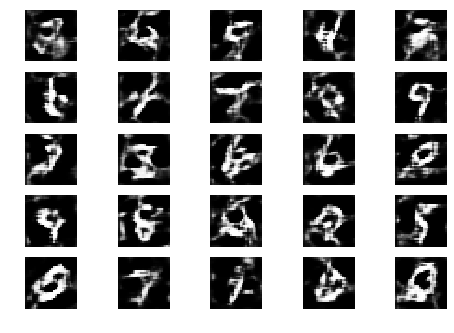

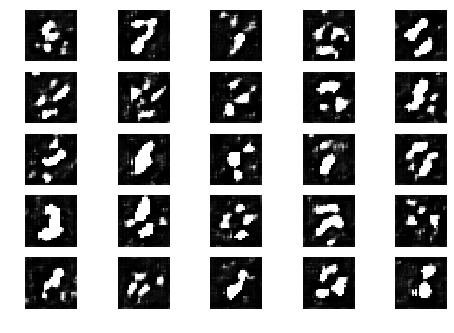

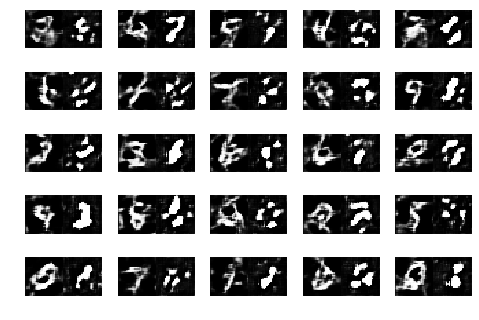

Epoch 0 Batch 101/1875 [D loss: 1.139965, acc.: 31.25%] [G loss: 1.552244]
Epoch 0 Batch 102/1875 [D loss: 0.767141, acc.: 59.38%] [G loss: 1.895113]
Epoch 0 Batch 103/1875 [D loss: 0.974392, acc.: 53.12%] [G loss: 1.778516]
Epoch 0 Batch 104/1875 [D loss: 0.965008, acc.: 50.00%] [G loss: 1.704489]
Epoch 0 Batch 105/1875 [D loss: 0.755717, acc.: 65.62%] [G loss: 1.993335]
Epoch 0 Batch 106/1875 [D loss: 0.755853, acc.: 59.38%] [G loss: 2.176478]
Epoch 0 Batch 107/1875 [D loss: 1.030703, acc.: 53.12%] [G loss: 1.980924]
Epoch 0 Batch 108/1875 [D loss: 0.959525, acc.: 46.88%] [G loss: 1.154820]
Epoch 0 Batch 109/1875 [D loss: 1.038466, acc.: 28.12%] [G loss: 1.227691]
Epoch 0 Batch 110/1875 [D loss: 0.487153, acc.: 71.88%] [G loss: 1.806034]
Epoch 0 Batch 111/1875 [D loss: 0.592685, acc.: 78.12%] [G loss: 2.079386]
Epoch 0 Batch 112/1875 [D loss: 0.598250, acc.: 68.75%] [G loss: 1.817120]
Epoch 0 Batch 113/1875 [D loss: 0.709281, acc.: 53.12%] [G loss: 1.662996]
Epoch 0 Batch 114/1875 [D

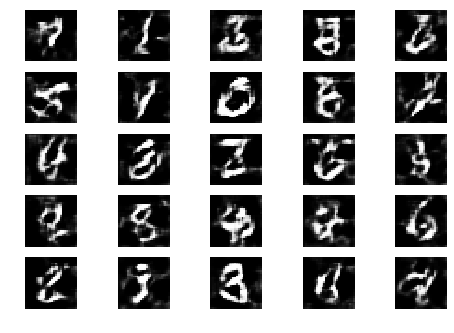

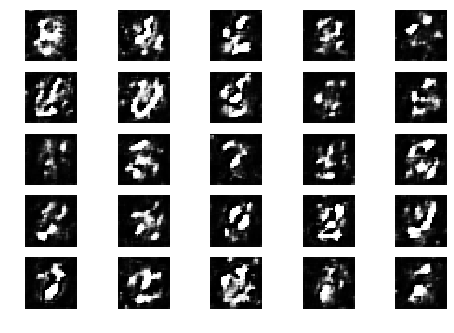

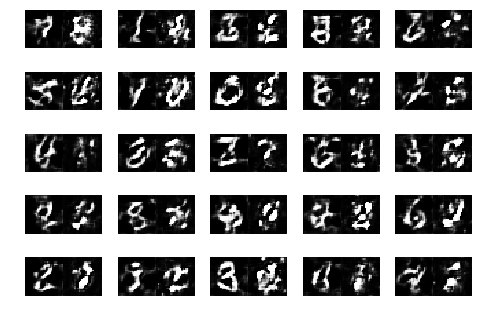

Epoch 0 Batch 201/1875 [D loss: 0.692515, acc.: 53.12%] [G loss: 0.982875]
Epoch 0 Batch 202/1875 [D loss: 0.782958, acc.: 50.00%] [G loss: 1.127714]
Epoch 0 Batch 203/1875 [D loss: 0.691721, acc.: 56.25%] [G loss: 0.852034]
Epoch 0 Batch 204/1875 [D loss: 0.630501, acc.: 62.50%] [G loss: 0.979613]
Epoch 0 Batch 205/1875 [D loss: 0.860893, acc.: 50.00%] [G loss: 1.099283]
Epoch 0 Batch 206/1875 [D loss: 0.953345, acc.: 43.75%] [G loss: 0.911897]
Epoch 0 Batch 207/1875 [D loss: 1.226925, acc.: 28.12%] [G loss: 1.137602]
Epoch 0 Batch 208/1875 [D loss: 1.049777, acc.: 28.12%] [G loss: 1.001136]
Epoch 0 Batch 209/1875 [D loss: 0.897705, acc.: 50.00%] [G loss: 1.430202]
Epoch 0 Batch 210/1875 [D loss: 0.743783, acc.: 50.00%] [G loss: 1.249922]
Epoch 0 Batch 211/1875 [D loss: 0.830616, acc.: 53.12%] [G loss: 1.324295]
Epoch 0 Batch 212/1875 [D loss: 1.108363, acc.: 34.38%] [G loss: 0.823134]
Epoch 0 Batch 213/1875 [D loss: 1.044511, acc.: 40.62%] [G loss: 0.996301]
Epoch 0 Batch 214/1875 [D

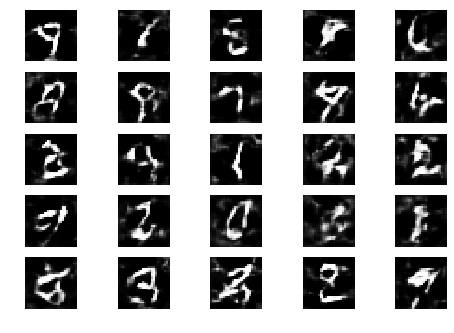

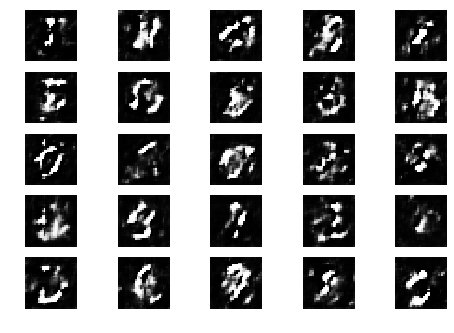

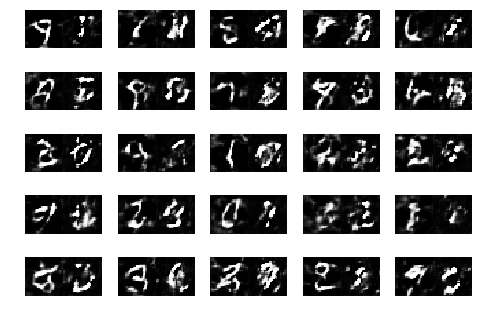

Epoch 0 Batch 301/1875 [D loss: 0.754612, acc.: 50.00%] [G loss: 0.906261]
Epoch 0 Batch 302/1875 [D loss: 1.066533, acc.: 31.25%] [G loss: 1.065731]
Epoch 0 Batch 303/1875 [D loss: 0.904859, acc.: 43.75%] [G loss: 1.012191]
Epoch 0 Batch 304/1875 [D loss: 0.820373, acc.: 43.75%] [G loss: 1.090322]
Epoch 0 Batch 305/1875 [D loss: 0.878539, acc.: 46.88%] [G loss: 1.081860]
Epoch 0 Batch 306/1875 [D loss: 0.889103, acc.: 34.38%] [G loss: 1.224517]
Epoch 0 Batch 307/1875 [D loss: 0.917236, acc.: 31.25%] [G loss: 0.934398]
Epoch 0 Batch 308/1875 [D loss: 0.787034, acc.: 59.38%] [G loss: 1.263946]
Epoch 0 Batch 309/1875 [D loss: 0.688546, acc.: 62.50%] [G loss: 0.932534]
Epoch 0 Batch 310/1875 [D loss: 0.973692, acc.: 37.50%] [G loss: 0.945691]
Epoch 0 Batch 311/1875 [D loss: 0.720236, acc.: 56.25%] [G loss: 1.064042]
Epoch 0 Batch 312/1875 [D loss: 0.703615, acc.: 68.75%] [G loss: 1.026052]
Epoch 0 Batch 313/1875 [D loss: 0.948441, acc.: 43.75%] [G loss: 1.097827]
Epoch 0 Batch 314/1875 [D

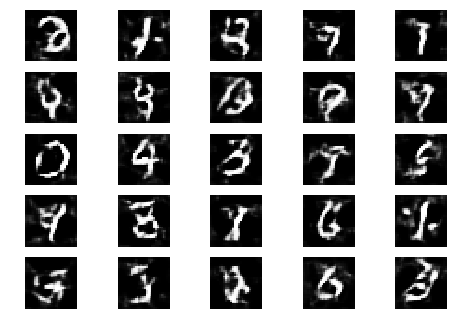

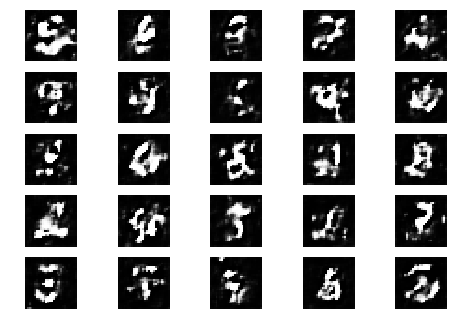

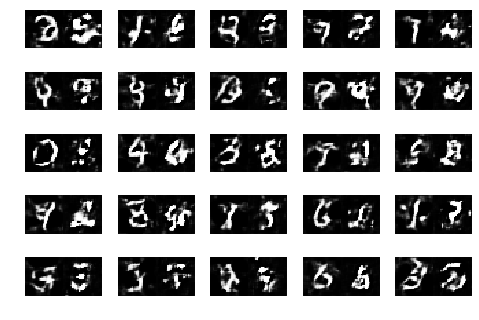

Epoch 0 Batch 401/1875 [D loss: 0.867177, acc.: 46.88%] [G loss: 0.981749]
Epoch 0 Batch 402/1875 [D loss: 0.788496, acc.: 46.88%] [G loss: 0.921869]
Epoch 0 Batch 403/1875 [D loss: 0.870595, acc.: 43.75%] [G loss: 0.748477]
Epoch 0 Batch 404/1875 [D loss: 0.879430, acc.: 50.00%] [G loss: 0.968453]
Epoch 0 Batch 405/1875 [D loss: 0.802535, acc.: 56.25%] [G loss: 1.026570]
Epoch 0 Batch 406/1875 [D loss: 0.892234, acc.: 31.25%] [G loss: 1.135079]
Epoch 0 Batch 407/1875 [D loss: 0.675064, acc.: 68.75%] [G loss: 0.871657]
Epoch 0 Batch 408/1875 [D loss: 0.847377, acc.: 46.88%] [G loss: 0.746002]
Epoch 0 Batch 409/1875 [D loss: 0.881180, acc.: 37.50%] [G loss: 1.016663]
Epoch 0 Batch 410/1875 [D loss: 0.937954, acc.: 50.00%] [G loss: 1.021402]
Epoch 0 Batch 411/1875 [D loss: 0.818787, acc.: 50.00%] [G loss: 1.089435]
Epoch 0 Batch 412/1875 [D loss: 0.808470, acc.: 46.88%] [G loss: 0.945339]
Epoch 0 Batch 413/1875 [D loss: 0.777212, acc.: 46.88%] [G loss: 1.092362]
Epoch 0 Batch 414/1875 [D

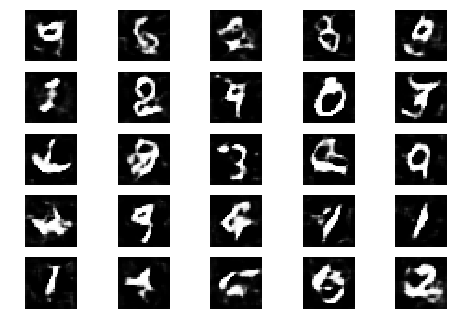

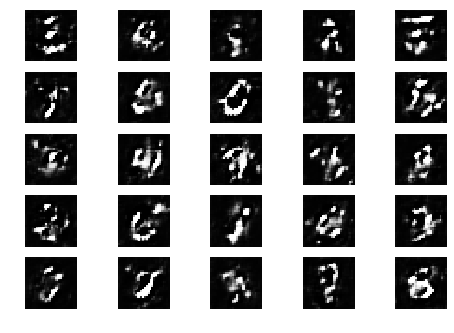

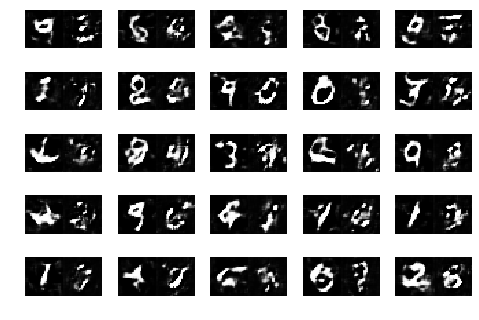

Epoch 0 Batch 501/1875 [D loss: 0.853097, acc.: 46.88%] [G loss: 1.109907]
Epoch 0 Batch 502/1875 [D loss: 0.802935, acc.: 56.25%] [G loss: 1.015151]
Epoch 0 Batch 503/1875 [D loss: 0.825590, acc.: 46.88%] [G loss: 0.814972]
Epoch 0 Batch 504/1875 [D loss: 0.947117, acc.: 46.88%] [G loss: 0.881873]
Epoch 0 Batch 505/1875 [D loss: 0.847482, acc.: 46.88%] [G loss: 0.902336]
Epoch 0 Batch 506/1875 [D loss: 0.906303, acc.: 40.62%] [G loss: 0.912767]
Epoch 0 Batch 507/1875 [D loss: 0.800523, acc.: 50.00%] [G loss: 1.003759]
Epoch 0 Batch 508/1875 [D loss: 0.878939, acc.: 37.50%] [G loss: 0.827917]
Epoch 0 Batch 509/1875 [D loss: 0.856719, acc.: 40.62%] [G loss: 0.944551]
Epoch 0 Batch 510/1875 [D loss: 0.825605, acc.: 43.75%] [G loss: 1.140913]
Epoch 0 Batch 511/1875 [D loss: 0.777243, acc.: 53.12%] [G loss: 1.014016]
Epoch 0 Batch 512/1875 [D loss: 0.684643, acc.: 59.38%] [G loss: 0.925254]
Epoch 0 Batch 513/1875 [D loss: 0.761875, acc.: 46.88%] [G loss: 0.910828]
Epoch 0 Batch 514/1875 [D

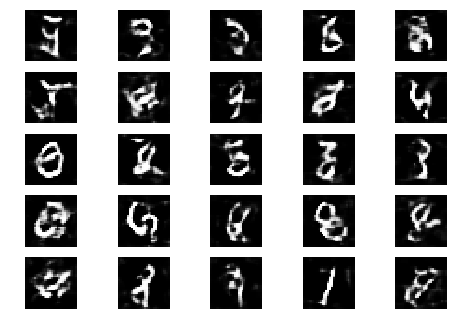

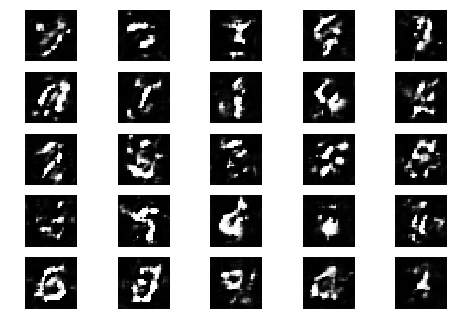

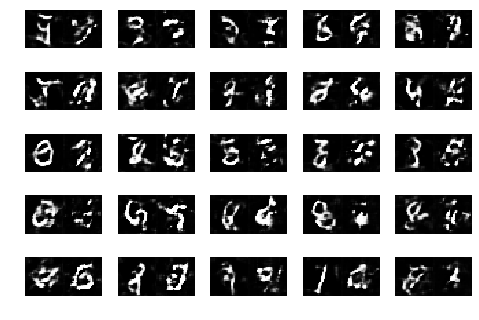

Epoch 0 Batch 601/1875 [D loss: 0.769203, acc.: 56.25%] [G loss: 0.947474]
Epoch 0 Batch 602/1875 [D loss: 0.837294, acc.: 53.12%] [G loss: 0.771912]
Epoch 0 Batch 603/1875 [D loss: 0.776690, acc.: 43.75%] [G loss: 0.787311]
Epoch 0 Batch 604/1875 [D loss: 0.940577, acc.: 37.50%] [G loss: 0.919628]
Epoch 0 Batch 605/1875 [D loss: 0.746253, acc.: 56.25%] [G loss: 0.964508]
Epoch 0 Batch 606/1875 [D loss: 0.863101, acc.: 40.62%] [G loss: 0.828302]
Epoch 0 Batch 607/1875 [D loss: 0.858585, acc.: 43.75%] [G loss: 0.795065]
Epoch 0 Batch 608/1875 [D loss: 0.764442, acc.: 46.88%] [G loss: 0.882425]
Epoch 0 Batch 609/1875 [D loss: 0.766219, acc.: 46.88%] [G loss: 0.869852]
Epoch 0 Batch 610/1875 [D loss: 0.592591, acc.: 65.62%] [G loss: 0.907245]
Epoch 0 Batch 611/1875 [D loss: 0.595991, acc.: 62.50%] [G loss: 1.085914]
Epoch 0 Batch 612/1875 [D loss: 0.742280, acc.: 53.12%] [G loss: 0.832875]
Epoch 0 Batch 613/1875 [D loss: 0.791145, acc.: 46.88%] [G loss: 1.028084]
Epoch 0 Batch 614/1875 [D

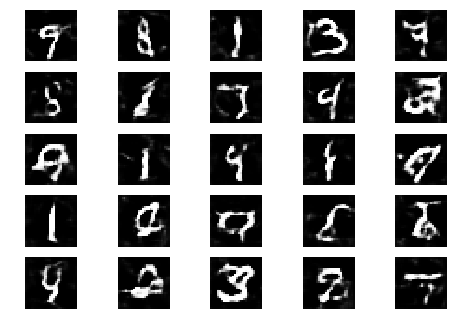

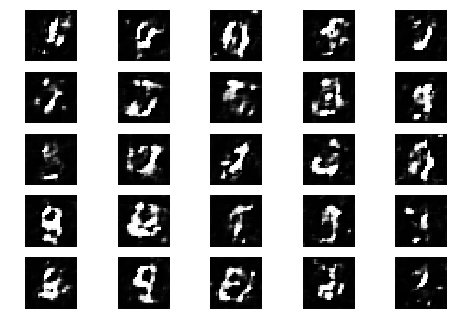

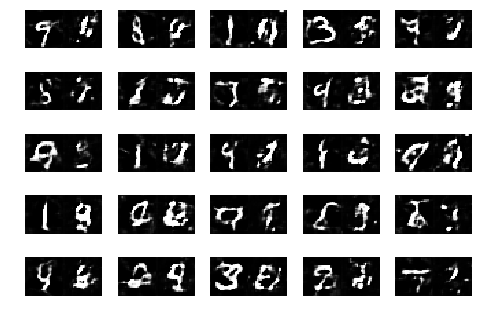

Epoch 0 Batch 701/1875 [D loss: 0.798000, acc.: 43.75%] [G loss: 0.871750]
Epoch 0 Batch 702/1875 [D loss: 0.860434, acc.: 43.75%] [G loss: 0.756187]
Epoch 0 Batch 703/1875 [D loss: 0.791391, acc.: 46.88%] [G loss: 0.741139]
Epoch 0 Batch 704/1875 [D loss: 0.777850, acc.: 50.00%] [G loss: 0.878488]
Epoch 0 Batch 705/1875 [D loss: 0.900166, acc.: 43.75%] [G loss: 0.844645]
Epoch 0 Batch 706/1875 [D loss: 0.720675, acc.: 50.00%] [G loss: 0.939674]
Epoch 0 Batch 707/1875 [D loss: 0.759212, acc.: 50.00%] [G loss: 0.937244]
Epoch 0 Batch 708/1875 [D loss: 0.826720, acc.: 46.88%] [G loss: 0.931077]
Epoch 0 Batch 709/1875 [D loss: 0.647884, acc.: 68.75%] [G loss: 1.041180]
Epoch 0 Batch 710/1875 [D loss: 0.870343, acc.: 37.50%] [G loss: 0.887059]
Epoch 0 Batch 711/1875 [D loss: 0.688212, acc.: 56.25%] [G loss: 1.009233]
Epoch 0 Batch 712/1875 [D loss: 0.710038, acc.: 46.88%] [G loss: 0.842313]
Epoch 0 Batch 713/1875 [D loss: 0.720420, acc.: 53.12%] [G loss: 1.115564]
Epoch 0 Batch 714/1875 [D

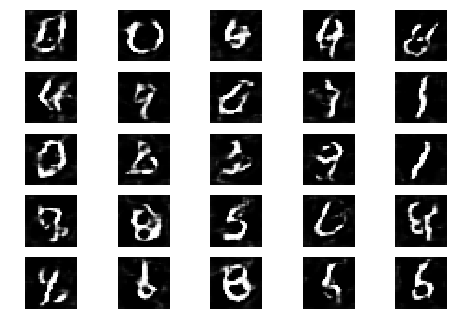

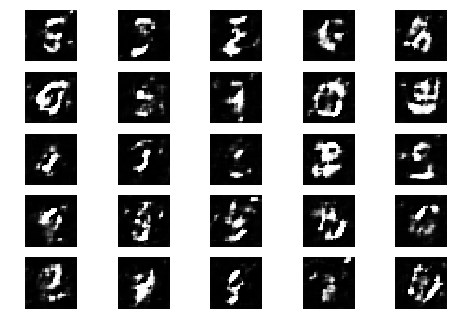

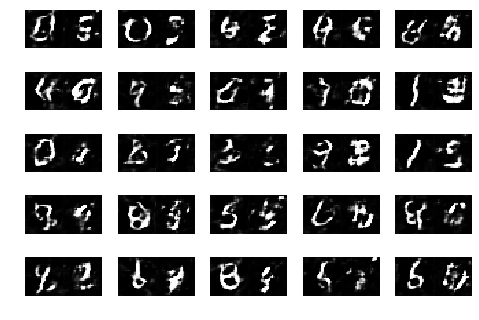

Epoch 0 Batch 801/1875 [D loss: 0.646540, acc.: 65.62%] [G loss: 0.752382]
Epoch 0 Batch 802/1875 [D loss: 0.775138, acc.: 46.88%] [G loss: 0.817154]
Epoch 0 Batch 803/1875 [D loss: 0.774615, acc.: 43.75%] [G loss: 1.033983]
Epoch 0 Batch 804/1875 [D loss: 0.822584, acc.: 43.75%] [G loss: 1.001615]
Epoch 0 Batch 805/1875 [D loss: 0.737134, acc.: 56.25%] [G loss: 0.900128]
Epoch 0 Batch 806/1875 [D loss: 0.652762, acc.: 56.25%] [G loss: 0.849887]
Epoch 0 Batch 807/1875 [D loss: 0.757962, acc.: 50.00%] [G loss: 0.829674]
Epoch 0 Batch 808/1875 [D loss: 0.747824, acc.: 50.00%] [G loss: 0.883011]
Epoch 0 Batch 809/1875 [D loss: 0.835299, acc.: 40.62%] [G loss: 0.900116]
Epoch 0 Batch 810/1875 [D loss: 0.678530, acc.: 65.62%] [G loss: 0.874965]
Epoch 0 Batch 811/1875 [D loss: 0.782474, acc.: 50.00%] [G loss: 0.997826]
Epoch 0 Batch 812/1875 [D loss: 0.720943, acc.: 53.12%] [G loss: 0.952366]
Epoch 0 Batch 813/1875 [D loss: 0.719139, acc.: 53.12%] [G loss: 0.870682]
Epoch 0 Batch 814/1875 [D

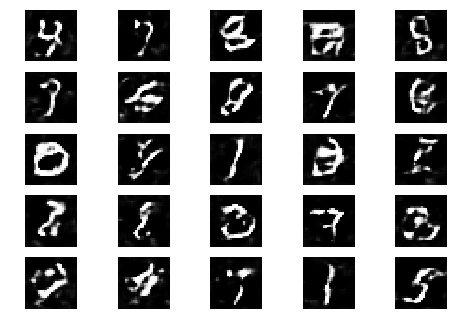

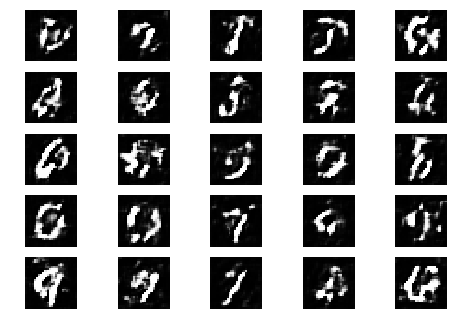

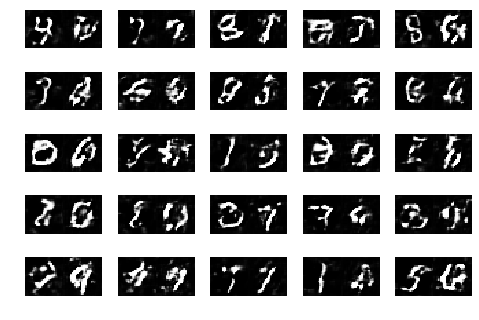

Epoch 0 Batch 901/1875 [D loss: 0.667969, acc.: 56.25%] [G loss: 0.865227]
Epoch 0 Batch 902/1875 [D loss: 0.751061, acc.: 50.00%] [G loss: 0.877120]
Epoch 0 Batch 903/1875 [D loss: 0.720006, acc.: 50.00%] [G loss: 0.928514]
Epoch 0 Batch 904/1875 [D loss: 0.745954, acc.: 50.00%] [G loss: 1.113372]
Epoch 0 Batch 905/1875 [D loss: 0.767597, acc.: 50.00%] [G loss: 0.886918]
Epoch 0 Batch 906/1875 [D loss: 0.646502, acc.: 56.25%] [G loss: 0.991073]
Epoch 0 Batch 907/1875 [D loss: 0.704046, acc.: 46.88%] [G loss: 1.088707]
Epoch 0 Batch 908/1875 [D loss: 0.616566, acc.: 65.62%] [G loss: 1.111468]
Epoch 0 Batch 909/1875 [D loss: 0.906709, acc.: 18.75%] [G loss: 0.803498]
Epoch 0 Batch 910/1875 [D loss: 0.698686, acc.: 59.38%] [G loss: 1.006623]
Epoch 0 Batch 911/1875 [D loss: 0.741208, acc.: 53.12%] [G loss: 0.889174]
Epoch 0 Batch 912/1875 [D loss: 0.744804, acc.: 46.88%] [G loss: 0.902785]
Epoch 0 Batch 913/1875 [D loss: 0.689116, acc.: 62.50%] [G loss: 1.122182]
Epoch 0 Batch 914/1875 [D

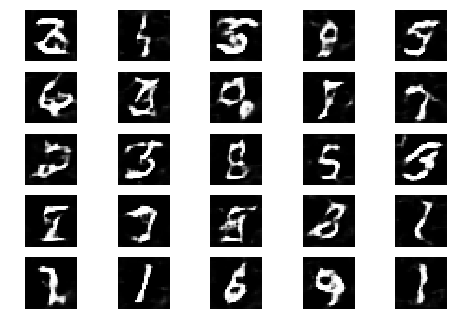

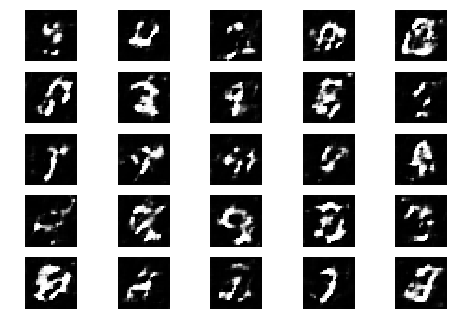

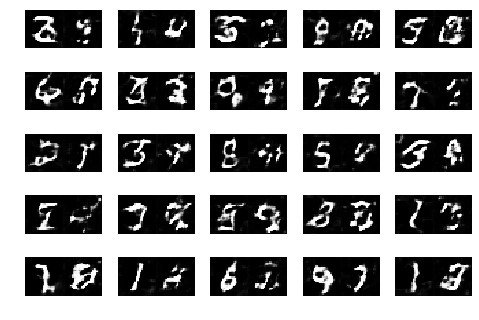

Epoch 0 Batch 1001/1875 [D loss: 0.739577, acc.: 53.12%] [G loss: 0.814611]
Epoch 0 Batch 1002/1875 [D loss: 0.756948, acc.: 53.12%] [G loss: 0.801456]
Epoch 0 Batch 1003/1875 [D loss: 0.730546, acc.: 50.00%] [G loss: 0.804262]
Epoch 0 Batch 1004/1875 [D loss: 0.813800, acc.: 46.88%] [G loss: 0.888131]
Epoch 0 Batch 1005/1875 [D loss: 0.675044, acc.: 59.38%] [G loss: 0.873709]
Epoch 0 Batch 1006/1875 [D loss: 0.729461, acc.: 62.50%] [G loss: 0.797362]
Epoch 0 Batch 1007/1875 [D loss: 0.735308, acc.: 43.75%] [G loss: 0.900704]
Epoch 0 Batch 1008/1875 [D loss: 0.694167, acc.: 59.38%] [G loss: 0.909584]
Epoch 0 Batch 1009/1875 [D loss: 0.595152, acc.: 71.88%] [G loss: 1.020812]
Epoch 0 Batch 1010/1875 [D loss: 0.730304, acc.: 43.75%] [G loss: 0.869903]
Epoch 0 Batch 1011/1875 [D loss: 0.840441, acc.: 46.88%] [G loss: 0.867157]
Epoch 0 Batch 1012/1875 [D loss: 0.628723, acc.: 56.25%] [G loss: 1.006834]
Epoch 0 Batch 1013/1875 [D loss: 0.766984, acc.: 53.12%] [G loss: 0.885084]
Epoch 0 Batc

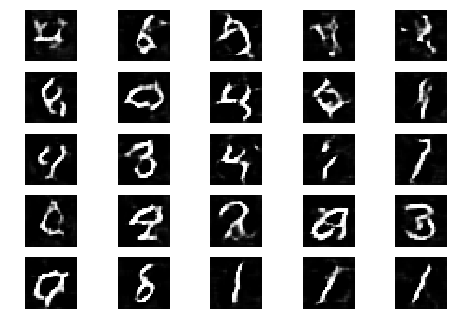

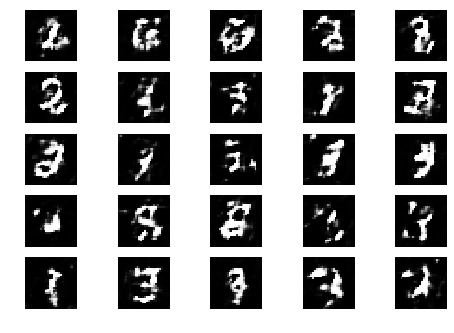

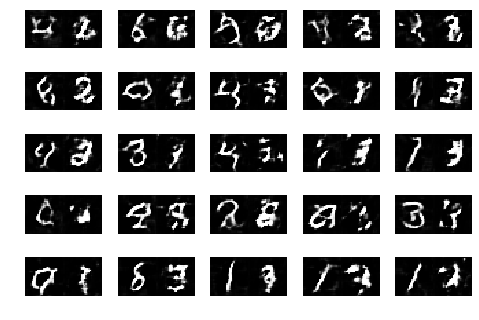

Epoch 0 Batch 1101/1875 [D loss: 0.831704, acc.: 34.38%] [G loss: 1.023837]
Epoch 0 Batch 1102/1875 [D loss: 0.680469, acc.: 53.12%] [G loss: 0.967454]
Epoch 0 Batch 1103/1875 [D loss: 0.838056, acc.: 37.50%] [G loss: 0.988668]
Epoch 0 Batch 1104/1875 [D loss: 0.764695, acc.: 40.62%] [G loss: 0.812371]
Epoch 0 Batch 1105/1875 [D loss: 0.666402, acc.: 62.50%] [G loss: 0.779128]
Epoch 0 Batch 1106/1875 [D loss: 0.702339, acc.: 59.38%] [G loss: 0.913664]
Epoch 0 Batch 1107/1875 [D loss: 0.701791, acc.: 53.12%] [G loss: 1.018677]
Epoch 0 Batch 1108/1875 [D loss: 0.668168, acc.: 59.38%] [G loss: 0.997729]
Epoch 0 Batch 1109/1875 [D loss: 0.629961, acc.: 68.75%] [G loss: 0.885232]
Epoch 0 Batch 1110/1875 [D loss: 0.813259, acc.: 50.00%] [G loss: 0.950251]
Epoch 0 Batch 1111/1875 [D loss: 0.767352, acc.: 50.00%] [G loss: 0.981336]
Epoch 0 Batch 1112/1875 [D loss: 0.692570, acc.: 62.50%] [G loss: 0.881016]
Epoch 0 Batch 1113/1875 [D loss: 0.752617, acc.: 40.62%] [G loss: 0.922806]
Epoch 0 Batc

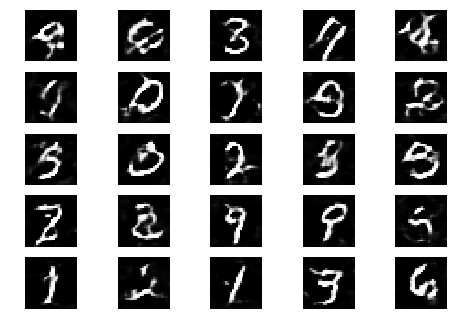

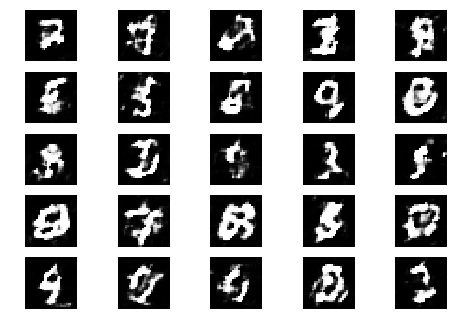

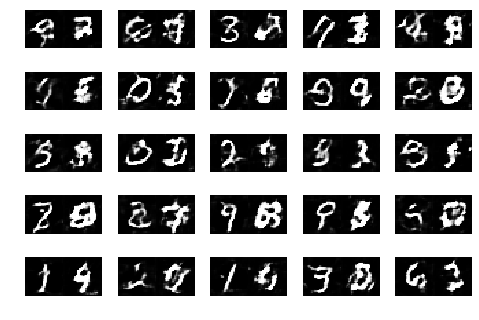

Epoch 0 Batch 1201/1875 [D loss: 0.661561, acc.: 62.50%] [G loss: 1.062267]
Epoch 0 Batch 1202/1875 [D loss: 0.585979, acc.: 71.88%] [G loss: 1.178922]
Epoch 0 Batch 1203/1875 [D loss: 0.858489, acc.: 43.75%] [G loss: 1.073086]
Epoch 0 Batch 1204/1875 [D loss: 0.794063, acc.: 34.38%] [G loss: 1.055743]
Epoch 0 Batch 1205/1875 [D loss: 0.683934, acc.: 59.38%] [G loss: 1.071160]
Epoch 0 Batch 1206/1875 [D loss: 0.696018, acc.: 59.38%] [G loss: 1.056681]
Epoch 0 Batch 1207/1875 [D loss: 0.618253, acc.: 71.88%] [G loss: 1.120064]
Epoch 0 Batch 1208/1875 [D loss: 0.680913, acc.: 56.25%] [G loss: 0.928630]
Epoch 0 Batch 1209/1875 [D loss: 0.725606, acc.: 50.00%] [G loss: 0.858687]
Epoch 0 Batch 1210/1875 [D loss: 0.794137, acc.: 43.75%] [G loss: 0.835815]
Epoch 0 Batch 1211/1875 [D loss: 0.852342, acc.: 34.38%] [G loss: 0.832015]
Epoch 0 Batch 1212/1875 [D loss: 0.773821, acc.: 50.00%] [G loss: 0.948135]
Epoch 0 Batch 1213/1875 [D loss: 0.618634, acc.: 68.75%] [G loss: 0.869782]
Epoch 0 Batc

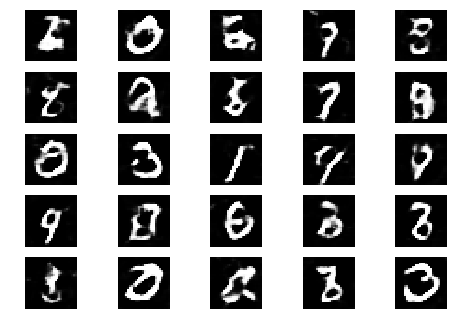

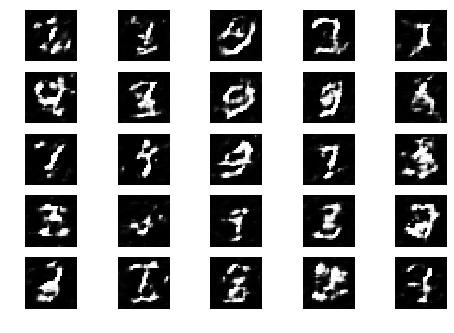

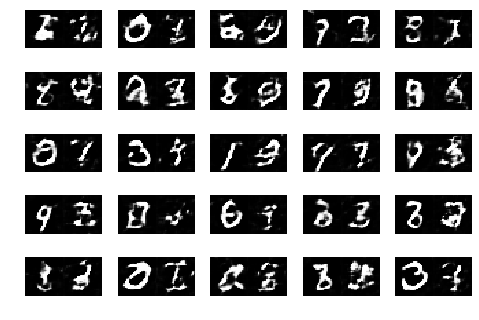

Epoch 0 Batch 1301/1875 [D loss: 0.830904, acc.: 50.00%] [G loss: 0.876725]
Epoch 0 Batch 1302/1875 [D loss: 0.721082, acc.: 56.25%] [G loss: 0.930074]
Epoch 0 Batch 1303/1875 [D loss: 0.650504, acc.: 65.62%] [G loss: 0.802332]
Epoch 0 Batch 1304/1875 [D loss: 0.601608, acc.: 68.75%] [G loss: 0.940827]
Epoch 0 Batch 1305/1875 [D loss: 0.696622, acc.: 59.38%] [G loss: 0.922493]
Epoch 0 Batch 1306/1875 [D loss: 0.787299, acc.: 31.25%] [G loss: 0.928980]
Epoch 0 Batch 1307/1875 [D loss: 0.695369, acc.: 53.12%] [G loss: 0.924741]
Epoch 0 Batch 1308/1875 [D loss: 0.725805, acc.: 59.38%] [G loss: 0.722602]
Epoch 0 Batch 1309/1875 [D loss: 0.734670, acc.: 53.12%] [G loss: 0.749258]
Epoch 0 Batch 1310/1875 [D loss: 0.846530, acc.: 34.38%] [G loss: 0.865241]
Epoch 0 Batch 1311/1875 [D loss: 0.731788, acc.: 50.00%] [G loss: 0.944363]
Epoch 0 Batch 1312/1875 [D loss: 0.722516, acc.: 65.62%] [G loss: 0.935637]
Epoch 0 Batch 1313/1875 [D loss: 0.739525, acc.: 50.00%] [G loss: 0.975946]
Epoch 0 Batc

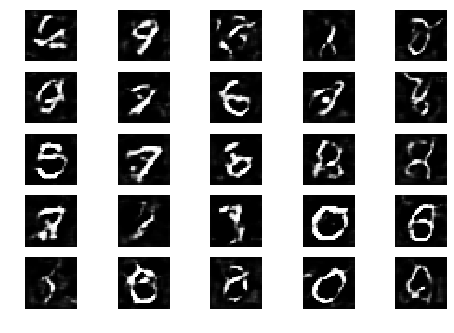

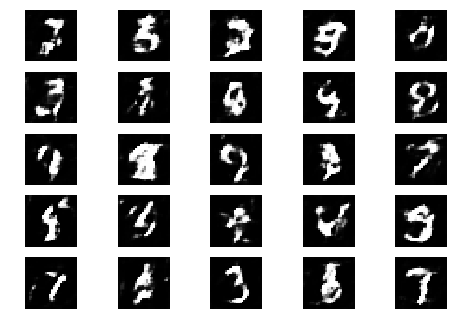

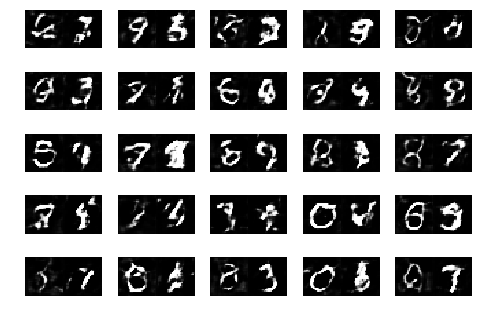

Epoch 0 Batch 1401/1875 [D loss: 0.742010, acc.: 43.75%] [G loss: 0.951034]
Epoch 0 Batch 1402/1875 [D loss: 0.704789, acc.: 56.25%] [G loss: 0.843949]
Epoch 0 Batch 1403/1875 [D loss: 0.714271, acc.: 65.62%] [G loss: 0.999042]
Epoch 0 Batch 1404/1875 [D loss: 0.691656, acc.: 59.38%] [G loss: 0.816335]
Epoch 0 Batch 1405/1875 [D loss: 0.678061, acc.: 68.75%] [G loss: 0.953771]
Epoch 0 Batch 1406/1875 [D loss: 0.660029, acc.: 62.50%] [G loss: 0.967234]
Epoch 0 Batch 1407/1875 [D loss: 0.661261, acc.: 53.12%] [G loss: 0.959278]
Epoch 0 Batch 1408/1875 [D loss: 0.597212, acc.: 65.62%] [G loss: 0.885025]
Epoch 0 Batch 1409/1875 [D loss: 0.761010, acc.: 46.88%] [G loss: 1.023497]
Epoch 0 Batch 1410/1875 [D loss: 0.709093, acc.: 62.50%] [G loss: 0.909636]
Epoch 0 Batch 1411/1875 [D loss: 0.680980, acc.: 59.38%] [G loss: 0.877234]
Epoch 0 Batch 1412/1875 [D loss: 0.656412, acc.: 56.25%] [G loss: 0.948406]
Epoch 0 Batch 1413/1875 [D loss: 0.638400, acc.: 71.88%] [G loss: 0.896566]
Epoch 0 Batc

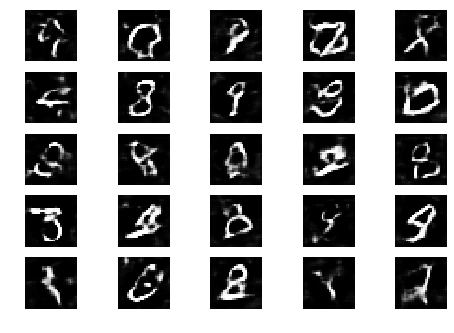

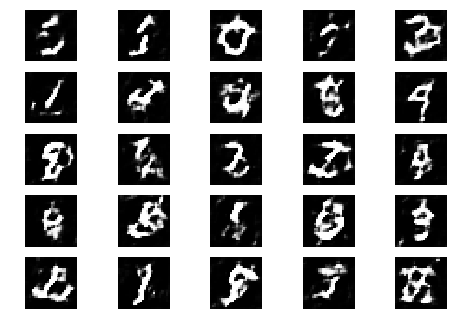

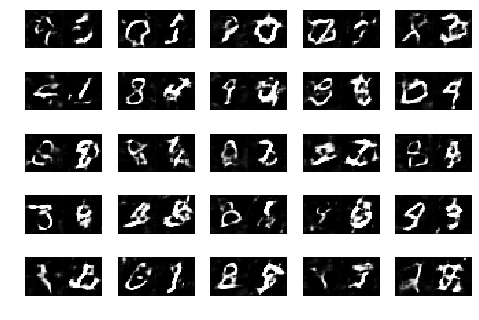

Epoch 0 Batch 1501/1875 [D loss: 0.699546, acc.: 59.38%] [G loss: 0.890568]
Epoch 0 Batch 1502/1875 [D loss: 0.851760, acc.: 43.75%] [G loss: 0.908867]
Epoch 0 Batch 1503/1875 [D loss: 0.722246, acc.: 56.25%] [G loss: 1.094271]
Epoch 0 Batch 1504/1875 [D loss: 0.827967, acc.: 37.50%] [G loss: 1.097728]
Epoch 0 Batch 1505/1875 [D loss: 0.770268, acc.: 46.88%] [G loss: 1.001775]
Epoch 0 Batch 1506/1875 [D loss: 0.652120, acc.: 71.88%] [G loss: 1.091512]
Epoch 0 Batch 1507/1875 [D loss: 0.622427, acc.: 62.50%] [G loss: 1.090026]
Epoch 0 Batch 1508/1875 [D loss: 0.631440, acc.: 71.88%] [G loss: 0.879256]
Epoch 0 Batch 1509/1875 [D loss: 0.703638, acc.: 56.25%] [G loss: 0.784902]
Epoch 0 Batch 1510/1875 [D loss: 0.830065, acc.: 40.62%] [G loss: 0.809228]
Epoch 0 Batch 1511/1875 [D loss: 0.605595, acc.: 62.50%] [G loss: 0.646424]
Epoch 0 Batch 1512/1875 [D loss: 0.813972, acc.: 40.62%] [G loss: 0.716380]
Epoch 0 Batch 1513/1875 [D loss: 0.805887, acc.: 46.88%] [G loss: 0.960773]
Epoch 0 Batc

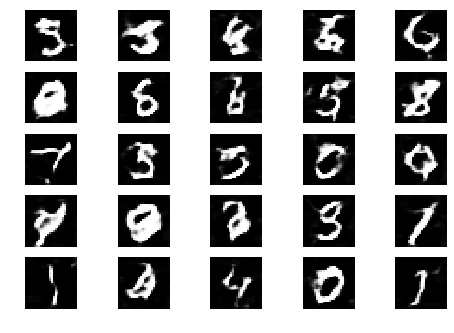

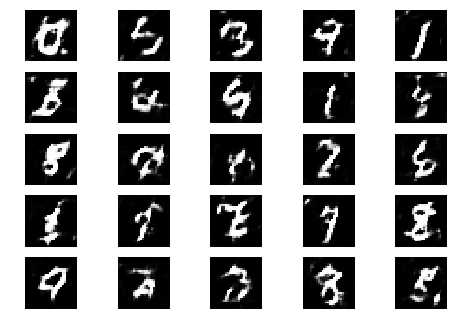

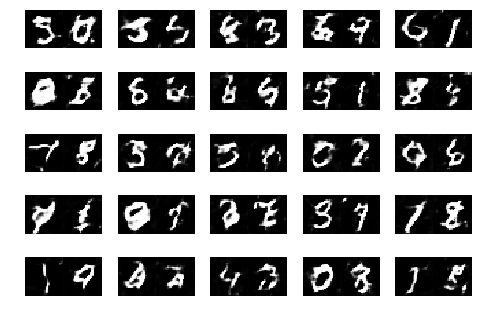

Epoch 0 Batch 1601/1875 [D loss: 0.739485, acc.: 53.12%] [G loss: 0.982106]
Epoch 0 Batch 1602/1875 [D loss: 0.814979, acc.: 50.00%] [G loss: 0.996246]
Epoch 0 Batch 1603/1875 [D loss: 0.688659, acc.: 62.50%] [G loss: 0.940414]
Epoch 0 Batch 1604/1875 [D loss: 0.738731, acc.: 53.12%] [G loss: 0.842916]
Epoch 0 Batch 1605/1875 [D loss: 0.642490, acc.: 65.62%] [G loss: 0.950343]
Epoch 0 Batch 1606/1875 [D loss: 0.787114, acc.: 50.00%] [G loss: 0.808806]
Epoch 0 Batch 1607/1875 [D loss: 0.699452, acc.: 62.50%] [G loss: 0.875837]
Epoch 0 Batch 1608/1875 [D loss: 0.691407, acc.: 59.38%] [G loss: 1.009698]
Epoch 0 Batch 1609/1875 [D loss: 0.743531, acc.: 43.75%] [G loss: 0.941447]
Epoch 0 Batch 1610/1875 [D loss: 0.950404, acc.: 37.50%] [G loss: 0.933247]
Epoch 0 Batch 1611/1875 [D loss: 0.901557, acc.: 31.25%] [G loss: 0.879788]
Epoch 0 Batch 1612/1875 [D loss: 0.705205, acc.: 56.25%] [G loss: 1.004984]
Epoch 0 Batch 1613/1875 [D loss: 0.709262, acc.: 53.12%] [G loss: 0.885340]
Epoch 0 Batc

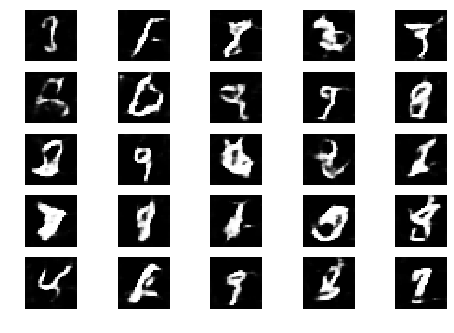

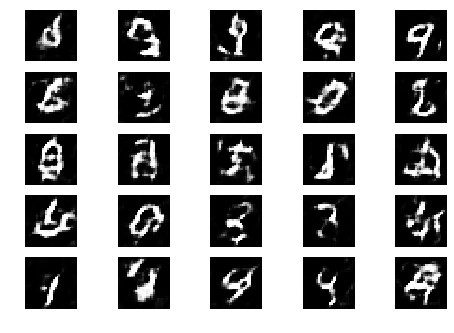

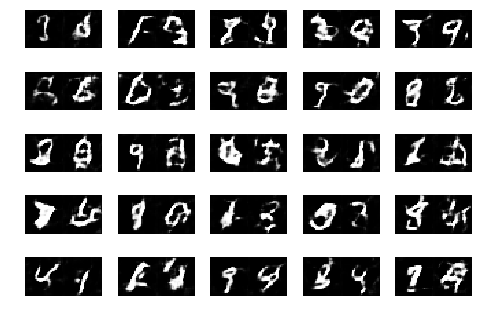

Epoch 0 Batch 1701/1875 [D loss: 0.750660, acc.: 43.75%] [G loss: 0.753193]
Epoch 0 Batch 1702/1875 [D loss: 0.752932, acc.: 56.25%] [G loss: 0.915349]
Epoch 0 Batch 1703/1875 [D loss: 0.646555, acc.: 65.62%] [G loss: 0.936173]
Epoch 0 Batch 1704/1875 [D loss: 0.728189, acc.: 56.25%] [G loss: 0.832832]
Epoch 0 Batch 1705/1875 [D loss: 0.557719, acc.: 71.88%] [G loss: 0.863058]
Epoch 0 Batch 1706/1875 [D loss: 0.598762, acc.: 62.50%] [G loss: 0.961818]
Epoch 0 Batch 1707/1875 [D loss: 0.647795, acc.: 65.62%] [G loss: 0.936052]
Epoch 0 Batch 1708/1875 [D loss: 0.714131, acc.: 46.88%] [G loss: 1.029140]
Epoch 0 Batch 1709/1875 [D loss: 0.793568, acc.: 43.75%] [G loss: 1.025511]
Epoch 0 Batch 1710/1875 [D loss: 0.591577, acc.: 68.75%] [G loss: 0.838132]
Epoch 0 Batch 1711/1875 [D loss: 0.803281, acc.: 46.88%] [G loss: 0.830533]
Epoch 0 Batch 1712/1875 [D loss: 0.703094, acc.: 65.62%] [G loss: 0.740982]
Epoch 0 Batch 1713/1875 [D loss: 0.770360, acc.: 43.75%] [G loss: 0.949637]
Epoch 0 Batc

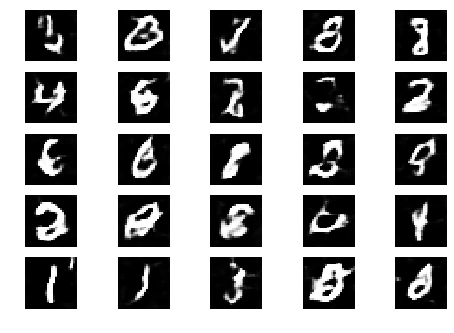

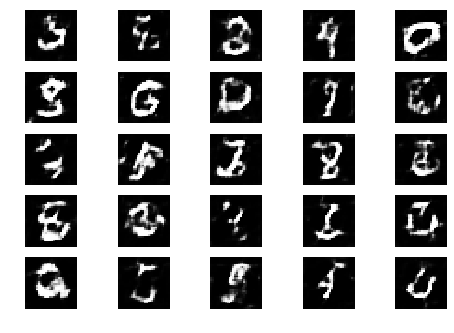

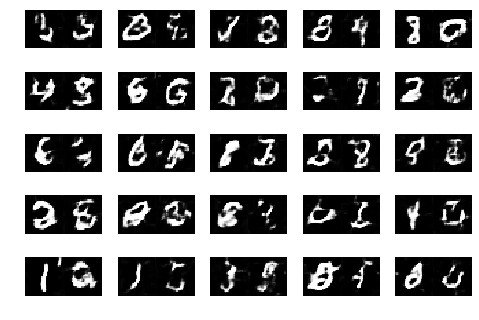

Epoch 0 Batch 1801/1875 [D loss: 0.636034, acc.: 65.62%] [G loss: 0.902825]
Epoch 0 Batch 1802/1875 [D loss: 0.736394, acc.: 50.00%] [G loss: 0.916757]
Epoch 0 Batch 1803/1875 [D loss: 0.767812, acc.: 53.12%] [G loss: 0.921951]
Epoch 0 Batch 1804/1875 [D loss: 0.690636, acc.: 65.62%] [G loss: 1.054001]
Epoch 0 Batch 1805/1875 [D loss: 0.686155, acc.: 56.25%] [G loss: 1.083740]
Epoch 0 Batch 1806/1875 [D loss: 0.652187, acc.: 59.38%] [G loss: 1.195832]
Epoch 0 Batch 1807/1875 [D loss: 0.564056, acc.: 65.62%] [G loss: 1.110830]
Epoch 0 Batch 1808/1875 [D loss: 0.722712, acc.: 62.50%] [G loss: 1.050839]
Epoch 0 Batch 1809/1875 [D loss: 0.622005, acc.: 68.75%] [G loss: 1.188559]
Epoch 0 Batch 1810/1875 [D loss: 0.735443, acc.: 50.00%] [G loss: 1.043480]
Epoch 0 Batch 1811/1875 [D loss: 0.699559, acc.: 50.00%] [G loss: 0.935838]
Epoch 0 Batch 1812/1875 [D loss: 0.786715, acc.: 34.38%] [G loss: 0.977710]
Epoch 0 Batch 1813/1875 [D loss: 0.718554, acc.: 50.00%] [G loss: 1.019641]
Epoch 0 Batc

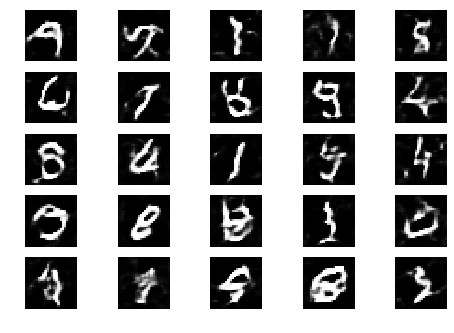

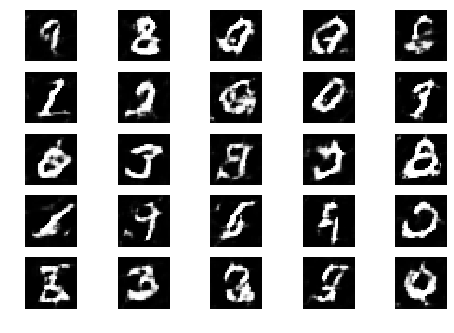

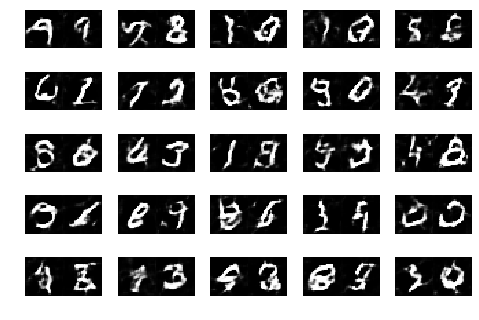

Epoch 1 Batch 1/1875 [D loss: 0.669112, acc.: 68.75%] [G loss: 0.865003]
Epoch 1 Batch 2/1875 [D loss: 0.758904, acc.: 56.25%] [G loss: 0.931884]
Epoch 1 Batch 3/1875 [D loss: 0.625682, acc.: 62.50%] [G loss: 0.943256]
Epoch 1 Batch 4/1875 [D loss: 0.673404, acc.: 62.50%] [G loss: 1.055140]
Epoch 1 Batch 5/1875 [D loss: 0.604382, acc.: 68.75%] [G loss: 1.041578]
Epoch 1 Batch 6/1875 [D loss: 0.718253, acc.: 53.12%] [G loss: 1.093084]
Epoch 1 Batch 7/1875 [D loss: 0.705232, acc.: 56.25%] [G loss: 0.891321]
Epoch 1 Batch 8/1875 [D loss: 0.657553, acc.: 62.50%] [G loss: 0.765843]
Epoch 1 Batch 9/1875 [D loss: 0.642893, acc.: 68.75%] [G loss: 0.798054]
Epoch 1 Batch 10/1875 [D loss: 0.780601, acc.: 56.25%] [G loss: 0.884274]
Epoch 1 Batch 11/1875 [D loss: 0.776103, acc.: 50.00%] [G loss: 0.819645]
Epoch 1 Batch 12/1875 [D loss: 0.734650, acc.: 50.00%] [G loss: 0.934500]
Epoch 1 Batch 13/1875 [D loss: 0.659977, acc.: 50.00%] [G loss: 0.976149]
Epoch 1 Batch 14/1875 [D loss: 0.707729, acc.: 

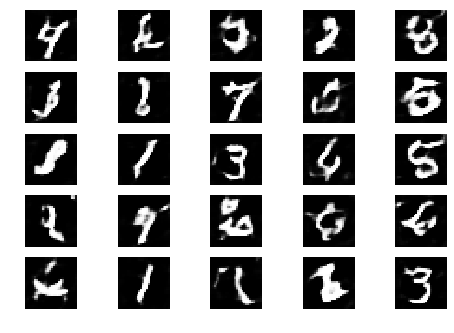

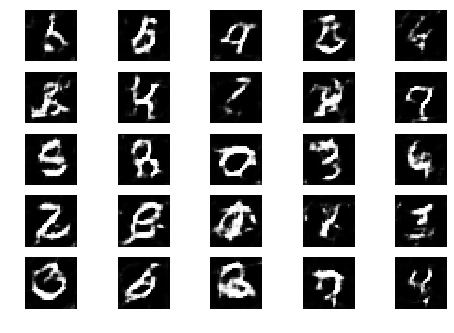

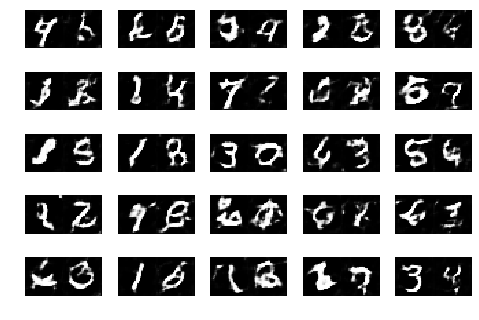

Epoch 1 Batch 101/1875 [D loss: 0.541071, acc.: 68.75%] [G loss: 0.901697]
Epoch 1 Batch 102/1875 [D loss: 0.709493, acc.: 62.50%] [G loss: 1.046656]
Epoch 1 Batch 103/1875 [D loss: 0.848955, acc.: 40.62%] [G loss: 0.956869]
Epoch 1 Batch 104/1875 [D loss: 0.658494, acc.: 62.50%] [G loss: 0.956093]
Epoch 1 Batch 105/1875 [D loss: 0.661773, acc.: 62.50%] [G loss: 0.943761]
Epoch 1 Batch 106/1875 [D loss: 0.709367, acc.: 46.88%] [G loss: 0.945198]
Epoch 1 Batch 107/1875 [D loss: 0.683004, acc.: 50.00%] [G loss: 0.899475]
Epoch 1 Batch 108/1875 [D loss: 0.697499, acc.: 53.12%] [G loss: 1.104796]
Epoch 1 Batch 109/1875 [D loss: 0.750189, acc.: 53.12%] [G loss: 1.070522]
Epoch 1 Batch 110/1875 [D loss: 0.661788, acc.: 62.50%] [G loss: 0.967464]
Epoch 1 Batch 111/1875 [D loss: 0.710188, acc.: 53.12%] [G loss: 1.078614]
Epoch 1 Batch 112/1875 [D loss: 0.663379, acc.: 62.50%] [G loss: 0.895665]
Epoch 1 Batch 113/1875 [D loss: 0.599491, acc.: 65.62%] [G loss: 0.890645]
Epoch 1 Batch 114/1875 [D

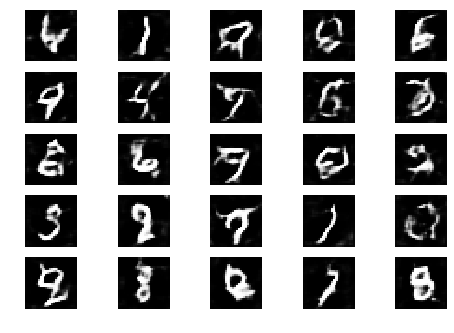

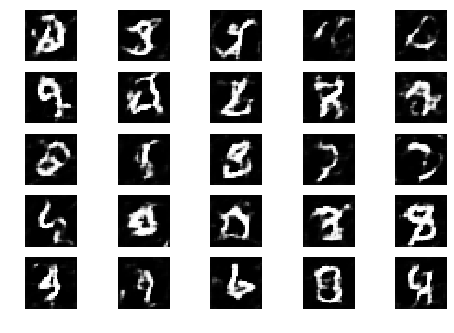

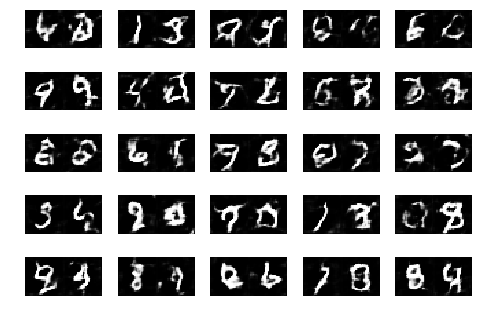

Epoch 1 Batch 201/1875 [D loss: 0.659085, acc.: 65.62%] [G loss: 0.822529]
Epoch 1 Batch 202/1875 [D loss: 0.735508, acc.: 53.12%] [G loss: 0.934354]
Epoch 1 Batch 203/1875 [D loss: 0.640620, acc.: 59.38%] [G loss: 0.929530]
Epoch 1 Batch 204/1875 [D loss: 0.755239, acc.: 50.00%] [G loss: 0.949936]
Epoch 1 Batch 205/1875 [D loss: 0.823318, acc.: 40.62%] [G loss: 0.996811]
Epoch 1 Batch 206/1875 [D loss: 0.620756, acc.: 59.38%] [G loss: 1.038108]
Epoch 1 Batch 207/1875 [D loss: 0.640528, acc.: 71.88%] [G loss: 1.011230]
Epoch 1 Batch 208/1875 [D loss: 0.691689, acc.: 56.25%] [G loss: 0.929542]
Epoch 1 Batch 209/1875 [D loss: 0.744185, acc.: 40.62%] [G loss: 0.916140]
Epoch 1 Batch 210/1875 [D loss: 0.708058, acc.: 50.00%] [G loss: 0.889785]
Epoch 1 Batch 211/1875 [D loss: 0.660437, acc.: 59.38%] [G loss: 0.941762]
Epoch 1 Batch 212/1875 [D loss: 0.718486, acc.: 59.38%] [G loss: 0.888306]
Epoch 1 Batch 213/1875 [D loss: 0.643700, acc.: 59.38%] [G loss: 0.875062]
Epoch 1 Batch 214/1875 [D

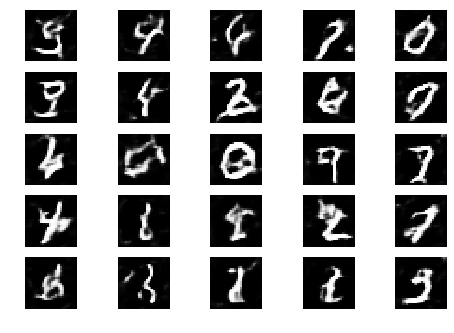

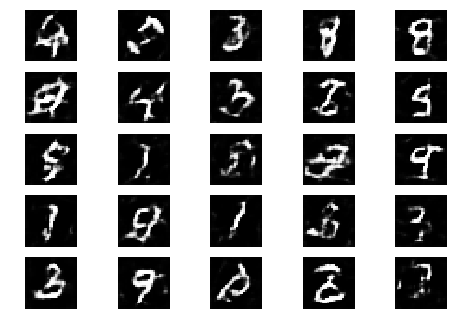

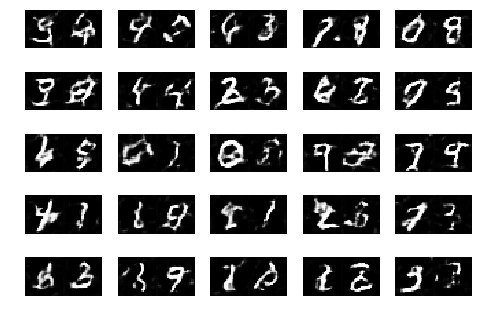

Epoch 1 Batch 301/1875 [D loss: 0.677119, acc.: 56.25%] [G loss: 0.775436]
Epoch 1 Batch 302/1875 [D loss: 0.628799, acc.: 59.38%] [G loss: 1.071129]
Epoch 1 Batch 303/1875 [D loss: 0.700480, acc.: 46.88%] [G loss: 1.030981]
Epoch 1 Batch 304/1875 [D loss: 0.564534, acc.: 78.12%] [G loss: 0.991774]
Epoch 1 Batch 305/1875 [D loss: 0.835223, acc.: 40.62%] [G loss: 0.985960]
Epoch 1 Batch 306/1875 [D loss: 0.837368, acc.: 37.50%] [G loss: 0.876621]
Epoch 1 Batch 307/1875 [D loss: 0.680694, acc.: 59.38%] [G loss: 1.026515]
Epoch 1 Batch 308/1875 [D loss: 0.656338, acc.: 59.38%] [G loss: 0.802987]
Epoch 1 Batch 309/1875 [D loss: 0.744149, acc.: 53.12%] [G loss: 0.871783]
Epoch 1 Batch 310/1875 [D loss: 0.758164, acc.: 50.00%] [G loss: 0.979968]
Epoch 1 Batch 311/1875 [D loss: 0.762192, acc.: 46.88%] [G loss: 1.078592]
Epoch 1 Batch 312/1875 [D loss: 0.671820, acc.: 71.88%] [G loss: 1.009836]
Epoch 1 Batch 313/1875 [D loss: 0.744411, acc.: 43.75%] [G loss: 0.893635]
Epoch 1 Batch 314/1875 [D

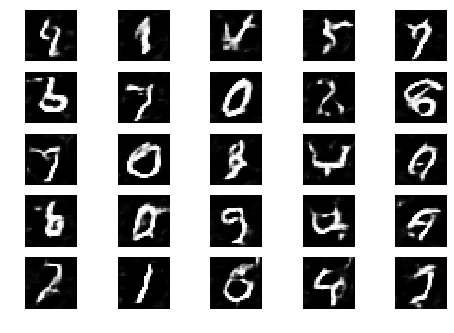

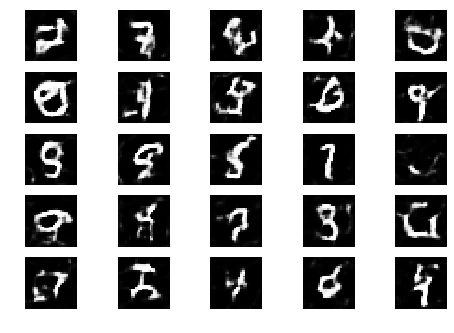

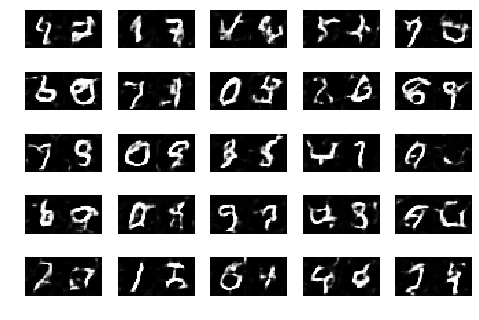

Epoch 1 Batch 401/1875 [D loss: 0.800482, acc.: 53.12%] [G loss: 0.979519]
Epoch 1 Batch 402/1875 [D loss: 0.703932, acc.: 62.50%] [G loss: 0.918208]
Epoch 1 Batch 403/1875 [D loss: 0.672712, acc.: 56.25%] [G loss: 0.994621]
Epoch 1 Batch 404/1875 [D loss: 0.654028, acc.: 59.38%] [G loss: 0.881942]
Epoch 1 Batch 405/1875 [D loss: 0.648093, acc.: 59.38%] [G loss: 0.869618]
Epoch 1 Batch 406/1875 [D loss: 0.774067, acc.: 46.88%] [G loss: 0.919310]
Epoch 1 Batch 407/1875 [D loss: 0.606814, acc.: 75.00%] [G loss: 0.993554]
Epoch 1 Batch 408/1875 [D loss: 0.746166, acc.: 56.25%] [G loss: 1.015159]
Epoch 1 Batch 409/1875 [D loss: 0.682964, acc.: 59.38%] [G loss: 0.776982]
Epoch 1 Batch 410/1875 [D loss: 0.657531, acc.: 56.25%] [G loss: 0.837152]
Epoch 1 Batch 411/1875 [D loss: 0.655934, acc.: 62.50%] [G loss: 0.871526]
Epoch 1 Batch 412/1875 [D loss: 0.752563, acc.: 53.12%] [G loss: 0.901986]
Epoch 1 Batch 413/1875 [D loss: 0.670334, acc.: 59.38%] [G loss: 0.859935]
Epoch 1 Batch 414/1875 [D

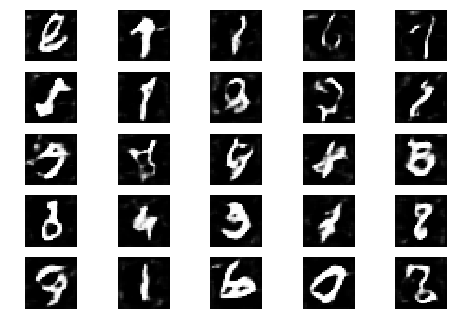

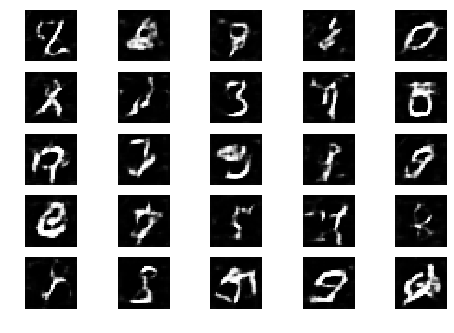

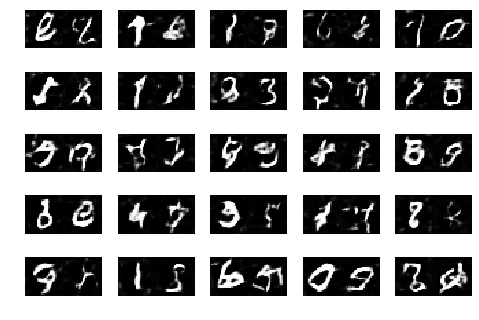

Epoch 1 Batch 501/1875 [D loss: 0.747002, acc.: 50.00%] [G loss: 0.861681]
Epoch 1 Batch 502/1875 [D loss: 0.706396, acc.: 56.25%] [G loss: 0.923668]
Epoch 1 Batch 503/1875 [D loss: 0.679663, acc.: 56.25%] [G loss: 0.849496]
Epoch 1 Batch 504/1875 [D loss: 0.723429, acc.: 50.00%] [G loss: 0.855154]
Epoch 1 Batch 505/1875 [D loss: 0.724509, acc.: 43.75%] [G loss: 0.793883]
Epoch 1 Batch 506/1875 [D loss: 0.793183, acc.: 43.75%] [G loss: 0.872350]
Epoch 1 Batch 507/1875 [D loss: 0.756012, acc.: 43.75%] [G loss: 0.779442]
Epoch 1 Batch 508/1875 [D loss: 0.601603, acc.: 68.75%] [G loss: 0.899790]
Epoch 1 Batch 509/1875 [D loss: 0.614118, acc.: 62.50%] [G loss: 0.962929]
Epoch 1 Batch 510/1875 [D loss: 0.665625, acc.: 65.62%] [G loss: 0.970375]
Epoch 1 Batch 511/1875 [D loss: 0.664876, acc.: 62.50%] [G loss: 0.859672]
Epoch 1 Batch 512/1875 [D loss: 0.719841, acc.: 53.12%] [G loss: 0.900734]
Epoch 1 Batch 513/1875 [D loss: 0.701664, acc.: 53.12%] [G loss: 0.865264]
Epoch 1 Batch 514/1875 [D

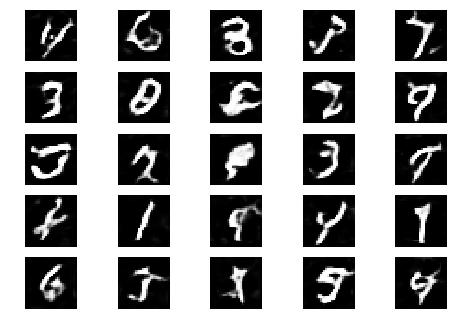

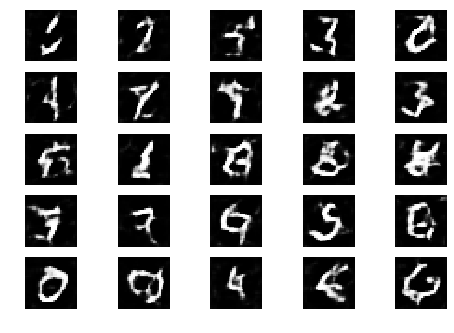

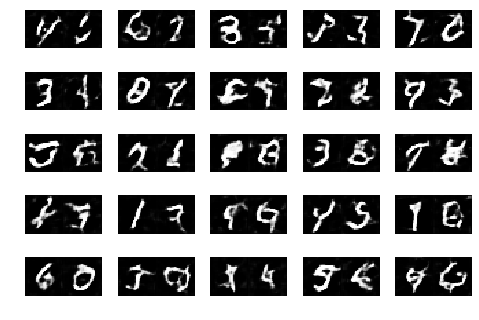

Epoch 1 Batch 601/1875 [D loss: 0.815902, acc.: 46.88%] [G loss: 0.875850]
Epoch 1 Batch 602/1875 [D loss: 0.613580, acc.: 62.50%] [G loss: 0.828364]
Epoch 1 Batch 603/1875 [D loss: 0.812959, acc.: 46.88%] [G loss: 0.859249]
Epoch 1 Batch 604/1875 [D loss: 0.707624, acc.: 56.25%] [G loss: 0.877741]
Epoch 1 Batch 605/1875 [D loss: 0.675504, acc.: 53.12%] [G loss: 0.768647]
Epoch 1 Batch 606/1875 [D loss: 0.652612, acc.: 56.25%] [G loss: 0.880383]
Epoch 1 Batch 607/1875 [D loss: 0.614691, acc.: 59.38%] [G loss: 0.814101]
Epoch 1 Batch 608/1875 [D loss: 0.687829, acc.: 62.50%] [G loss: 0.960624]
Epoch 1 Batch 609/1875 [D loss: 0.635762, acc.: 65.62%] [G loss: 0.853925]
Epoch 1 Batch 610/1875 [D loss: 0.657878, acc.: 56.25%] [G loss: 0.920260]
Epoch 1 Batch 611/1875 [D loss: 0.665354, acc.: 56.25%] [G loss: 0.793401]
Epoch 1 Batch 612/1875 [D loss: 0.633615, acc.: 56.25%] [G loss: 0.749392]
Epoch 1 Batch 613/1875 [D loss: 0.678165, acc.: 53.12%] [G loss: 0.720691]
Epoch 1 Batch 614/1875 [D

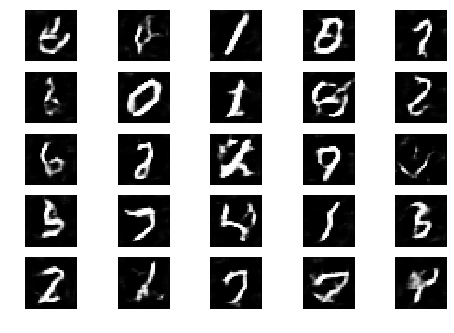

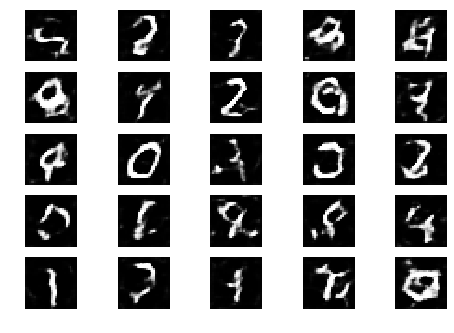

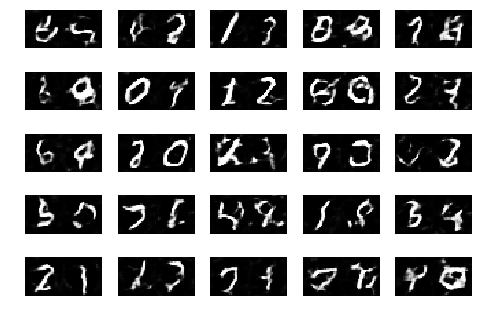

Epoch 1 Batch 701/1875 [D loss: 0.623385, acc.: 68.75%] [G loss: 0.943191]
Epoch 1 Batch 702/1875 [D loss: 0.788105, acc.: 40.62%] [G loss: 0.926927]
Epoch 1 Batch 703/1875 [D loss: 0.676897, acc.: 68.75%] [G loss: 0.885261]
Epoch 1 Batch 704/1875 [D loss: 0.678174, acc.: 53.12%] [G loss: 0.863410]
Epoch 1 Batch 705/1875 [D loss: 0.756376, acc.: 40.62%] [G loss: 0.886518]
Epoch 1 Batch 706/1875 [D loss: 0.631331, acc.: 71.88%] [G loss: 0.859226]
Epoch 1 Batch 707/1875 [D loss: 0.729812, acc.: 46.88%] [G loss: 0.809609]
Epoch 1 Batch 708/1875 [D loss: 0.753187, acc.: 40.62%] [G loss: 0.884526]
Epoch 1 Batch 709/1875 [D loss: 0.748540, acc.: 50.00%] [G loss: 0.806840]
Epoch 1 Batch 710/1875 [D loss: 0.644802, acc.: 56.25%] [G loss: 0.910292]
Epoch 1 Batch 711/1875 [D loss: 0.684507, acc.: 65.62%] [G loss: 0.982310]
Epoch 1 Batch 712/1875 [D loss: 0.862343, acc.: 34.38%] [G loss: 0.936606]
Epoch 1 Batch 713/1875 [D loss: 0.697390, acc.: 53.12%] [G loss: 0.827731]
Epoch 1 Batch 714/1875 [D

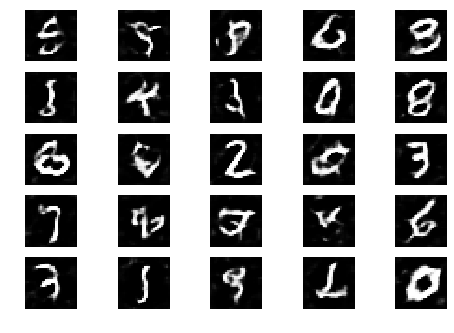

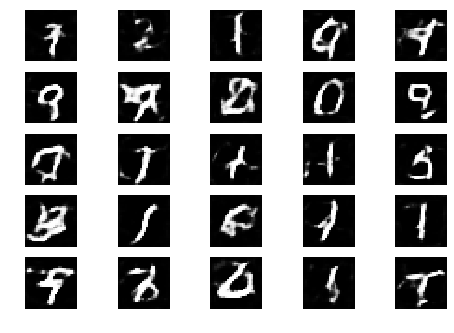

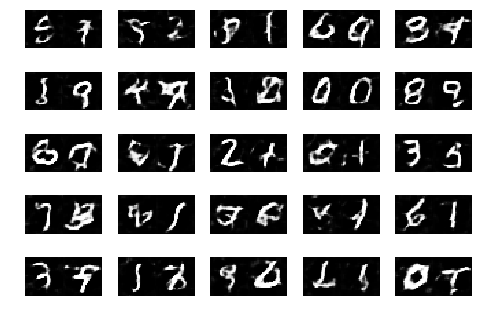

Epoch 1 Batch 801/1875 [D loss: 0.649988, acc.: 62.50%] [G loss: 0.875405]
Epoch 1 Batch 802/1875 [D loss: 0.699806, acc.: 56.25%] [G loss: 0.863104]
Epoch 1 Batch 803/1875 [D loss: 0.730501, acc.: 50.00%] [G loss: 0.900155]
Epoch 1 Batch 804/1875 [D loss: 0.651533, acc.: 56.25%] [G loss: 0.964736]
Epoch 1 Batch 805/1875 [D loss: 0.666106, acc.: 53.12%] [G loss: 0.964750]
Epoch 1 Batch 806/1875 [D loss: 0.841204, acc.: 43.75%] [G loss: 1.018782]
Epoch 1 Batch 807/1875 [D loss: 0.677790, acc.: 56.25%] [G loss: 0.862862]
Epoch 1 Batch 808/1875 [D loss: 0.781948, acc.: 43.75%] [G loss: 0.902255]
Epoch 1 Batch 809/1875 [D loss: 0.755366, acc.: 50.00%] [G loss: 0.831067]
Epoch 1 Batch 810/1875 [D loss: 0.716711, acc.: 53.12%] [G loss: 0.865294]
Epoch 1 Batch 811/1875 [D loss: 0.727715, acc.: 59.38%] [G loss: 0.778397]
Epoch 1 Batch 812/1875 [D loss: 0.708519, acc.: 46.88%] [G loss: 0.896079]
Epoch 1 Batch 813/1875 [D loss: 0.634775, acc.: 68.75%] [G loss: 0.861818]
Epoch 1 Batch 814/1875 [D

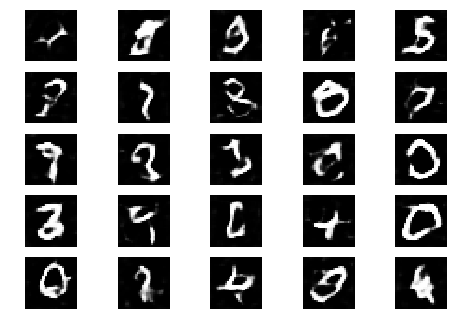

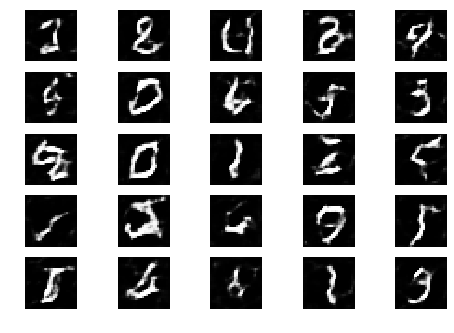

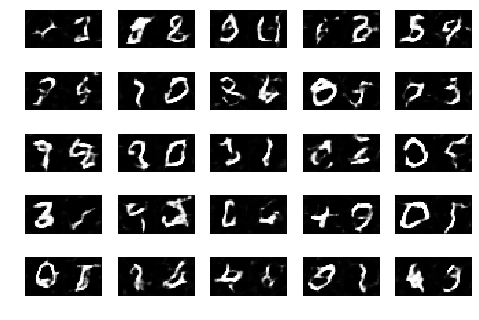

Epoch 1 Batch 901/1875 [D loss: 0.725846, acc.: 56.25%] [G loss: 0.943541]
Epoch 1 Batch 902/1875 [D loss: 0.717941, acc.: 50.00%] [G loss: 0.919322]
Epoch 1 Batch 903/1875 [D loss: 0.699432, acc.: 56.25%] [G loss: 0.858389]
Epoch 1 Batch 904/1875 [D loss: 0.762259, acc.: 43.75%] [G loss: 0.925447]
Epoch 1 Batch 905/1875 [D loss: 0.653942, acc.: 62.50%] [G loss: 0.877914]
Epoch 1 Batch 906/1875 [D loss: 0.663123, acc.: 65.62%] [G loss: 0.946579]
Epoch 1 Batch 907/1875 [D loss: 0.729594, acc.: 56.25%] [G loss: 0.796113]
Epoch 1 Batch 908/1875 [D loss: 0.723725, acc.: 40.62%] [G loss: 0.779824]
Epoch 1 Batch 909/1875 [D loss: 0.669238, acc.: 56.25%] [G loss: 0.827280]
Epoch 1 Batch 910/1875 [D loss: 0.672193, acc.: 62.50%] [G loss: 0.847136]
Epoch 1 Batch 911/1875 [D loss: 0.677048, acc.: 62.50%] [G loss: 0.935455]
Epoch 1 Batch 912/1875 [D loss: 0.692627, acc.: 56.25%] [G loss: 0.847922]
Epoch 1 Batch 913/1875 [D loss: 0.727284, acc.: 46.88%] [G loss: 0.872345]
Epoch 1 Batch 914/1875 [D

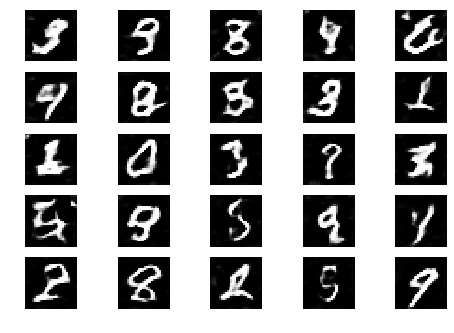

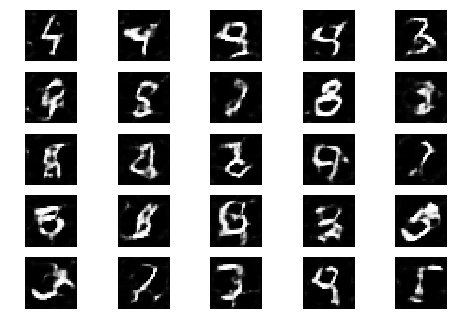

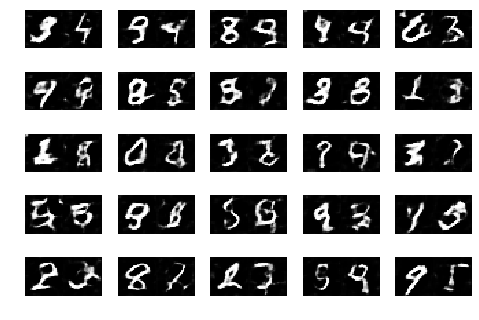

Epoch 1 Batch 1001/1875 [D loss: 0.683567, acc.: 46.88%] [G loss: 0.938760]
Epoch 1 Batch 1002/1875 [D loss: 0.673524, acc.: 65.62%] [G loss: 0.836538]
Epoch 1 Batch 1003/1875 [D loss: 0.757172, acc.: 46.88%] [G loss: 0.874217]
Epoch 1 Batch 1004/1875 [D loss: 0.769506, acc.: 46.88%] [G loss: 0.962357]
Epoch 1 Batch 1005/1875 [D loss: 0.806226, acc.: 46.88%] [G loss: 0.928304]
Epoch 1 Batch 1006/1875 [D loss: 0.749310, acc.: 43.75%] [G loss: 0.967024]
Epoch 1 Batch 1007/1875 [D loss: 0.701927, acc.: 53.12%] [G loss: 0.931697]
Epoch 1 Batch 1008/1875 [D loss: 0.690490, acc.: 59.38%] [G loss: 0.949706]
Epoch 1 Batch 1009/1875 [D loss: 0.672052, acc.: 62.50%] [G loss: 0.851220]
Epoch 1 Batch 1010/1875 [D loss: 0.745660, acc.: 62.50%] [G loss: 0.949574]
Epoch 1 Batch 1011/1875 [D loss: 0.771683, acc.: 46.88%] [G loss: 0.936965]
Epoch 1 Batch 1012/1875 [D loss: 0.596370, acc.: 68.75%] [G loss: 0.958989]
Epoch 1 Batch 1013/1875 [D loss: 0.657895, acc.: 43.75%] [G loss: 0.982876]
Epoch 1 Batc

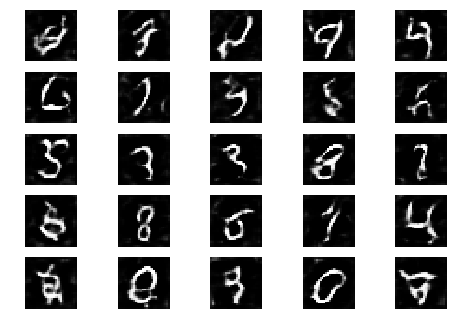

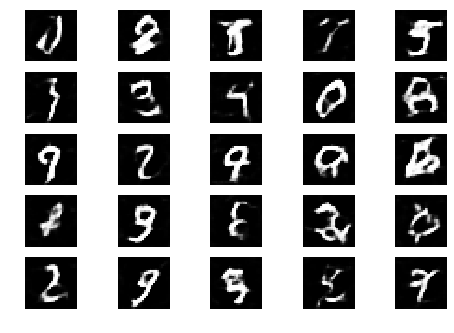

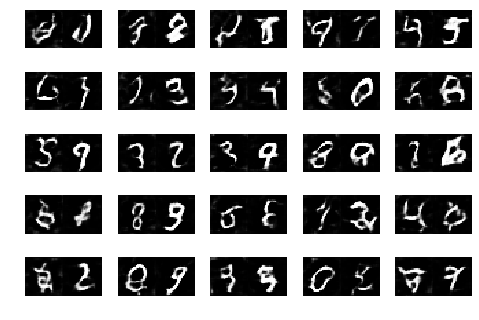

Epoch 1 Batch 1101/1875 [D loss: 0.744587, acc.: 50.00%] [G loss: 0.817304]
Epoch 1 Batch 1102/1875 [D loss: 0.715589, acc.: 43.75%] [G loss: 0.925635]
Epoch 1 Batch 1103/1875 [D loss: 0.692005, acc.: 56.25%] [G loss: 1.034820]
Epoch 1 Batch 1104/1875 [D loss: 0.725668, acc.: 46.88%] [G loss: 1.005800]
Epoch 1 Batch 1105/1875 [D loss: 0.589502, acc.: 68.75%] [G loss: 1.009367]
Epoch 1 Batch 1106/1875 [D loss: 0.638078, acc.: 56.25%] [G loss: 1.080281]
Epoch 1 Batch 1107/1875 [D loss: 0.817574, acc.: 43.75%] [G loss: 0.991325]
Epoch 1 Batch 1108/1875 [D loss: 0.720294, acc.: 56.25%] [G loss: 0.988019]
Epoch 1 Batch 1109/1875 [D loss: 0.615612, acc.: 68.75%] [G loss: 1.043417]
Epoch 1 Batch 1110/1875 [D loss: 0.602541, acc.: 71.88%] [G loss: 0.921243]
Epoch 1 Batch 1111/1875 [D loss: 0.691433, acc.: 53.12%] [G loss: 1.000345]
Epoch 1 Batch 1112/1875 [D loss: 0.726806, acc.: 50.00%] [G loss: 0.833225]
Epoch 1 Batch 1113/1875 [D loss: 0.616638, acc.: 62.50%] [G loss: 0.911338]
Epoch 1 Batc

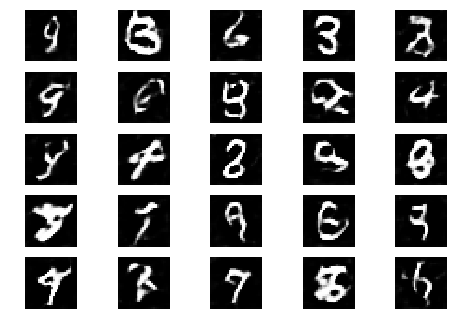

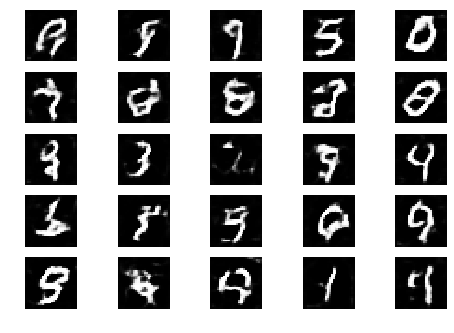

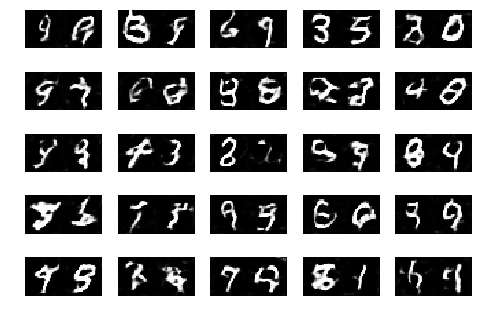

Epoch 1 Batch 1201/1875 [D loss: 0.660845, acc.: 59.38%] [G loss: 1.011615]
Epoch 1 Batch 1202/1875 [D loss: 0.758165, acc.: 56.25%] [G loss: 0.954679]
Epoch 1 Batch 1203/1875 [D loss: 0.688798, acc.: 46.88%] [G loss: 1.000158]
Epoch 1 Batch 1204/1875 [D loss: 0.702024, acc.: 59.38%] [G loss: 0.766778]
Epoch 1 Batch 1205/1875 [D loss: 0.623438, acc.: 65.62%] [G loss: 0.935012]
Epoch 1 Batch 1206/1875 [D loss: 0.707254, acc.: 56.25%] [G loss: 0.880550]
Epoch 1 Batch 1207/1875 [D loss: 0.688260, acc.: 46.88%] [G loss: 0.867911]
Epoch 1 Batch 1208/1875 [D loss: 0.750061, acc.: 53.12%] [G loss: 0.910601]
Epoch 1 Batch 1209/1875 [D loss: 0.714070, acc.: 53.12%] [G loss: 0.933954]
Epoch 1 Batch 1210/1875 [D loss: 0.710759, acc.: 59.38%] [G loss: 0.929480]
Epoch 1 Batch 1211/1875 [D loss: 0.663044, acc.: 62.50%] [G loss: 1.063574]
Epoch 1 Batch 1212/1875 [D loss: 0.739359, acc.: 50.00%] [G loss: 0.915113]
Epoch 1 Batch 1213/1875 [D loss: 0.628194, acc.: 62.50%] [G loss: 0.915547]
Epoch 1 Batc

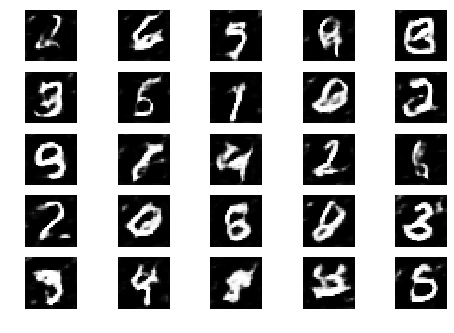

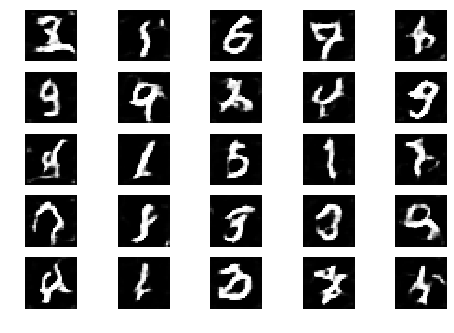

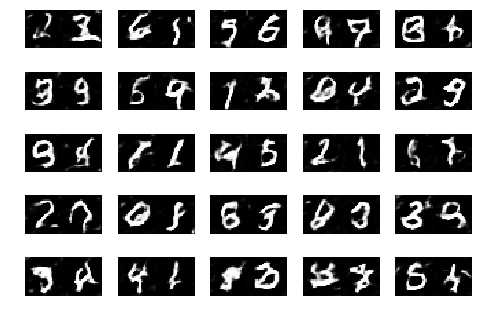

Epoch 1 Batch 1301/1875 [D loss: 0.621083, acc.: 59.38%] [G loss: 0.706637]
Epoch 1 Batch 1302/1875 [D loss: 0.726562, acc.: 56.25%] [G loss: 0.783555]
Epoch 1 Batch 1303/1875 [D loss: 0.560687, acc.: 75.00%] [G loss: 0.977942]
Epoch 1 Batch 1304/1875 [D loss: 0.692945, acc.: 53.12%] [G loss: 0.921554]
Epoch 1 Batch 1305/1875 [D loss: 0.756392, acc.: 43.75%] [G loss: 0.859818]
Epoch 1 Batch 1306/1875 [D loss: 0.693675, acc.: 65.62%] [G loss: 0.815056]
Epoch 1 Batch 1307/1875 [D loss: 0.622905, acc.: 71.88%] [G loss: 0.886149]
Epoch 1 Batch 1308/1875 [D loss: 0.651390, acc.: 59.38%] [G loss: 0.851903]
Epoch 1 Batch 1309/1875 [D loss: 0.646999, acc.: 65.62%] [G loss: 0.932414]
Epoch 1 Batch 1310/1875 [D loss: 0.700900, acc.: 59.38%] [G loss: 1.042788]
Epoch 1 Batch 1311/1875 [D loss: 0.718275, acc.: 59.38%] [G loss: 0.860305]
Epoch 1 Batch 1312/1875 [D loss: 0.701514, acc.: 56.25%] [G loss: 0.894872]
Epoch 1 Batch 1313/1875 [D loss: 0.671290, acc.: 59.38%] [G loss: 0.895460]
Epoch 1 Batc

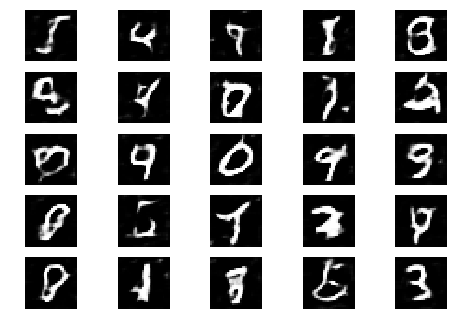

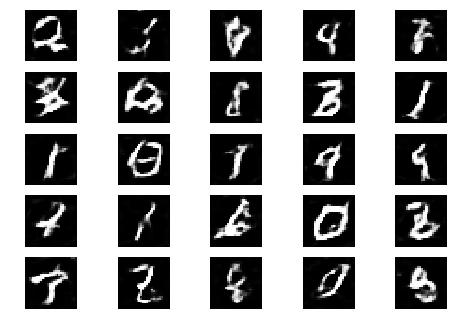

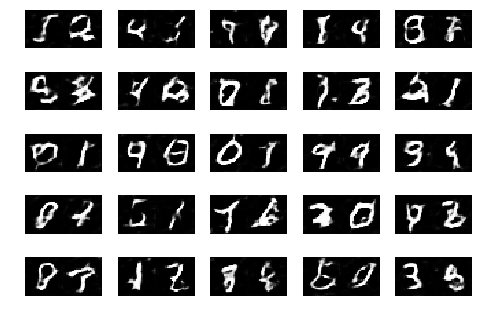

Epoch 1 Batch 1401/1875 [D loss: 0.681091, acc.: 56.25%] [G loss: 0.790187]
Epoch 1 Batch 1402/1875 [D loss: 0.747602, acc.: 40.62%] [G loss: 0.957895]
Epoch 1 Batch 1403/1875 [D loss: 0.681699, acc.: 59.38%] [G loss: 0.896158]
Epoch 1 Batch 1404/1875 [D loss: 0.681059, acc.: 59.38%] [G loss: 0.842405]
Epoch 1 Batch 1405/1875 [D loss: 0.552186, acc.: 71.88%] [G loss: 0.745386]
Epoch 1 Batch 1406/1875 [D loss: 0.671088, acc.: 56.25%] [G loss: 0.889957]
Epoch 1 Batch 1407/1875 [D loss: 0.706554, acc.: 43.75%] [G loss: 0.926490]
Epoch 1 Batch 1408/1875 [D loss: 0.703978, acc.: 50.00%] [G loss: 0.927472]
Epoch 1 Batch 1409/1875 [D loss: 0.745056, acc.: 56.25%] [G loss: 1.049524]
Epoch 1 Batch 1410/1875 [D loss: 0.662469, acc.: 46.88%] [G loss: 0.989751]
Epoch 1 Batch 1411/1875 [D loss: 0.546108, acc.: 71.88%] [G loss: 0.953352]
Epoch 1 Batch 1412/1875 [D loss: 0.770195, acc.: 43.75%] [G loss: 0.986974]
Epoch 1 Batch 1413/1875 [D loss: 0.578210, acc.: 59.38%] [G loss: 1.024508]
Epoch 1 Batc

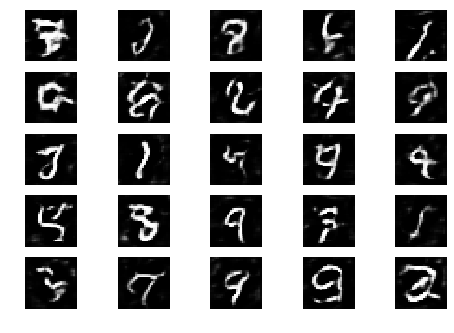

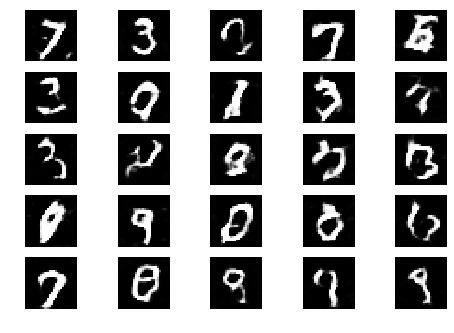

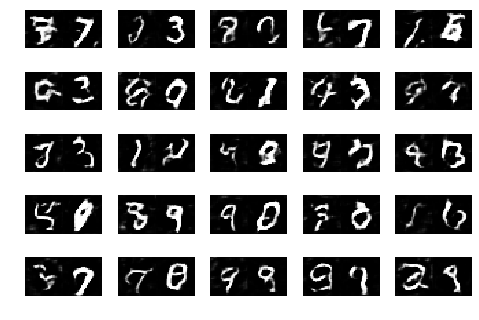

Epoch 1 Batch 1501/1875 [D loss: 0.676010, acc.: 56.25%] [G loss: 1.108415]
Epoch 1 Batch 1502/1875 [D loss: 0.700950, acc.: 62.50%] [G loss: 1.029308]
Epoch 1 Batch 1503/1875 [D loss: 0.656658, acc.: 65.62%] [G loss: 1.018404]
Epoch 1 Batch 1504/1875 [D loss: 0.712741, acc.: 53.12%] [G loss: 1.192528]
Epoch 1 Batch 1505/1875 [D loss: 0.647581, acc.: 62.50%] [G loss: 1.083722]
Epoch 1 Batch 1506/1875 [D loss: 0.634428, acc.: 62.50%] [G loss: 1.075340]
Epoch 1 Batch 1507/1875 [D loss: 0.862979, acc.: 37.50%] [G loss: 0.975330]
Epoch 1 Batch 1508/1875 [D loss: 0.640240, acc.: 56.25%] [G loss: 1.022857]
Epoch 1 Batch 1509/1875 [D loss: 0.651431, acc.: 56.25%] [G loss: 0.887503]
Epoch 1 Batch 1510/1875 [D loss: 0.724035, acc.: 56.25%] [G loss: 0.877319]
Epoch 1 Batch 1511/1875 [D loss: 0.663870, acc.: 65.62%] [G loss: 0.848335]
Epoch 1 Batch 1512/1875 [D loss: 0.846017, acc.: 37.50%] [G loss: 0.842350]
Epoch 1 Batch 1513/1875 [D loss: 0.571116, acc.: 71.88%] [G loss: 0.917027]
Epoch 1 Batc

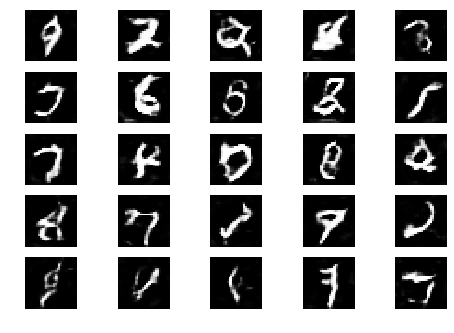

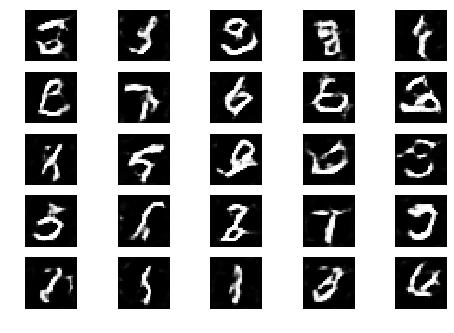

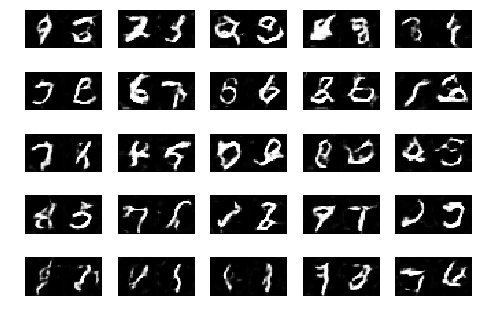

Epoch 1 Batch 1601/1875 [D loss: 0.636323, acc.: 62.50%] [G loss: 0.823152]
Epoch 1 Batch 1602/1875 [D loss: 0.740729, acc.: 50.00%] [G loss: 0.958372]
Epoch 1 Batch 1603/1875 [D loss: 0.685524, acc.: 59.38%] [G loss: 0.972721]
Epoch 1 Batch 1604/1875 [D loss: 0.754202, acc.: 56.25%] [G loss: 1.114991]
Epoch 1 Batch 1605/1875 [D loss: 0.692038, acc.: 50.00%] [G loss: 1.047988]
Epoch 1 Batch 1606/1875 [D loss: 0.783094, acc.: 43.75%] [G loss: 0.994707]
Epoch 1 Batch 1607/1875 [D loss: 0.677605, acc.: 50.00%] [G loss: 0.876818]
Epoch 1 Batch 1608/1875 [D loss: 0.645599, acc.: 68.75%] [G loss: 0.929421]
Epoch 1 Batch 1609/1875 [D loss: 0.748703, acc.: 43.75%] [G loss: 0.978729]
Epoch 1 Batch 1610/1875 [D loss: 0.686614, acc.: 59.38%] [G loss: 0.951990]
Epoch 1 Batch 1611/1875 [D loss: 0.671965, acc.: 59.38%] [G loss: 0.939825]
Epoch 1 Batch 1612/1875 [D loss: 0.584242, acc.: 68.75%] [G loss: 0.946413]
Epoch 1 Batch 1613/1875 [D loss: 0.639451, acc.: 65.62%] [G loss: 0.991329]
Epoch 1 Batc

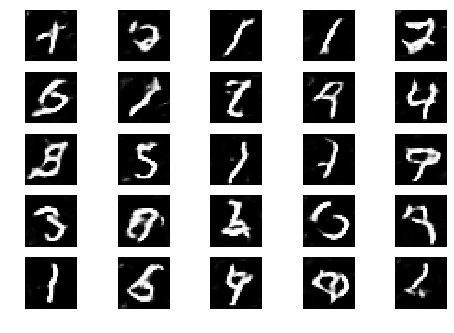

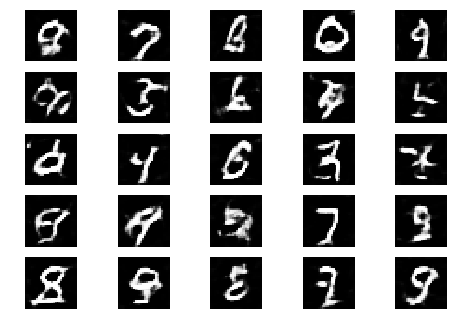

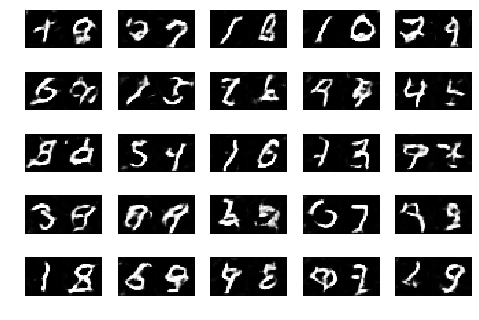

Epoch 1 Batch 1701/1875 [D loss: 0.655318, acc.: 68.75%] [G loss: 0.952450]
Epoch 1 Batch 1702/1875 [D loss: 0.635318, acc.: 59.38%] [G loss: 0.988647]
Epoch 1 Batch 1703/1875 [D loss: 0.708444, acc.: 53.12%] [G loss: 0.919867]
Epoch 1 Batch 1704/1875 [D loss: 0.625176, acc.: 65.62%] [G loss: 1.041918]
Epoch 1 Batch 1705/1875 [D loss: 0.680043, acc.: 62.50%] [G loss: 0.897673]
Epoch 1 Batch 1706/1875 [D loss: 0.666105, acc.: 56.25%] [G loss: 1.001606]
Epoch 1 Batch 1707/1875 [D loss: 0.734587, acc.: 53.12%] [G loss: 0.913138]
Epoch 1 Batch 1708/1875 [D loss: 0.718463, acc.: 56.25%] [G loss: 0.933804]
Epoch 1 Batch 1709/1875 [D loss: 0.525527, acc.: 81.25%] [G loss: 0.905143]
Epoch 1 Batch 1710/1875 [D loss: 0.647833, acc.: 62.50%] [G loss: 0.909538]
Epoch 1 Batch 1711/1875 [D loss: 0.639992, acc.: 59.38%] [G loss: 0.962032]
Epoch 1 Batch 1712/1875 [D loss: 0.637033, acc.: 59.38%] [G loss: 1.015741]
Epoch 1 Batch 1713/1875 [D loss: 0.666786, acc.: 56.25%] [G loss: 0.950051]
Epoch 1 Batc

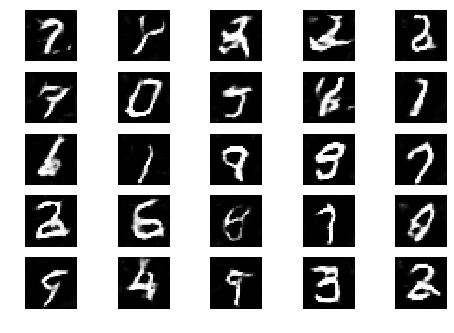

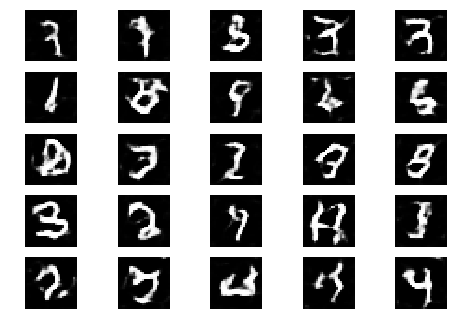

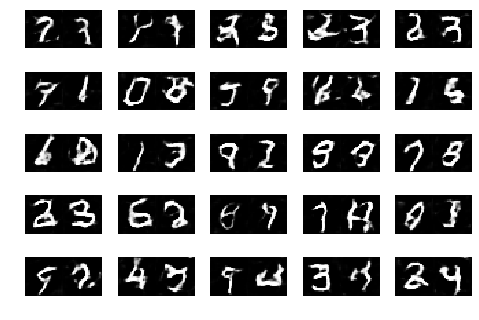

Epoch 1 Batch 1801/1875 [D loss: 0.684706, acc.: 59.38%] [G loss: 0.934617]
Epoch 1 Batch 1802/1875 [D loss: 0.675117, acc.: 59.38%] [G loss: 1.006799]
Epoch 1 Batch 1803/1875 [D loss: 0.865379, acc.: 43.75%] [G loss: 1.111843]
Epoch 1 Batch 1804/1875 [D loss: 0.655930, acc.: 62.50%] [G loss: 0.942591]
Epoch 1 Batch 1805/1875 [D loss: 0.722718, acc.: 50.00%] [G loss: 0.918250]
Epoch 1 Batch 1806/1875 [D loss: 0.709927, acc.: 56.25%] [G loss: 1.050274]
Epoch 1 Batch 1807/1875 [D loss: 0.667281, acc.: 62.50%] [G loss: 0.837464]
Epoch 1 Batch 1808/1875 [D loss: 0.707584, acc.: 40.62%] [G loss: 0.946548]
Epoch 1 Batch 1809/1875 [D loss: 0.576116, acc.: 75.00%] [G loss: 0.917368]
Epoch 1 Batch 1810/1875 [D loss: 0.649050, acc.: 59.38%] [G loss: 0.859746]
Epoch 1 Batch 1811/1875 [D loss: 0.611884, acc.: 59.38%] [G loss: 1.035077]
Epoch 1 Batch 1812/1875 [D loss: 0.683498, acc.: 68.75%] [G loss: 0.900372]
Epoch 1 Batch 1813/1875 [D loss: 0.636428, acc.: 59.38%] [G loss: 1.013388]
Epoch 1 Batc

In [30]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=32, save_interval=1, modeltotrain = 3)

In [31]:

generator1, generator2, discriminator, combined , mergedmodel = build_modelsNandriNEW( averagemode = 2 ,  loadpretrainedweights=True)




    
    

    


<class 'tensorflow.python.framework.ops.Tensor'>
(?, 28, 28, 1)
<class 'tensorflow.python.framework.ops.Tensor'>
(?, 28, 28, 1)
merge layers
(?, 28, 28, 1)
(?, 28, 28, 1)
(?, 28, 56, 1)


Number of examples:  60000
Number of Batches:  1875
Number of epochs:  1
noise half batch
[[ 2.00805406  1.29931536  0.94546042 ... -1.70834816  0.49502168
   0.26900133]
 [ 0.93877138 -0.28053557 -0.65127099 ... -1.05324652 -0.99780988
   0.21992944]
 [-0.0252586  -0.76508581  1.77000942 ...  1.24440311 -0.64076014
  -0.4193976 ]
 ...
 [ 1.2127219   0.30869541 -1.07815622 ...  0.50376202 -0.46834688
  -0.07883416]
 [ 1.50322129  0.15802725 -1.32715277 ...  1.62325287  0.34165408
   0.45740135]
 [-0.84491463 -0.0381931  -0.05480477 ... -1.56955479  0.97274218
  -1.58910398]]
G1 output numpy array shape
(16, 28, 28, 1)
G1+G2 appended numpy array shape
(16, 28, 56, 1)
real images
(16, 28, 56, 1)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 0 Batch 0/1875 [D loss: 0.850606, acc.: 37.50%] [G loss: 0.700059]


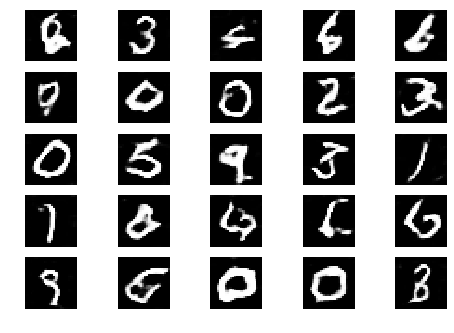

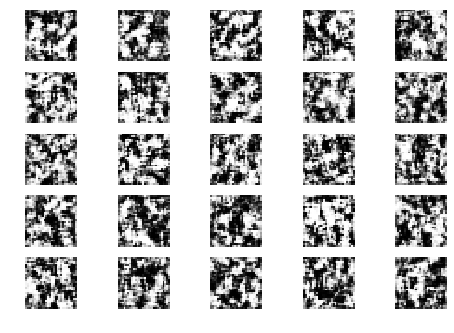

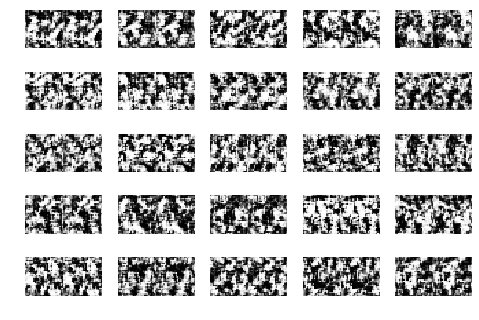

Epoch 0 Batch 1/1875 [D loss: 0.581210, acc.: 68.75%] [G loss: 0.723142]
Epoch 0 Batch 2/1875 [D loss: 0.671920, acc.: 65.62%] [G loss: 0.985471]
Epoch 0 Batch 3/1875 [D loss: 0.579256, acc.: 65.62%] [G loss: 1.022663]
Epoch 0 Batch 4/1875 [D loss: 0.428232, acc.: 87.50%] [G loss: 1.232705]
Epoch 0 Batch 5/1875 [D loss: 0.311924, acc.: 90.62%] [G loss: 1.330544]
Epoch 0 Batch 6/1875 [D loss: 0.312422, acc.: 93.75%] [G loss: 1.402447]
Epoch 0 Batch 7/1875 [D loss: 0.339636, acc.: 84.38%] [G loss: 1.780424]
Epoch 0 Batch 8/1875 [D loss: 0.336865, acc.: 87.50%] [G loss: 1.803189]
Epoch 0 Batch 9/1875 [D loss: 0.238746, acc.: 93.75%] [G loss: 1.784000]
Epoch 0 Batch 10/1875 [D loss: 0.213436, acc.: 93.75%] [G loss: 1.841809]
Epoch 0 Batch 11/1875 [D loss: 0.263750, acc.: 93.75%] [G loss: 1.945876]
Epoch 0 Batch 12/1875 [D loss: 0.304330, acc.: 90.62%] [G loss: 2.400604]
Epoch 0 Batch 13/1875 [D loss: 0.230324, acc.: 90.62%] [G loss: 2.291488]
Epoch 0 Batch 14/1875 [D loss: 0.193786, acc.: 

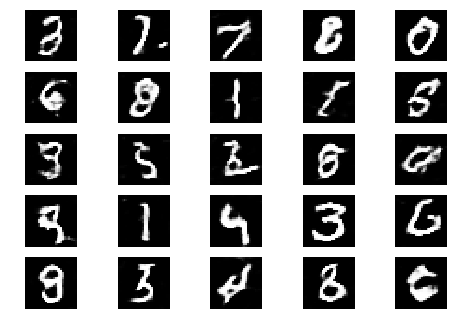

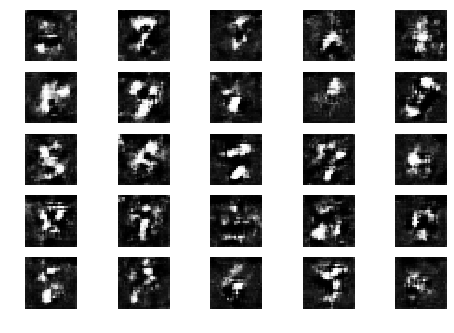

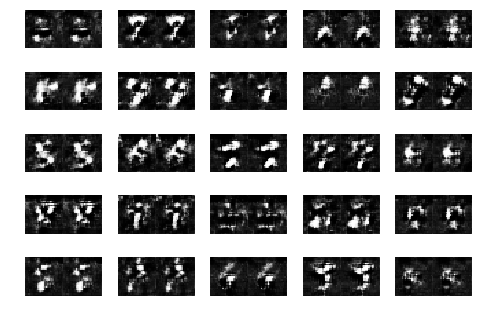

Epoch 0 Batch 101/1875 [D loss: 0.792824, acc.: 56.25%] [G loss: 2.237982]
Epoch 0 Batch 102/1875 [D loss: 0.849375, acc.: 53.12%] [G loss: 2.037295]
Epoch 0 Batch 103/1875 [D loss: 0.746850, acc.: 56.25%] [G loss: 1.472147]
Epoch 0 Batch 104/1875 [D loss: 1.055029, acc.: 56.25%] [G loss: 1.491289]
Epoch 0 Batch 105/1875 [D loss: 1.170735, acc.: 37.50%] [G loss: 2.648521]
Epoch 0 Batch 106/1875 [D loss: 1.286616, acc.: 28.12%] [G loss: 2.042130]
Epoch 0 Batch 107/1875 [D loss: 1.225088, acc.: 37.50%] [G loss: 1.930567]
Epoch 0 Batch 108/1875 [D loss: 0.852015, acc.: 53.12%] [G loss: 1.509725]
Epoch 0 Batch 109/1875 [D loss: 1.203442, acc.: 37.50%] [G loss: 1.571002]
Epoch 0 Batch 110/1875 [D loss: 0.766580, acc.: 65.62%] [G loss: 1.731887]
Epoch 0 Batch 111/1875 [D loss: 1.162105, acc.: 37.50%] [G loss: 2.486486]
Epoch 0 Batch 112/1875 [D loss: 0.923593, acc.: 56.25%] [G loss: 1.479927]
Epoch 0 Batch 113/1875 [D loss: 0.717173, acc.: 68.75%] [G loss: 1.863484]
Epoch 0 Batch 114/1875 [D

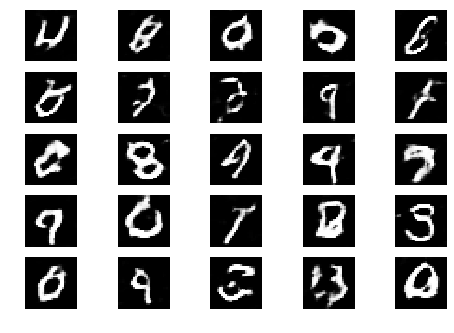

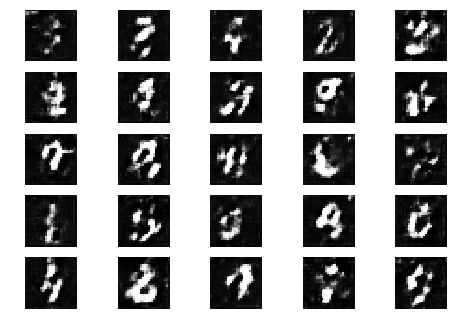

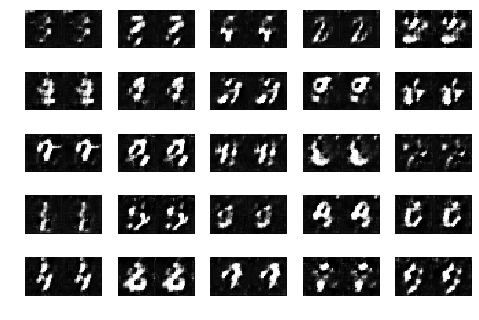

Epoch 0 Batch 201/1875 [D loss: 0.804612, acc.: 53.12%] [G loss: 1.203887]
Epoch 0 Batch 202/1875 [D loss: 0.702658, acc.: 59.38%] [G loss: 0.784111]
Epoch 0 Batch 203/1875 [D loss: 0.858799, acc.: 43.75%] [G loss: 0.755535]
Epoch 0 Batch 204/1875 [D loss: 0.846429, acc.: 50.00%] [G loss: 1.643876]
Epoch 0 Batch 205/1875 [D loss: 0.666776, acc.: 59.38%] [G loss: 1.567342]
Epoch 0 Batch 206/1875 [D loss: 1.040146, acc.: 37.50%] [G loss: 1.131238]
Epoch 0 Batch 207/1875 [D loss: 0.925062, acc.: 56.25%] [G loss: 1.101709]
Epoch 0 Batch 208/1875 [D loss: 0.604766, acc.: 71.88%] [G loss: 1.396182]
Epoch 0 Batch 209/1875 [D loss: 0.818538, acc.: 56.25%] [G loss: 1.223262]
Epoch 0 Batch 210/1875 [D loss: 0.736663, acc.: 59.38%] [G loss: 1.135295]
Epoch 0 Batch 211/1875 [D loss: 0.892138, acc.: 43.75%] [G loss: 0.901068]
Epoch 0 Batch 212/1875 [D loss: 0.564877, acc.: 68.75%] [G loss: 1.609733]
Epoch 0 Batch 213/1875 [D loss: 0.807000, acc.: 50.00%] [G loss: 1.320614]
Epoch 0 Batch 214/1875 [D

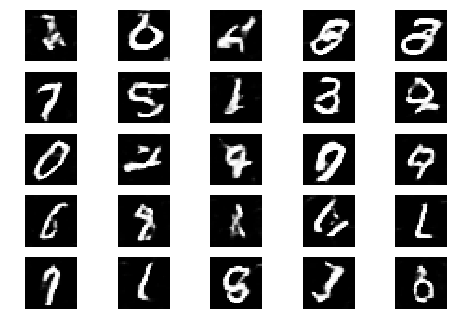

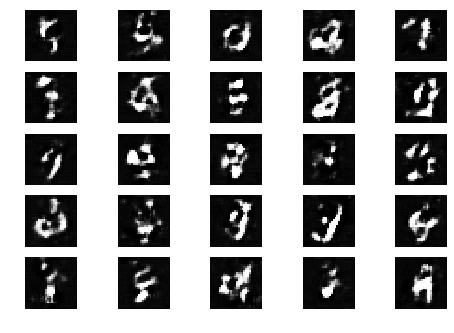

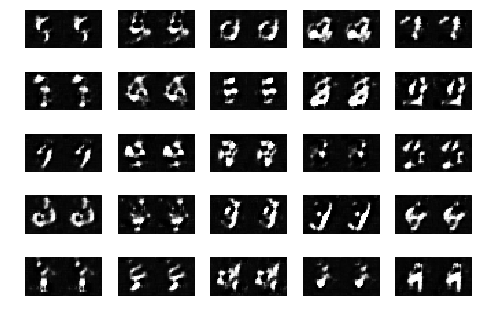

Epoch 0 Batch 301/1875 [D loss: 1.063576, acc.: 43.75%] [G loss: 1.523159]
Epoch 0 Batch 302/1875 [D loss: 0.772371, acc.: 56.25%] [G loss: 1.536180]
Epoch 0 Batch 303/1875 [D loss: 1.089395, acc.: 43.75%] [G loss: 1.244752]
Epoch 0 Batch 304/1875 [D loss: 0.787159, acc.: 56.25%] [G loss: 1.404042]
Epoch 0 Batch 305/1875 [D loss: 0.936539, acc.: 50.00%] [G loss: 1.563964]
Epoch 0 Batch 306/1875 [D loss: 0.775864, acc.: 59.38%] [G loss: 1.292400]
Epoch 0 Batch 307/1875 [D loss: 0.656412, acc.: 56.25%] [G loss: 1.121634]
Epoch 0 Batch 308/1875 [D loss: 0.712161, acc.: 62.50%] [G loss: 1.477382]
Epoch 0 Batch 309/1875 [D loss: 1.048714, acc.: 21.88%] [G loss: 1.228179]
Epoch 0 Batch 310/1875 [D loss: 0.898180, acc.: 46.88%] [G loss: 1.234102]
Epoch 0 Batch 311/1875 [D loss: 0.597766, acc.: 75.00%] [G loss: 1.265029]
Epoch 0 Batch 312/1875 [D loss: 0.910382, acc.: 43.75%] [G loss: 1.258174]
Epoch 0 Batch 313/1875 [D loss: 0.948164, acc.: 34.38%] [G loss: 1.041365]
Epoch 0 Batch 314/1875 [D

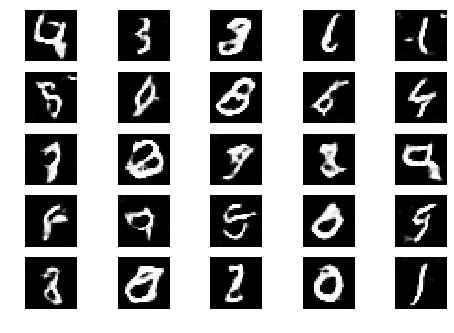

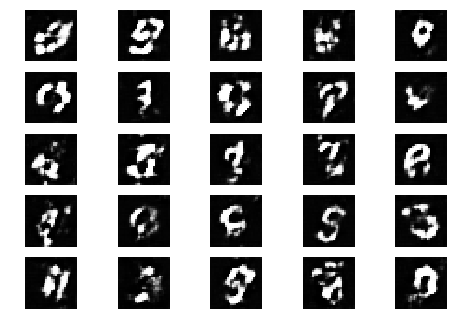

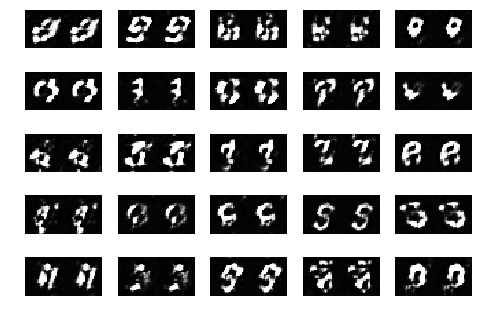

Epoch 0 Batch 401/1875 [D loss: 0.804230, acc.: 46.88%] [G loss: 1.251123]
Epoch 0 Batch 402/1875 [D loss: 0.639217, acc.: 68.75%] [G loss: 1.260301]
Epoch 0 Batch 403/1875 [D loss: 0.772953, acc.: 50.00%] [G loss: 1.143958]
Epoch 0 Batch 404/1875 [D loss: 0.835357, acc.: 53.12%] [G loss: 1.292574]
Epoch 0 Batch 405/1875 [D loss: 0.562097, acc.: 71.88%] [G loss: 1.104714]
Epoch 0 Batch 406/1875 [D loss: 0.912051, acc.: 43.75%] [G loss: 1.284964]
Epoch 0 Batch 407/1875 [D loss: 0.767354, acc.: 59.38%] [G loss: 1.033131]
Epoch 0 Batch 408/1875 [D loss: 0.734589, acc.: 53.12%] [G loss: 1.239507]
Epoch 0 Batch 409/1875 [D loss: 0.757574, acc.: 50.00%] [G loss: 1.317497]
Epoch 0 Batch 410/1875 [D loss: 0.774391, acc.: 56.25%] [G loss: 1.108972]
Epoch 0 Batch 411/1875 [D loss: 0.531308, acc.: 71.88%] [G loss: 1.304793]
Epoch 0 Batch 412/1875 [D loss: 1.015024, acc.: 28.12%] [G loss: 1.471612]
Epoch 0 Batch 413/1875 [D loss: 0.712494, acc.: 56.25%] [G loss: 1.087833]
Epoch 0 Batch 414/1875 [D

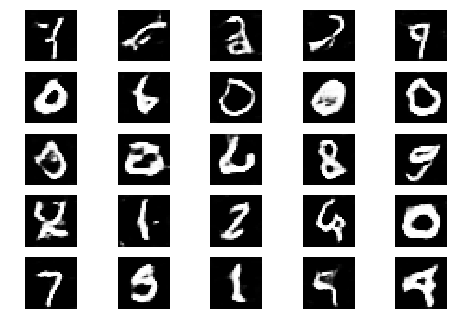

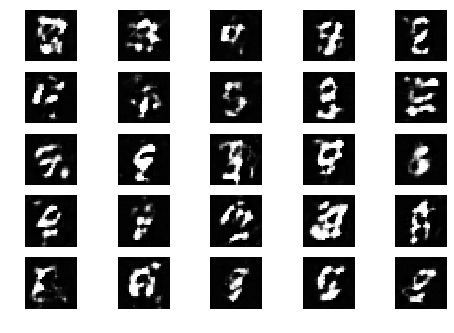

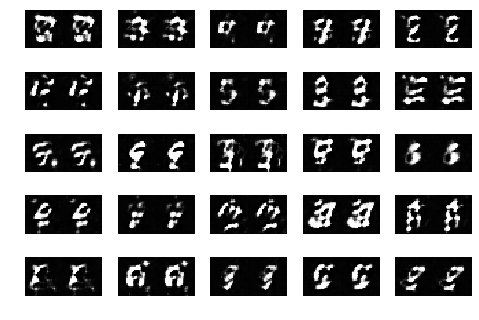

Epoch 0 Batch 501/1875 [D loss: 0.492832, acc.: 75.00%] [G loss: 1.341316]
Epoch 0 Batch 502/1875 [D loss: 0.624257, acc.: 62.50%] [G loss: 1.317766]
Epoch 0 Batch 503/1875 [D loss: 0.700209, acc.: 50.00%] [G loss: 1.184093]
Epoch 0 Batch 504/1875 [D loss: 0.967374, acc.: 40.62%] [G loss: 1.058597]
Epoch 0 Batch 505/1875 [D loss: 0.884017, acc.: 46.88%] [G loss: 1.207833]
Epoch 0 Batch 506/1875 [D loss: 0.868612, acc.: 50.00%] [G loss: 1.172341]
Epoch 0 Batch 507/1875 [D loss: 0.699535, acc.: 53.12%] [G loss: 1.112059]
Epoch 0 Batch 508/1875 [D loss: 0.695298, acc.: 56.25%] [G loss: 1.034579]
Epoch 0 Batch 509/1875 [D loss: 0.878205, acc.: 53.12%] [G loss: 1.043401]
Epoch 0 Batch 510/1875 [D loss: 0.786709, acc.: 50.00%] [G loss: 0.914204]
Epoch 0 Batch 511/1875 [D loss: 0.890511, acc.: 40.62%] [G loss: 0.958310]
Epoch 0 Batch 512/1875 [D loss: 0.746757, acc.: 56.25%] [G loss: 1.289587]
Epoch 0 Batch 513/1875 [D loss: 0.766863, acc.: 50.00%] [G loss: 1.233362]
Epoch 0 Batch 514/1875 [D

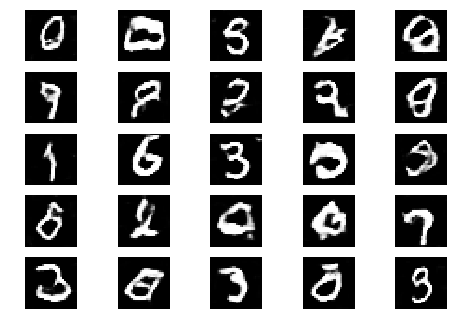

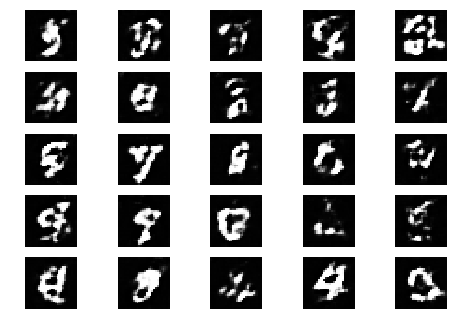

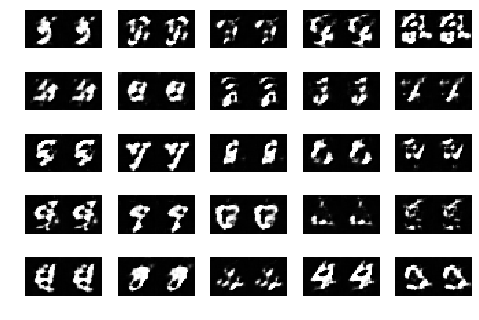

Epoch 0 Batch 601/1875 [D loss: 0.650997, acc.: 68.75%] [G loss: 1.327464]
Epoch 0 Batch 602/1875 [D loss: 0.808294, acc.: 50.00%] [G loss: 1.133865]
Epoch 0 Batch 603/1875 [D loss: 0.605339, acc.: 65.62%] [G loss: 1.236430]
Epoch 0 Batch 604/1875 [D loss: 0.592550, acc.: 78.12%] [G loss: 1.186886]
Epoch 0 Batch 605/1875 [D loss: 0.804638, acc.: 50.00%] [G loss: 1.168178]
Epoch 0 Batch 606/1875 [D loss: 0.599655, acc.: 62.50%] [G loss: 1.437301]
Epoch 0 Batch 607/1875 [D loss: 0.630888, acc.: 71.88%] [G loss: 1.288651]
Epoch 0 Batch 608/1875 [D loss: 0.515205, acc.: 78.12%] [G loss: 1.298021]
Epoch 0 Batch 609/1875 [D loss: 0.715288, acc.: 59.38%] [G loss: 1.173293]
Epoch 0 Batch 610/1875 [D loss: 0.760975, acc.: 53.12%] [G loss: 1.459629]
Epoch 0 Batch 611/1875 [D loss: 0.663762, acc.: 53.12%] [G loss: 1.229733]
Epoch 0 Batch 612/1875 [D loss: 0.734481, acc.: 59.38%] [G loss: 1.202483]
Epoch 0 Batch 613/1875 [D loss: 0.547242, acc.: 68.75%] [G loss: 1.350763]
Epoch 0 Batch 614/1875 [D

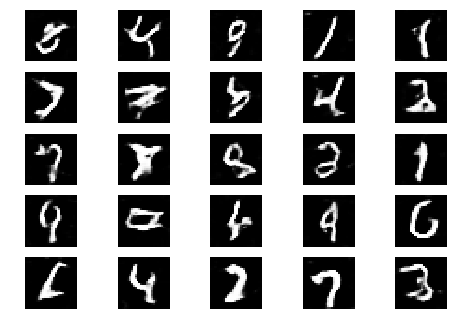

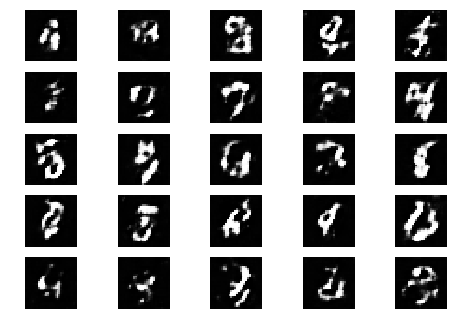

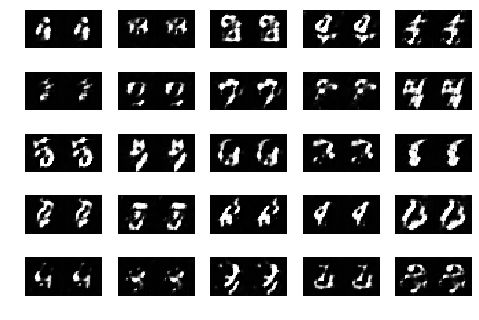

Epoch 0 Batch 701/1875 [D loss: 0.572049, acc.: 78.12%] [G loss: 1.329224]
Epoch 0 Batch 702/1875 [D loss: 0.655620, acc.: 56.25%] [G loss: 1.203256]
Epoch 0 Batch 703/1875 [D loss: 0.544595, acc.: 75.00%] [G loss: 1.083729]
Epoch 0 Batch 704/1875 [D loss: 0.778786, acc.: 53.12%] [G loss: 1.211785]
Epoch 0 Batch 705/1875 [D loss: 0.471454, acc.: 75.00%] [G loss: 1.357852]
Epoch 0 Batch 706/1875 [D loss: 0.755276, acc.: 50.00%] [G loss: 1.493546]
Epoch 0 Batch 707/1875 [D loss: 0.635849, acc.: 62.50%] [G loss: 1.177731]
Epoch 0 Batch 708/1875 [D loss: 0.751876, acc.: 59.38%] [G loss: 1.229295]
Epoch 0 Batch 709/1875 [D loss: 0.533966, acc.: 75.00%] [G loss: 1.316980]
Epoch 0 Batch 710/1875 [D loss: 0.625982, acc.: 53.12%] [G loss: 1.493274]
Epoch 0 Batch 711/1875 [D loss: 0.660970, acc.: 71.88%] [G loss: 1.408168]
Epoch 0 Batch 712/1875 [D loss: 0.695604, acc.: 59.38%] [G loss: 1.368939]
Epoch 0 Batch 713/1875 [D loss: 0.690322, acc.: 56.25%] [G loss: 1.245136]
Epoch 0 Batch 714/1875 [D

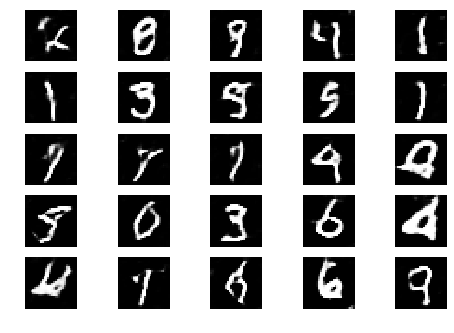

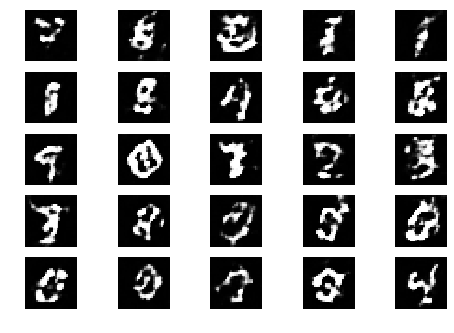

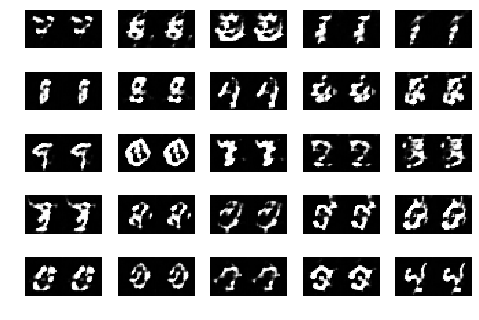

Epoch 0 Batch 801/1875 [D loss: 0.816956, acc.: 46.88%] [G loss: 1.405506]
Epoch 0 Batch 802/1875 [D loss: 0.749676, acc.: 50.00%] [G loss: 1.260072]
Epoch 0 Batch 803/1875 [D loss: 0.683537, acc.: 56.25%] [G loss: 1.370090]
Epoch 0 Batch 804/1875 [D loss: 0.650483, acc.: 62.50%] [G loss: 1.445918]
Epoch 0 Batch 805/1875 [D loss: 0.709962, acc.: 68.75%] [G loss: 1.460577]
Epoch 0 Batch 806/1875 [D loss: 0.585275, acc.: 68.75%] [G loss: 1.236441]
Epoch 0 Batch 807/1875 [D loss: 0.608883, acc.: 71.88%] [G loss: 1.493526]
Epoch 0 Batch 808/1875 [D loss: 0.608848, acc.: 68.75%] [G loss: 1.608871]
Epoch 0 Batch 809/1875 [D loss: 0.610323, acc.: 62.50%] [G loss: 1.269649]
Epoch 0 Batch 810/1875 [D loss: 0.577181, acc.: 65.62%] [G loss: 1.374304]
Epoch 0 Batch 811/1875 [D loss: 0.638327, acc.: 56.25%] [G loss: 1.296625]
Epoch 0 Batch 812/1875 [D loss: 0.705226, acc.: 53.12%] [G loss: 1.254712]
Epoch 0 Batch 813/1875 [D loss: 0.565262, acc.: 68.75%] [G loss: 1.174468]
Epoch 0 Batch 814/1875 [D

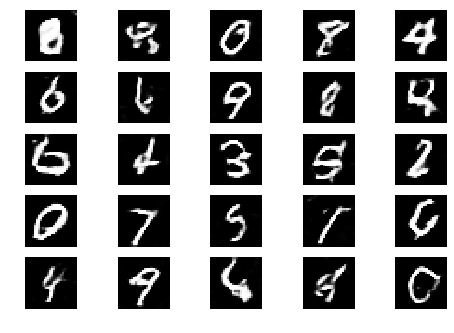

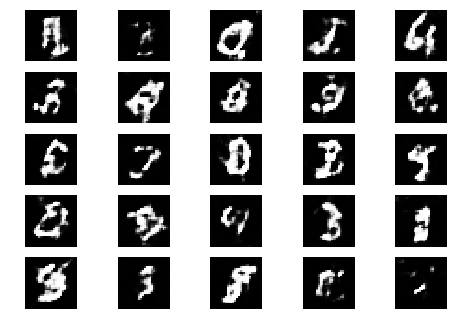

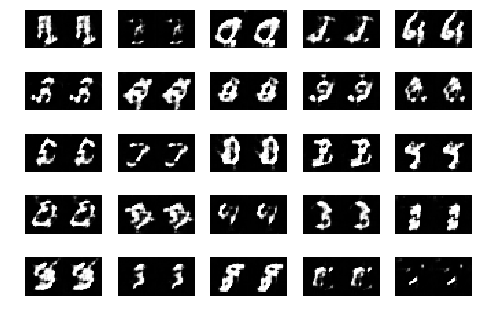

Epoch 0 Batch 901/1875 [D loss: 0.463350, acc.: 78.12%] [G loss: 1.130457]
Epoch 0 Batch 902/1875 [D loss: 0.502874, acc.: 78.12%] [G loss: 1.267582]
Epoch 0 Batch 903/1875 [D loss: 0.642035, acc.: 65.62%] [G loss: 1.149918]
Epoch 0 Batch 904/1875 [D loss: 0.702822, acc.: 56.25%] [G loss: 1.334642]
Epoch 0 Batch 905/1875 [D loss: 0.707384, acc.: 65.62%] [G loss: 1.373082]
Epoch 0 Batch 906/1875 [D loss: 0.493716, acc.: 71.88%] [G loss: 1.396533]
Epoch 0 Batch 907/1875 [D loss: 0.779339, acc.: 40.62%] [G loss: 1.503334]
Epoch 0 Batch 908/1875 [D loss: 0.665904, acc.: 75.00%] [G loss: 1.221684]
Epoch 0 Batch 909/1875 [D loss: 0.537364, acc.: 81.25%] [G loss: 1.593150]
Epoch 0 Batch 910/1875 [D loss: 0.679982, acc.: 50.00%] [G loss: 1.127992]
Epoch 0 Batch 911/1875 [D loss: 0.718110, acc.: 59.38%] [G loss: 1.315421]
Epoch 0 Batch 912/1875 [D loss: 0.481499, acc.: 68.75%] [G loss: 1.260017]
Epoch 0 Batch 913/1875 [D loss: 0.531912, acc.: 71.88%] [G loss: 1.237813]
Epoch 0 Batch 914/1875 [D

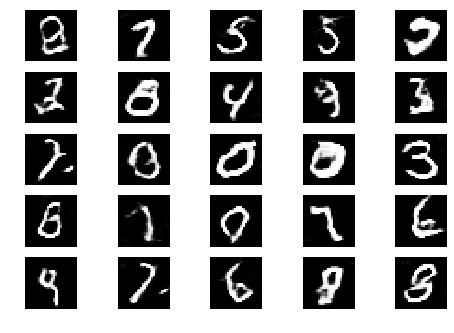

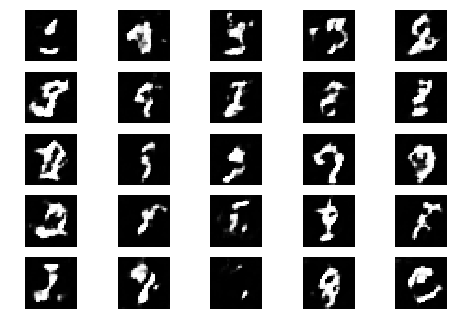

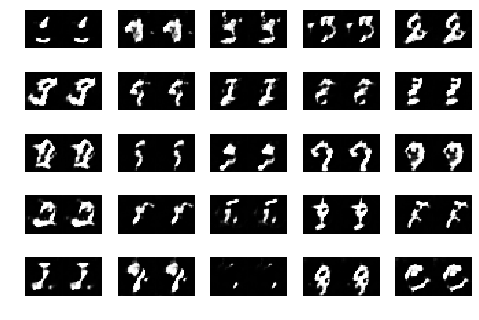

Epoch 0 Batch 1001/1875 [D loss: 0.561725, acc.: 68.75%] [G loss: 1.403144]
Epoch 0 Batch 1002/1875 [D loss: 0.533049, acc.: 78.12%] [G loss: 1.118859]
Epoch 0 Batch 1003/1875 [D loss: 0.357896, acc.: 90.62%] [G loss: 1.227411]
Epoch 0 Batch 1004/1875 [D loss: 0.377219, acc.: 93.75%] [G loss: 1.202892]
Epoch 0 Batch 1005/1875 [D loss: 0.652981, acc.: 65.62%] [G loss: 0.888069]
Epoch 0 Batch 1006/1875 [D loss: 0.713997, acc.: 62.50%] [G loss: 1.322714]
Epoch 0 Batch 1007/1875 [D loss: 0.559220, acc.: 65.62%] [G loss: 1.712223]
Epoch 0 Batch 1008/1875 [D loss: 0.566927, acc.: 75.00%] [G loss: 1.723133]
Epoch 0 Batch 1009/1875 [D loss: 0.649588, acc.: 62.50%] [G loss: 1.510947]
Epoch 0 Batch 1010/1875 [D loss: 0.397053, acc.: 75.00%] [G loss: 1.453319]
Epoch 0 Batch 1011/1875 [D loss: 0.475172, acc.: 81.25%] [G loss: 1.134723]
Epoch 0 Batch 1012/1875 [D loss: 0.744043, acc.: 53.12%] [G loss: 1.592858]
Epoch 0 Batch 1013/1875 [D loss: 0.555971, acc.: 68.75%] [G loss: 1.110641]
Epoch 0 Batc

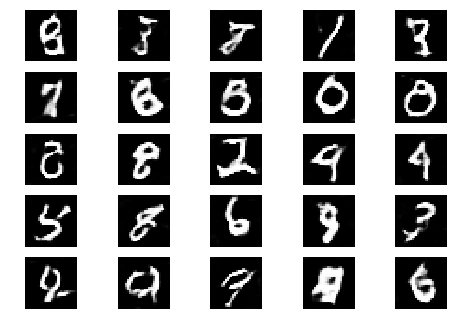

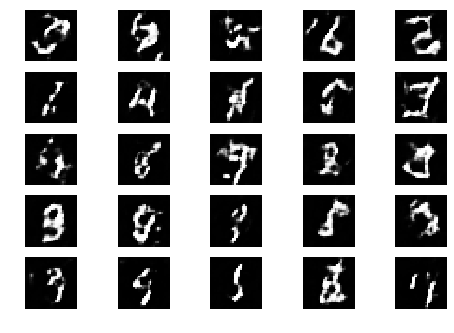

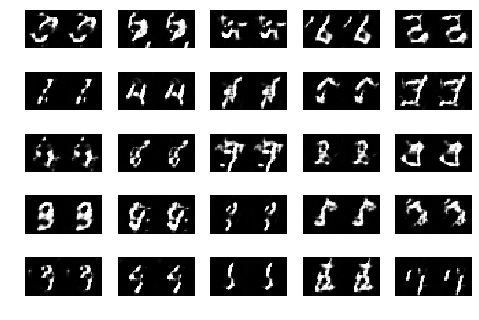

Epoch 0 Batch 1101/1875 [D loss: 0.456107, acc.: 81.25%] [G loss: 1.409699]
Epoch 0 Batch 1102/1875 [D loss: 0.496078, acc.: 81.25%] [G loss: 1.421064]
Epoch 0 Batch 1103/1875 [D loss: 0.528298, acc.: 75.00%] [G loss: 1.124316]
Epoch 0 Batch 1104/1875 [D loss: 0.611818, acc.: 71.88%] [G loss: 1.286984]
Epoch 0 Batch 1105/1875 [D loss: 0.756971, acc.: 62.50%] [G loss: 1.906195]
Epoch 0 Batch 1106/1875 [D loss: 0.633740, acc.: 65.62%] [G loss: 1.730482]
Epoch 0 Batch 1107/1875 [D loss: 0.683015, acc.: 59.38%] [G loss: 1.434322]
Epoch 0 Batch 1108/1875 [D loss: 0.448299, acc.: 84.38%] [G loss: 1.492341]
Epoch 0 Batch 1109/1875 [D loss: 0.765095, acc.: 50.00%] [G loss: 1.420033]
Epoch 0 Batch 1110/1875 [D loss: 0.526213, acc.: 75.00%] [G loss: 1.724133]
Epoch 0 Batch 1111/1875 [D loss: 0.521238, acc.: 75.00%] [G loss: 1.470349]
Epoch 0 Batch 1112/1875 [D loss: 0.701067, acc.: 62.50%] [G loss: 1.425254]
Epoch 0 Batch 1113/1875 [D loss: 0.515801, acc.: 71.88%] [G loss: 1.448566]
Epoch 0 Batc

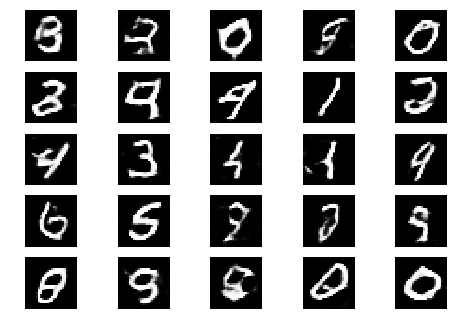

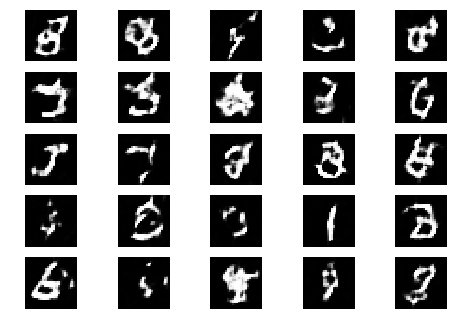

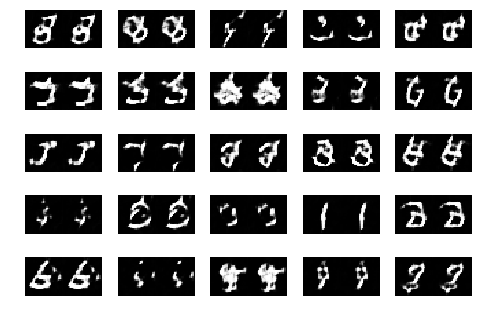

Epoch 0 Batch 1201/1875 [D loss: 0.537177, acc.: 65.62%] [G loss: 1.673887]
Epoch 0 Batch 1202/1875 [D loss: 0.728203, acc.: 62.50%] [G loss: 1.811776]
Epoch 0 Batch 1203/1875 [D loss: 0.655153, acc.: 59.38%] [G loss: 1.740483]
Epoch 0 Batch 1204/1875 [D loss: 0.667657, acc.: 59.38%] [G loss: 1.136487]
Epoch 0 Batch 1205/1875 [D loss: 0.405476, acc.: 84.38%] [G loss: 1.658178]
Epoch 0 Batch 1206/1875 [D loss: 0.656544, acc.: 65.62%] [G loss: 1.712519]
Epoch 0 Batch 1207/1875 [D loss: 0.501677, acc.: 78.12%] [G loss: 1.415693]
Epoch 0 Batch 1208/1875 [D loss: 0.547034, acc.: 75.00%] [G loss: 1.788728]
Epoch 0 Batch 1209/1875 [D loss: 0.504973, acc.: 78.12%] [G loss: 1.738559]
Epoch 0 Batch 1210/1875 [D loss: 0.631108, acc.: 65.62%] [G loss: 1.413134]
Epoch 0 Batch 1211/1875 [D loss: 0.441542, acc.: 84.38%] [G loss: 1.421077]
Epoch 0 Batch 1212/1875 [D loss: 0.665842, acc.: 71.88%] [G loss: 1.433267]
Epoch 0 Batch 1213/1875 [D loss: 0.689045, acc.: 56.25%] [G loss: 1.571696]
Epoch 0 Batc

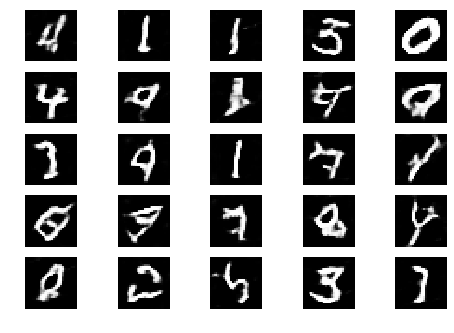

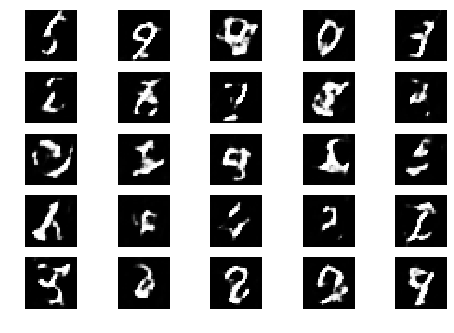

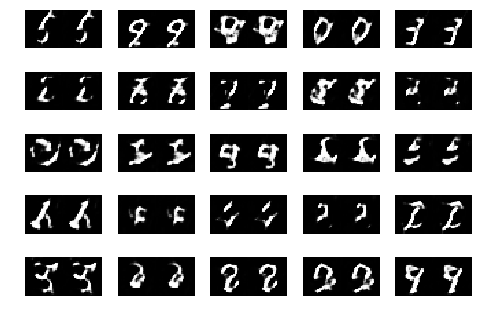

Epoch 0 Batch 1301/1875 [D loss: 0.381653, acc.: 81.25%] [G loss: 1.787241]
Epoch 0 Batch 1302/1875 [D loss: 0.493071, acc.: 81.25%] [G loss: 1.568451]
Epoch 0 Batch 1303/1875 [D loss: 0.531183, acc.: 71.88%] [G loss: 1.644299]
Epoch 0 Batch 1304/1875 [D loss: 0.442543, acc.: 75.00%] [G loss: 1.367533]
Epoch 0 Batch 1305/1875 [D loss: 0.428917, acc.: 81.25%] [G loss: 1.502320]
Epoch 0 Batch 1306/1875 [D loss: 0.469537, acc.: 75.00%] [G loss: 1.546649]
Epoch 0 Batch 1307/1875 [D loss: 0.429199, acc.: 87.50%] [G loss: 1.683913]
Epoch 0 Batch 1308/1875 [D loss: 0.489876, acc.: 81.25%] [G loss: 1.692908]
Epoch 0 Batch 1309/1875 [D loss: 0.280602, acc.: 93.75%] [G loss: 1.885855]
Epoch 0 Batch 1310/1875 [D loss: 0.404697, acc.: 81.25%] [G loss: 1.612983]
Epoch 0 Batch 1311/1875 [D loss: 0.454179, acc.: 75.00%] [G loss: 1.688847]
Epoch 0 Batch 1312/1875 [D loss: 0.411813, acc.: 78.12%] [G loss: 1.474942]
Epoch 0 Batch 1313/1875 [D loss: 0.334399, acc.: 87.50%] [G loss: 1.620937]
Epoch 0 Batc

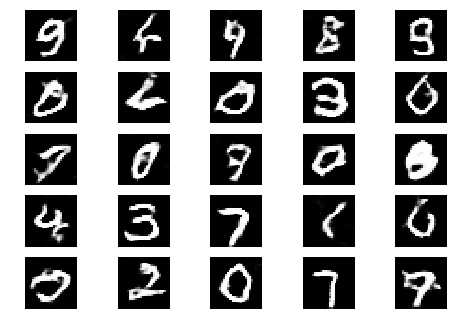

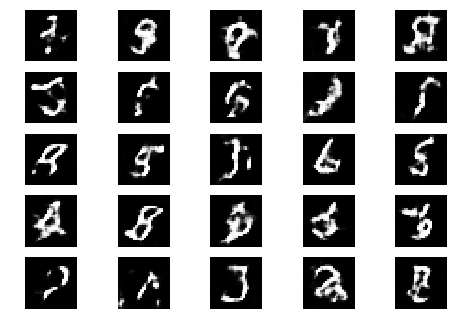

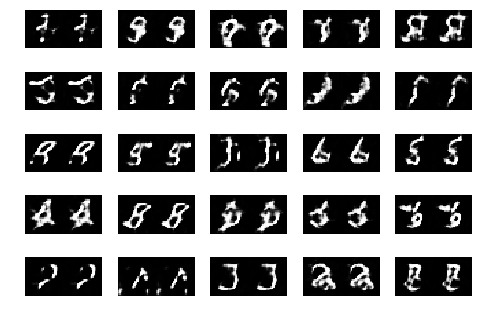

Epoch 0 Batch 1401/1875 [D loss: 0.567596, acc.: 59.38%] [G loss: 1.427917]
Epoch 0 Batch 1402/1875 [D loss: 0.419615, acc.: 78.12%] [G loss: 1.558332]
Epoch 0 Batch 1403/1875 [D loss: 0.483316, acc.: 75.00%] [G loss: 1.646007]
Epoch 0 Batch 1404/1875 [D loss: 0.373411, acc.: 84.38%] [G loss: 1.976184]
Epoch 0 Batch 1405/1875 [D loss: 0.563316, acc.: 71.88%] [G loss: 1.723505]
Epoch 0 Batch 1406/1875 [D loss: 0.283646, acc.: 93.75%] [G loss: 1.899816]
Epoch 0 Batch 1407/1875 [D loss: 0.305366, acc.: 87.50%] [G loss: 2.106702]
Epoch 0 Batch 1408/1875 [D loss: 0.367738, acc.: 90.62%] [G loss: 1.738919]
Epoch 0 Batch 1409/1875 [D loss: 0.281557, acc.: 96.88%] [G loss: 1.829802]
Epoch 0 Batch 1410/1875 [D loss: 0.297601, acc.: 81.25%] [G loss: 2.094952]
Epoch 0 Batch 1411/1875 [D loss: 0.310523, acc.: 87.50%] [G loss: 1.527455]
Epoch 0 Batch 1412/1875 [D loss: 0.387479, acc.: 84.38%] [G loss: 1.965339]
Epoch 0 Batch 1413/1875 [D loss: 0.346219, acc.: 84.38%] [G loss: 1.730348]
Epoch 0 Batc

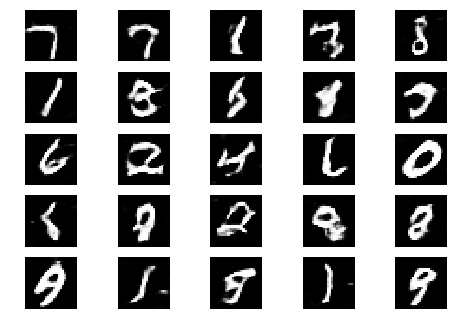

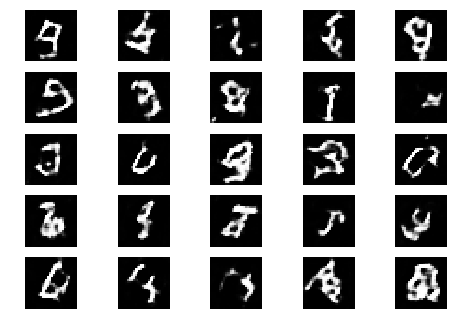

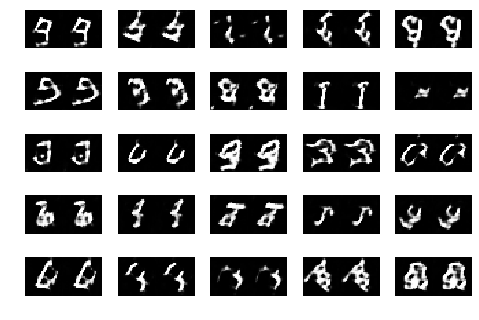

Epoch 0 Batch 1501/1875 [D loss: 0.447394, acc.: 71.88%] [G loss: 2.042535]
Epoch 0 Batch 1502/1875 [D loss: 0.318084, acc.: 90.62%] [G loss: 2.037442]
Epoch 0 Batch 1503/1875 [D loss: 0.357685, acc.: 81.25%] [G loss: 1.922735]
Epoch 0 Batch 1504/1875 [D loss: 0.539580, acc.: 75.00%] [G loss: 2.182389]
Epoch 0 Batch 1505/1875 [D loss: 0.376094, acc.: 78.12%] [G loss: 2.328074]
Epoch 0 Batch 1506/1875 [D loss: 0.417627, acc.: 84.38%] [G loss: 2.192122]
Epoch 0 Batch 1507/1875 [D loss: 0.270321, acc.: 87.50%] [G loss: 2.366350]
Epoch 0 Batch 1508/1875 [D loss: 0.539395, acc.: 71.88%] [G loss: 1.701969]
Epoch 0 Batch 1509/1875 [D loss: 0.488715, acc.: 75.00%] [G loss: 1.737882]
Epoch 0 Batch 1510/1875 [D loss: 0.372886, acc.: 78.12%] [G loss: 1.755864]
Epoch 0 Batch 1511/1875 [D loss: 0.448876, acc.: 84.38%] [G loss: 1.925104]
Epoch 0 Batch 1512/1875 [D loss: 0.253690, acc.: 93.75%] [G loss: 1.700368]
Epoch 0 Batch 1513/1875 [D loss: 0.413339, acc.: 87.50%] [G loss: 2.184189]
Epoch 0 Batc

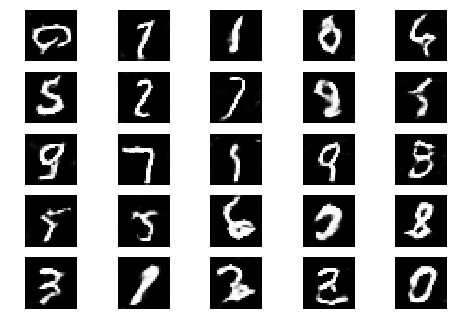

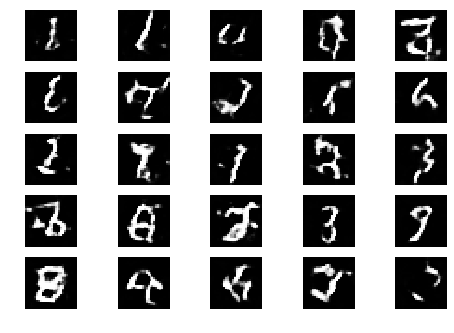

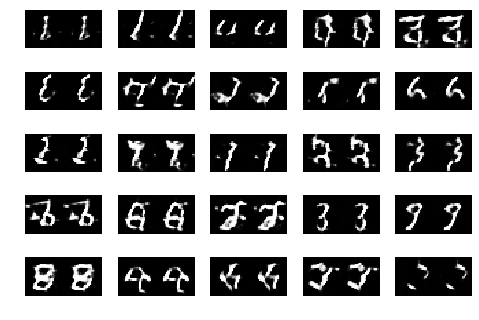

Epoch 0 Batch 1601/1875 [D loss: 0.189968, acc.: 96.88%] [G loss: 2.060463]
Epoch 0 Batch 1602/1875 [D loss: 0.186524, acc.: 93.75%] [G loss: 2.124898]
Epoch 0 Batch 1603/1875 [D loss: 0.281837, acc.: 87.50%] [G loss: 2.052890]
Epoch 0 Batch 1604/1875 [D loss: 0.435273, acc.: 75.00%] [G loss: 2.135698]
Epoch 0 Batch 1605/1875 [D loss: 0.312121, acc.: 87.50%] [G loss: 1.623698]
Epoch 0 Batch 1606/1875 [D loss: 0.228010, acc.: 93.75%] [G loss: 2.390875]
Epoch 0 Batch 1607/1875 [D loss: 0.218666, acc.: 96.88%] [G loss: 2.433096]
Epoch 0 Batch 1608/1875 [D loss: 0.235100, acc.: 93.75%] [G loss: 2.428081]
Epoch 0 Batch 1609/1875 [D loss: 0.356104, acc.: 87.50%] [G loss: 1.772067]
Epoch 0 Batch 1610/1875 [D loss: 0.328661, acc.: 90.62%] [G loss: 1.983252]
Epoch 0 Batch 1611/1875 [D loss: 0.442701, acc.: 81.25%] [G loss: 1.579665]
Epoch 0 Batch 1612/1875 [D loss: 0.416100, acc.: 75.00%] [G loss: 1.977062]
Epoch 0 Batch 1613/1875 [D loss: 0.237925, acc.: 90.62%] [G loss: 2.248655]
Epoch 0 Batc

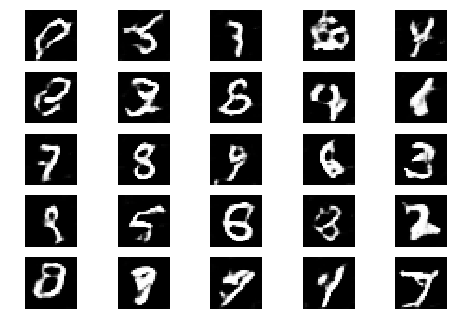

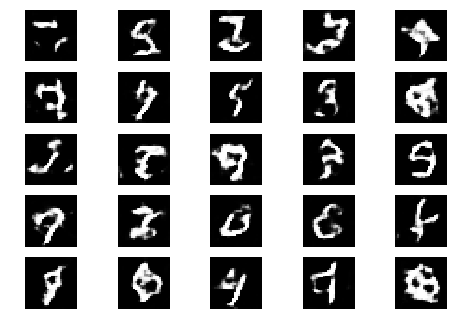

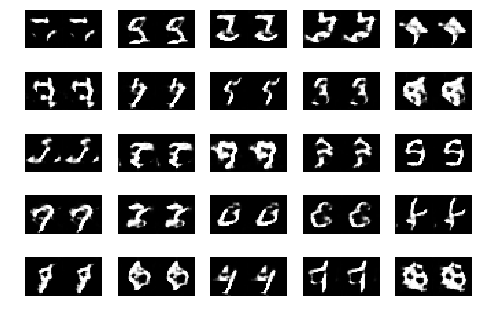

Epoch 0 Batch 1701/1875 [D loss: 0.192117, acc.: 96.88%] [G loss: 2.834701]
Epoch 0 Batch 1702/1875 [D loss: 0.363477, acc.: 90.62%] [G loss: 2.776228]
Epoch 0 Batch 1703/1875 [D loss: 0.243880, acc.: 84.38%] [G loss: 2.728805]
Epoch 0 Batch 1704/1875 [D loss: 0.351845, acc.: 84.38%] [G loss: 1.776895]
Epoch 0 Batch 1705/1875 [D loss: 0.334182, acc.: 90.62%] [G loss: 2.187777]
Epoch 0 Batch 1706/1875 [D loss: 0.190601, acc.: 90.62%] [G loss: 2.628225]
Epoch 0 Batch 1707/1875 [D loss: 0.258176, acc.: 87.50%] [G loss: 2.457529]
Epoch 0 Batch 1708/1875 [D loss: 0.346001, acc.: 93.75%] [G loss: 2.318604]
Epoch 0 Batch 1709/1875 [D loss: 0.212959, acc.: 96.88%] [G loss: 2.225316]
Epoch 0 Batch 1710/1875 [D loss: 0.262374, acc.: 87.50%] [G loss: 2.434023]
Epoch 0 Batch 1711/1875 [D loss: 0.221142, acc.: 96.88%] [G loss: 2.458045]
Epoch 0 Batch 1712/1875 [D loss: 0.328954, acc.: 84.38%] [G loss: 2.186024]
Epoch 0 Batch 1713/1875 [D loss: 0.212290, acc.: 96.88%] [G loss: 1.908489]
Epoch 0 Batc

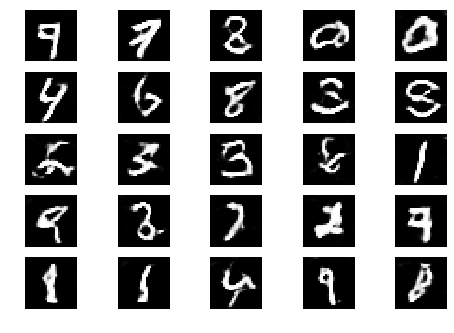

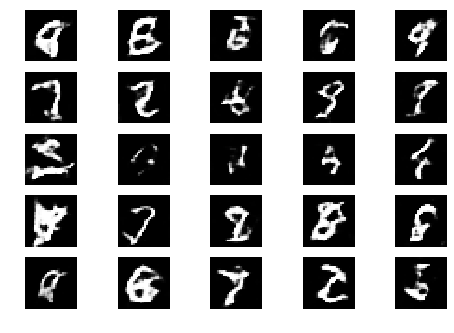

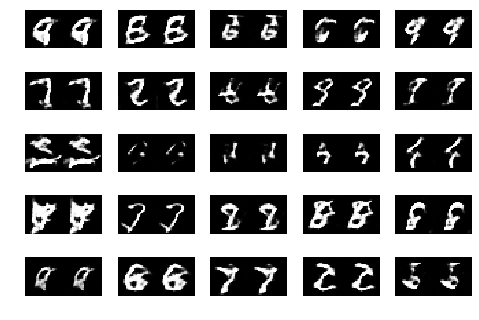

Epoch 0 Batch 1801/1875 [D loss: 0.221167, acc.: 90.62%] [G loss: 2.128028]
Epoch 0 Batch 1802/1875 [D loss: 0.207416, acc.: 93.75%] [G loss: 2.728929]
Epoch 0 Batch 1803/1875 [D loss: 0.453247, acc.: 81.25%] [G loss: 1.822775]
Epoch 0 Batch 1804/1875 [D loss: 0.281859, acc.: 87.50%] [G loss: 2.096018]
Epoch 0 Batch 1805/1875 [D loss: 0.139900, acc.: 100.00%] [G loss: 2.751489]
Epoch 0 Batch 1806/1875 [D loss: 0.192951, acc.: 96.88%] [G loss: 2.798119]
Epoch 0 Batch 1807/1875 [D loss: 0.118340, acc.: 96.88%] [G loss: 3.018698]
Epoch 0 Batch 1808/1875 [D loss: 0.156616, acc.: 96.88%] [G loss: 3.007698]
Epoch 0 Batch 1809/1875 [D loss: 0.174056, acc.: 93.75%] [G loss: 3.379638]
Epoch 0 Batch 1810/1875 [D loss: 0.078145, acc.: 100.00%] [G loss: 2.642668]
Epoch 0 Batch 1811/1875 [D loss: 0.106119, acc.: 96.88%] [G loss: 2.800637]
Epoch 0 Batch 1812/1875 [D loss: 0.109724, acc.: 96.88%] [G loss: 2.813501]
Epoch 0 Batch 1813/1875 [D loss: 0.106290, acc.: 96.88%] [G loss: 3.213394]
Epoch 0 Ba

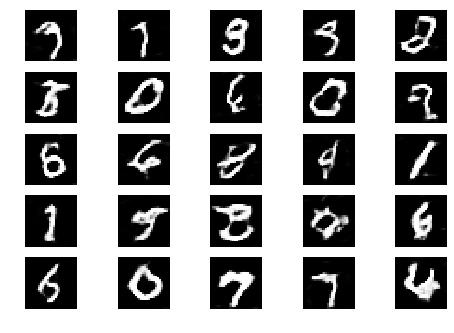

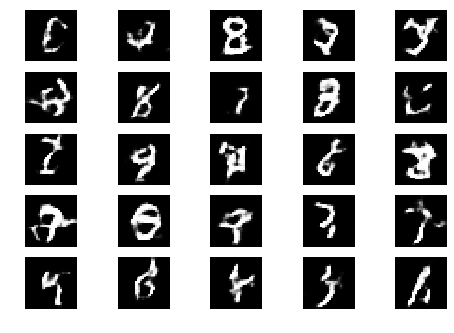

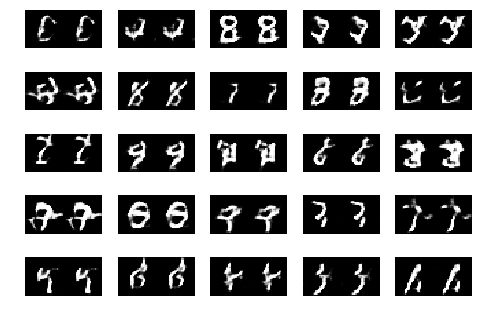

Epoch 1 Batch 1/1875 [D loss: 0.139317, acc.: 100.00%] [G loss: 2.849119]
Epoch 1 Batch 2/1875 [D loss: 0.260868, acc.: 93.75%] [G loss: 2.786532]
Epoch 1 Batch 3/1875 [D loss: 0.177829, acc.: 96.88%] [G loss: 2.967960]
Epoch 1 Batch 4/1875 [D loss: 0.306556, acc.: 84.38%] [G loss: 2.621890]
Epoch 1 Batch 5/1875 [D loss: 0.104862, acc.: 96.88%] [G loss: 2.897666]
Epoch 1 Batch 6/1875 [D loss: 0.168410, acc.: 93.75%] [G loss: 3.107441]
Epoch 1 Batch 7/1875 [D loss: 0.158583, acc.: 100.00%] [G loss: 3.214105]
Epoch 1 Batch 8/1875 [D loss: 0.277123, acc.: 90.62%] [G loss: 2.773438]
Epoch 1 Batch 9/1875 [D loss: 0.139673, acc.: 93.75%] [G loss: 2.331252]
Epoch 1 Batch 10/1875 [D loss: 0.286703, acc.: 90.62%] [G loss: 2.375862]
Epoch 1 Batch 11/1875 [D loss: 0.106934, acc.: 100.00%] [G loss: 3.121747]
Epoch 1 Batch 12/1875 [D loss: 0.237776, acc.: 90.62%] [G loss: 2.871238]
Epoch 1 Batch 13/1875 [D loss: 0.122555, acc.: 96.88%] [G loss: 2.699235]
Epoch 1 Batch 14/1875 [D loss: 0.171352, acc

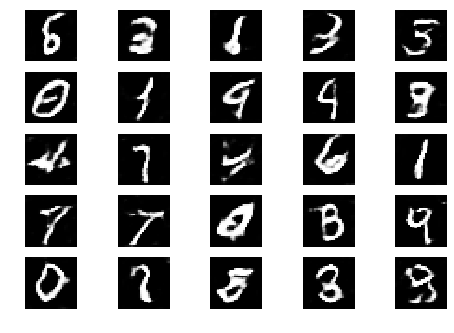

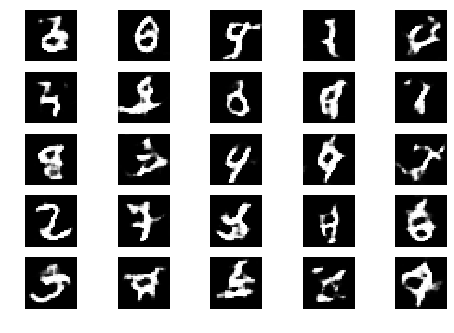

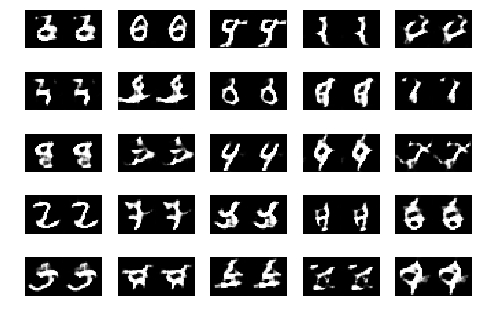

Epoch 1 Batch 101/1875 [D loss: 0.247508, acc.: 84.38%] [G loss: 2.745400]
Epoch 1 Batch 102/1875 [D loss: 0.262101, acc.: 90.62%] [G loss: 2.408666]
Epoch 1 Batch 103/1875 [D loss: 0.212607, acc.: 90.62%] [G loss: 2.965632]
Epoch 1 Batch 104/1875 [D loss: 0.158333, acc.: 93.75%] [G loss: 2.574144]
Epoch 1 Batch 105/1875 [D loss: 0.206864, acc.: 96.88%] [G loss: 2.799520]
Epoch 1 Batch 106/1875 [D loss: 0.198243, acc.: 93.75%] [G loss: 2.795997]
Epoch 1 Batch 107/1875 [D loss: 0.104609, acc.: 100.00%] [G loss: 3.219573]
Epoch 1 Batch 108/1875 [D loss: 0.069079, acc.: 100.00%] [G loss: 3.574619]
Epoch 1 Batch 109/1875 [D loss: 0.214766, acc.: 90.62%] [G loss: 3.174454]
Epoch 1 Batch 110/1875 [D loss: 0.102101, acc.: 100.00%] [G loss: 2.861856]
Epoch 1 Batch 111/1875 [D loss: 0.102942, acc.: 96.88%] [G loss: 2.844952]
Epoch 1 Batch 112/1875 [D loss: 0.179712, acc.: 96.88%] [G loss: 3.102524]
Epoch 1 Batch 113/1875 [D loss: 0.083586, acc.: 100.00%] [G loss: 3.581495]
Epoch 1 Batch 114/187

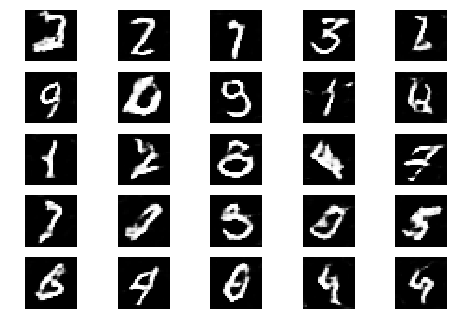

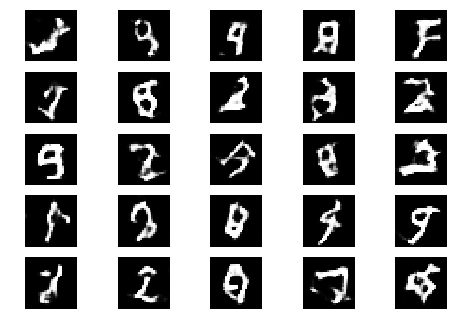

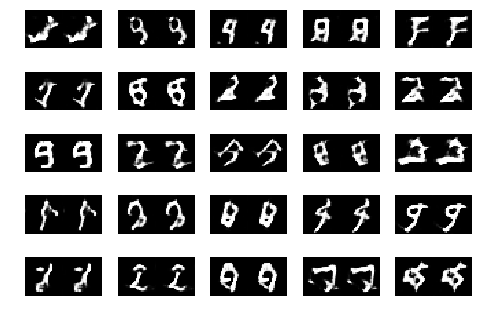

Epoch 1 Batch 201/1875 [D loss: 0.117486, acc.: 96.88%] [G loss: 3.683909]
Epoch 1 Batch 202/1875 [D loss: 0.149001, acc.: 96.88%] [G loss: 3.694746]
Epoch 1 Batch 203/1875 [D loss: 0.094853, acc.: 96.88%] [G loss: 3.476882]
Epoch 1 Batch 204/1875 [D loss: 0.063170, acc.: 100.00%] [G loss: 3.556132]
Epoch 1 Batch 205/1875 [D loss: 0.203643, acc.: 93.75%] [G loss: 2.935032]
Epoch 1 Batch 206/1875 [D loss: 0.108117, acc.: 96.88%] [G loss: 3.092326]
Epoch 1 Batch 207/1875 [D loss: 0.086072, acc.: 100.00%] [G loss: 3.149333]
Epoch 1 Batch 208/1875 [D loss: 0.063849, acc.: 100.00%] [G loss: 4.030895]
Epoch 1 Batch 209/1875 [D loss: 0.059208, acc.: 96.88%] [G loss: 3.008879]
Epoch 1 Batch 210/1875 [D loss: 0.147385, acc.: 96.88%] [G loss: 3.184412]
Epoch 1 Batch 211/1875 [D loss: 0.128745, acc.: 93.75%] [G loss: 3.621548]
Epoch 1 Batch 212/1875 [D loss: 0.105352, acc.: 96.88%] [G loss: 3.523657]
Epoch 1 Batch 213/1875 [D loss: 0.117986, acc.: 96.88%] [G loss: 3.386075]
Epoch 1 Batch 214/1875

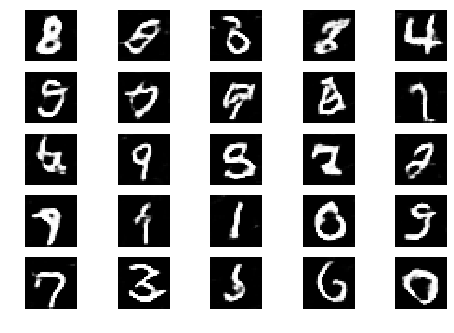

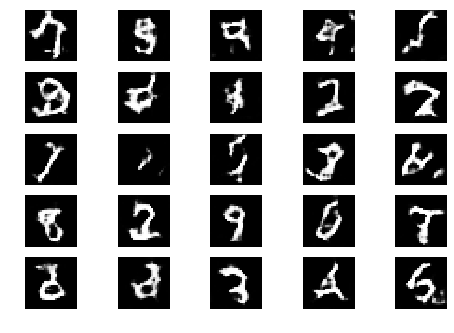

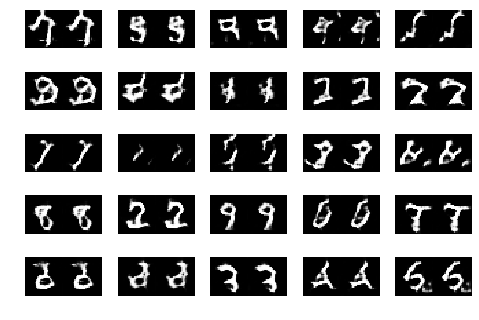

Epoch 1 Batch 301/1875 [D loss: 0.088771, acc.: 96.88%] [G loss: 3.688911]
Epoch 1 Batch 302/1875 [D loss: 0.026678, acc.: 100.00%] [G loss: 4.251127]
Epoch 1 Batch 303/1875 [D loss: 0.093720, acc.: 96.88%] [G loss: 3.861452]
Epoch 1 Batch 304/1875 [D loss: 0.352175, acc.: 81.25%] [G loss: 2.828504]
Epoch 1 Batch 305/1875 [D loss: 0.115484, acc.: 96.88%] [G loss: 3.206891]
Epoch 1 Batch 306/1875 [D loss: 0.067955, acc.: 100.00%] [G loss: 3.349012]
Epoch 1 Batch 307/1875 [D loss: 0.096621, acc.: 93.75%] [G loss: 3.508248]
Epoch 1 Batch 308/1875 [D loss: 0.142706, acc.: 93.75%] [G loss: 3.752373]
Epoch 1 Batch 309/1875 [D loss: 0.174506, acc.: 93.75%] [G loss: 2.737058]
Epoch 1 Batch 310/1875 [D loss: 0.054352, acc.: 100.00%] [G loss: 3.745059]
Epoch 1 Batch 311/1875 [D loss: 0.073966, acc.: 100.00%] [G loss: 3.643038]
Epoch 1 Batch 312/1875 [D loss: 0.090115, acc.: 96.88%] [G loss: 3.341668]
Epoch 1 Batch 313/1875 [D loss: 0.144999, acc.: 93.75%] [G loss: 3.102086]
Epoch 1 Batch 314/187

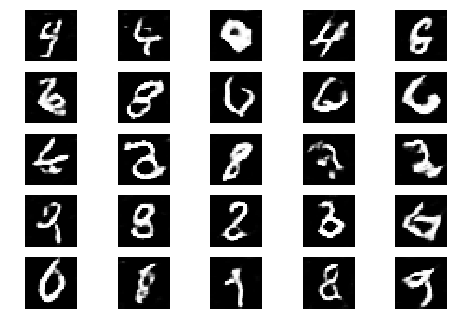

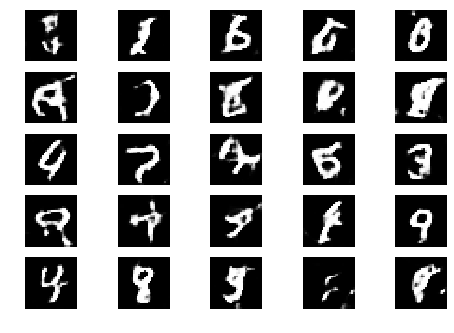

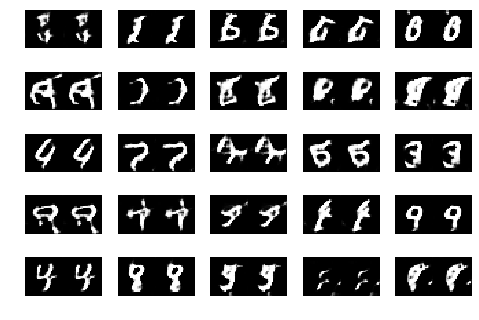

Epoch 1 Batch 401/1875 [D loss: 0.052679, acc.: 100.00%] [G loss: 4.430644]
Epoch 1 Batch 402/1875 [D loss: 0.085981, acc.: 100.00%] [G loss: 4.328022]
Epoch 1 Batch 403/1875 [D loss: 0.039100, acc.: 96.88%] [G loss: 4.264159]
Epoch 1 Batch 404/1875 [D loss: 0.074375, acc.: 96.88%] [G loss: 4.480904]
Epoch 1 Batch 405/1875 [D loss: 0.082278, acc.: 100.00%] [G loss: 4.144468]
Epoch 1 Batch 406/1875 [D loss: 0.164294, acc.: 93.75%] [G loss: 3.699159]
Epoch 1 Batch 407/1875 [D loss: 0.025434, acc.: 100.00%] [G loss: 3.991489]
Epoch 1 Batch 408/1875 [D loss: 0.174149, acc.: 90.62%] [G loss: 3.641395]
Epoch 1 Batch 409/1875 [D loss: 0.032739, acc.: 100.00%] [G loss: 3.772658]
Epoch 1 Batch 410/1875 [D loss: 0.084980, acc.: 93.75%] [G loss: 4.085424]
Epoch 1 Batch 411/1875 [D loss: 0.060149, acc.: 100.00%] [G loss: 3.907510]
Epoch 1 Batch 412/1875 [D loss: 0.081163, acc.: 96.88%] [G loss: 4.410152]
Epoch 1 Batch 413/1875 [D loss: 0.088539, acc.: 96.88%] [G loss: 3.944069]
Epoch 1 Batch 414/1

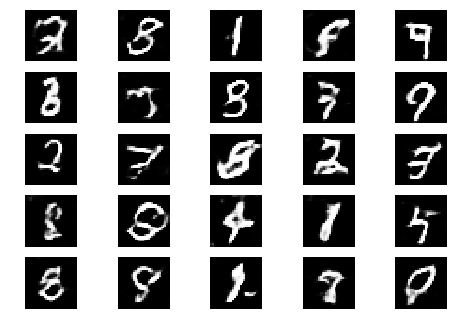

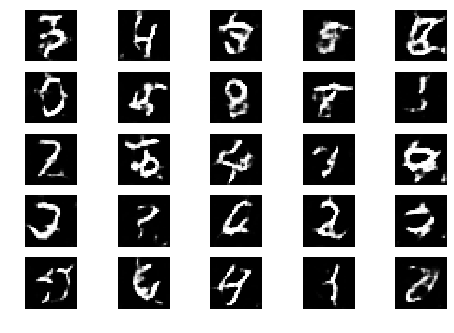

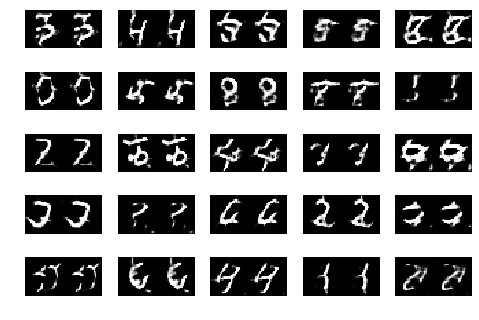

Epoch 1 Batch 501/1875 [D loss: 0.056689, acc.: 100.00%] [G loss: 3.804531]
Epoch 1 Batch 502/1875 [D loss: 0.238153, acc.: 87.50%] [G loss: 3.530140]
Epoch 1 Batch 503/1875 [D loss: 0.080811, acc.: 96.88%] [G loss: 4.333097]
Epoch 1 Batch 504/1875 [D loss: 0.023772, acc.: 100.00%] [G loss: 4.357416]
Epoch 1 Batch 505/1875 [D loss: 0.051940, acc.: 100.00%] [G loss: 4.557327]
Epoch 1 Batch 506/1875 [D loss: 0.083180, acc.: 96.88%] [G loss: 4.500819]
Epoch 1 Batch 507/1875 [D loss: 0.076433, acc.: 96.88%] [G loss: 4.056897]
Epoch 1 Batch 508/1875 [D loss: 0.052347, acc.: 96.88%] [G loss: 3.738188]
Epoch 1 Batch 509/1875 [D loss: 0.038387, acc.: 100.00%] [G loss: 4.009470]
Epoch 1 Batch 510/1875 [D loss: 0.048655, acc.: 96.88%] [G loss: 3.940256]
Epoch 1 Batch 511/1875 [D loss: 0.041605, acc.: 96.88%] [G loss: 4.353545]
Epoch 1 Batch 512/1875 [D loss: 0.049726, acc.: 100.00%] [G loss: 4.123446]
Epoch 1 Batch 513/1875 [D loss: 0.152275, acc.: 93.75%] [G loss: 4.146607]
Epoch 1 Batch 514/18

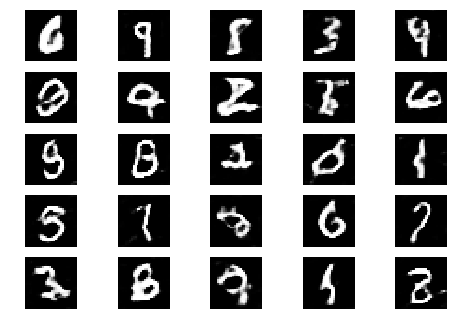

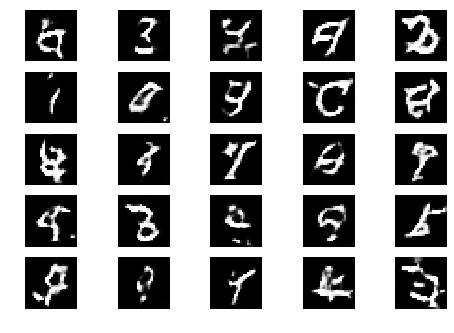

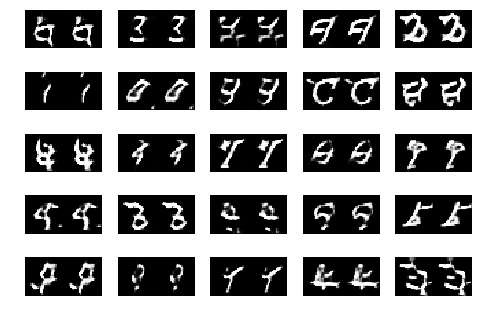

Epoch 1 Batch 601/1875 [D loss: 0.027329, acc.: 100.00%] [G loss: 4.926368]
Epoch 1 Batch 602/1875 [D loss: 0.068147, acc.: 96.88%] [G loss: 5.174366]
Epoch 1 Batch 603/1875 [D loss: 0.029684, acc.: 100.00%] [G loss: 5.061088]
Epoch 1 Batch 604/1875 [D loss: 0.044343, acc.: 100.00%] [G loss: 4.669467]
Epoch 1 Batch 605/1875 [D loss: 0.188775, acc.: 90.62%] [G loss: 3.722488]
Epoch 1 Batch 606/1875 [D loss: 0.075008, acc.: 96.88%] [G loss: 3.918302]
Epoch 1 Batch 607/1875 [D loss: 0.099163, acc.: 96.88%] [G loss: 3.338341]
Epoch 1 Batch 608/1875 [D loss: 0.184288, acc.: 90.62%] [G loss: 3.695427]
Epoch 1 Batch 609/1875 [D loss: 0.104976, acc.: 96.88%] [G loss: 4.631782]
Epoch 1 Batch 610/1875 [D loss: 0.037861, acc.: 100.00%] [G loss: 4.824876]
Epoch 1 Batch 611/1875 [D loss: 0.019851, acc.: 100.00%] [G loss: 5.429281]
Epoch 1 Batch 612/1875 [D loss: 0.024497, acc.: 100.00%] [G loss: 5.174695]
Epoch 1 Batch 613/1875 [D loss: 0.034120, acc.: 100.00%] [G loss: 5.283476]
Epoch 1 Batch 614/

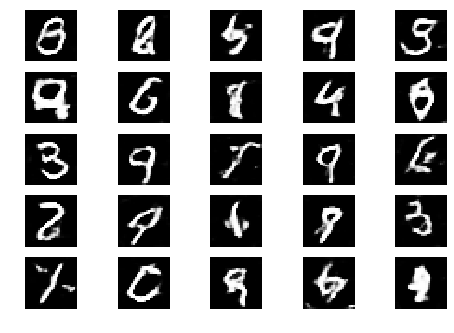

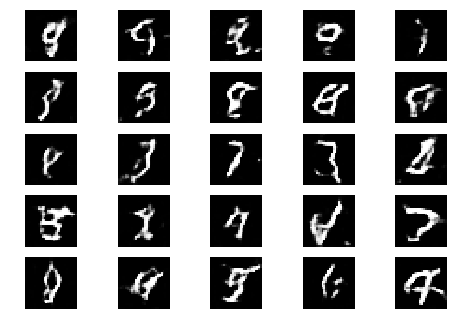

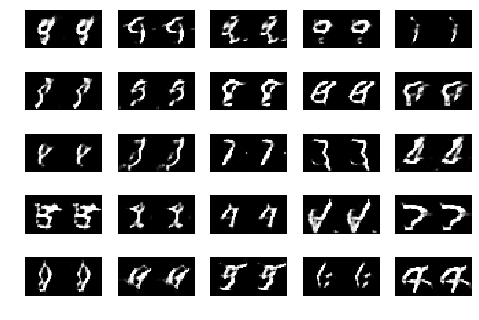

Epoch 1 Batch 701/1875 [D loss: 0.073667, acc.: 96.88%] [G loss: 4.412162]
Epoch 1 Batch 702/1875 [D loss: 0.051741, acc.: 96.88%] [G loss: 4.800495]
Epoch 1 Batch 703/1875 [D loss: 0.011073, acc.: 100.00%] [G loss: 4.666617]
Epoch 1 Batch 704/1875 [D loss: 0.048524, acc.: 96.88%] [G loss: 4.286266]
Epoch 1 Batch 705/1875 [D loss: 0.056601, acc.: 96.88%] [G loss: 4.069101]
Epoch 1 Batch 706/1875 [D loss: 0.042128, acc.: 100.00%] [G loss: 4.658770]
Epoch 1 Batch 707/1875 [D loss: 0.113070, acc.: 90.62%] [G loss: 4.832207]
Epoch 1 Batch 708/1875 [D loss: 0.103058, acc.: 96.88%] [G loss: 4.179101]
Epoch 1 Batch 709/1875 [D loss: 0.065454, acc.: 100.00%] [G loss: 4.245137]
Epoch 1 Batch 710/1875 [D loss: 0.198050, acc.: 93.75%] [G loss: 5.198559]
Epoch 1 Batch 711/1875 [D loss: 0.020129, acc.: 100.00%] [G loss: 5.499608]
Epoch 1 Batch 712/1875 [D loss: 0.021909, acc.: 100.00%] [G loss: 5.684336]
Epoch 1 Batch 713/1875 [D loss: 0.172674, acc.: 93.75%] [G loss: 4.488811]
Epoch 1 Batch 714/18

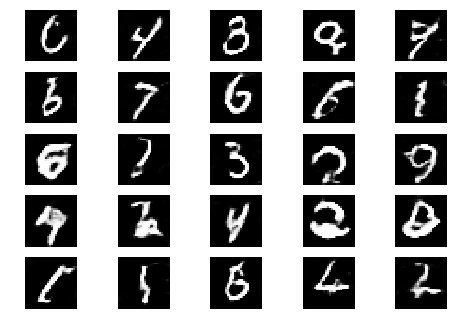

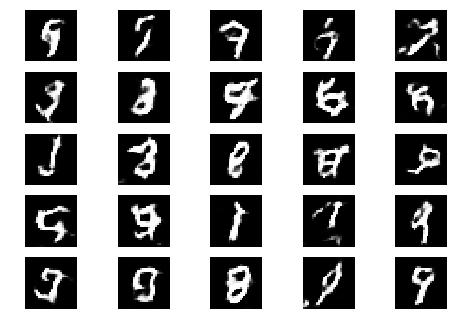

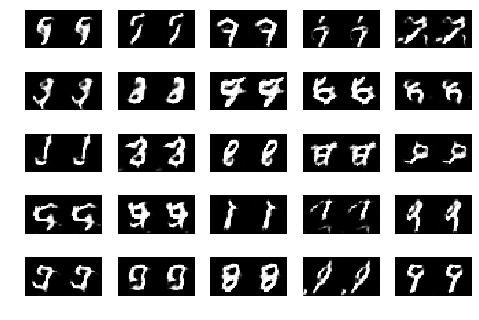

Epoch 1 Batch 801/1875 [D loss: 0.104835, acc.: 93.75%] [G loss: 4.764106]
Epoch 1 Batch 802/1875 [D loss: 0.012423, acc.: 100.00%] [G loss: 4.693259]
Epoch 1 Batch 803/1875 [D loss: 0.058584, acc.: 96.88%] [G loss: 4.494379]
Epoch 1 Batch 804/1875 [D loss: 0.031834, acc.: 100.00%] [G loss: 4.415833]
Epoch 1 Batch 805/1875 [D loss: 0.013057, acc.: 100.00%] [G loss: 4.857952]
Epoch 1 Batch 806/1875 [D loss: 0.040653, acc.: 96.88%] [G loss: 5.158265]
Epoch 1 Batch 807/1875 [D loss: 0.095440, acc.: 96.88%] [G loss: 4.441026]
Epoch 1 Batch 808/1875 [D loss: 0.022873, acc.: 100.00%] [G loss: 5.342884]
Epoch 1 Batch 809/1875 [D loss: 0.073879, acc.: 96.88%] [G loss: 5.033179]
Epoch 1 Batch 810/1875 [D loss: 0.106727, acc.: 96.88%] [G loss: 4.673340]
Epoch 1 Batch 811/1875 [D loss: 0.048224, acc.: 100.00%] [G loss: 4.477595]
Epoch 1 Batch 812/1875 [D loss: 0.032995, acc.: 100.00%] [G loss: 5.207638]
Epoch 1 Batch 813/1875 [D loss: 0.046768, acc.: 100.00%] [G loss: 5.107573]
Epoch 1 Batch 814/

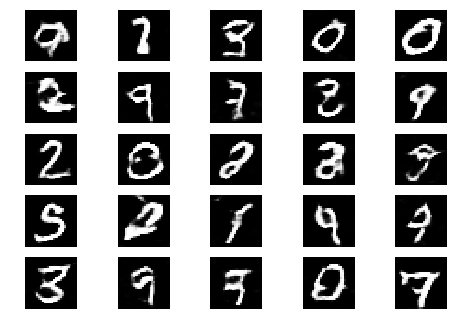

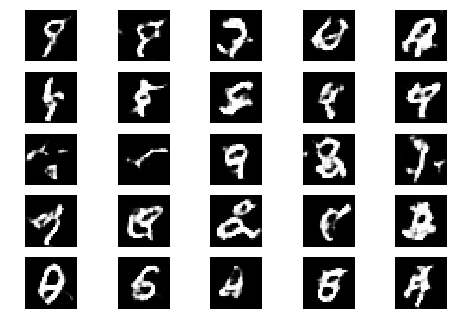

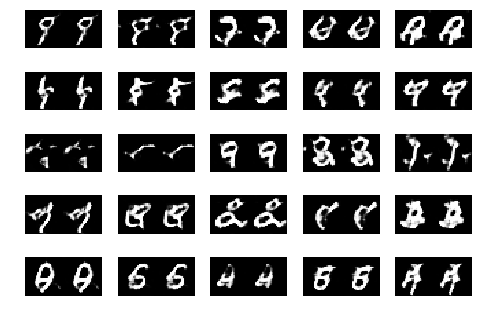

Epoch 1 Batch 901/1875 [D loss: 0.072588, acc.: 96.88%] [G loss: 5.070544]
Epoch 1 Batch 902/1875 [D loss: 0.027896, acc.: 100.00%] [G loss: 5.312616]
Epoch 1 Batch 903/1875 [D loss: 0.145530, acc.: 93.75%] [G loss: 4.192962]
Epoch 1 Batch 904/1875 [D loss: 0.088916, acc.: 93.75%] [G loss: 4.710731]
Epoch 1 Batch 905/1875 [D loss: 0.017528, acc.: 100.00%] [G loss: 5.705661]
Epoch 1 Batch 906/1875 [D loss: 0.016409, acc.: 100.00%] [G loss: 5.553871]
Epoch 1 Batch 907/1875 [D loss: 0.067347, acc.: 96.88%] [G loss: 4.716735]
Epoch 1 Batch 908/1875 [D loss: 0.044639, acc.: 100.00%] [G loss: 4.458339]
Epoch 1 Batch 909/1875 [D loss: 0.043093, acc.: 96.88%] [G loss: 4.077844]
Epoch 1 Batch 910/1875 [D loss: 0.035310, acc.: 100.00%] [G loss: 4.814358]
Epoch 1 Batch 911/1875 [D loss: 0.027539, acc.: 100.00%] [G loss: 4.960193]
Epoch 1 Batch 912/1875 [D loss: 0.045033, acc.: 96.88%] [G loss: 5.109987]
Epoch 1 Batch 913/1875 [D loss: 0.011211, acc.: 100.00%] [G loss: 4.886179]
Epoch 1 Batch 914/

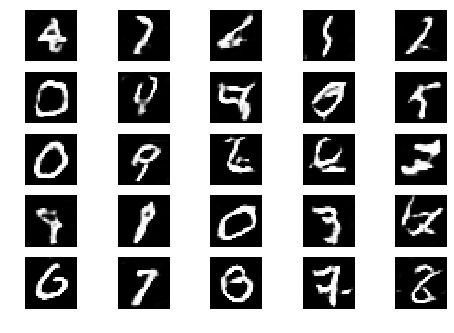

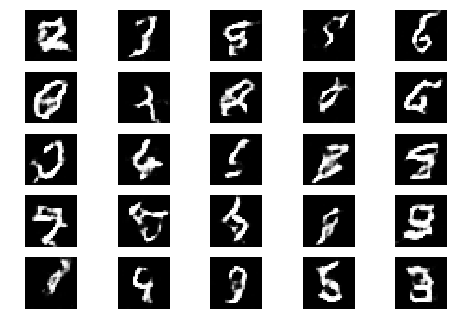

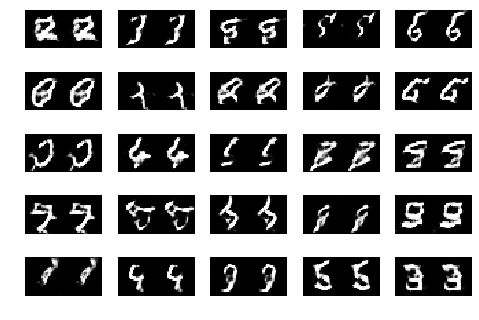

Epoch 1 Batch 1001/1875 [D loss: 0.014892, acc.: 100.00%] [G loss: 5.252127]
Epoch 1 Batch 1002/1875 [D loss: 0.021292, acc.: 100.00%] [G loss: 4.418491]
Epoch 1 Batch 1003/1875 [D loss: 0.015827, acc.: 100.00%] [G loss: 4.931560]
Epoch 1 Batch 1004/1875 [D loss: 0.144641, acc.: 93.75%] [G loss: 4.322927]
Epoch 1 Batch 1005/1875 [D loss: 0.082140, acc.: 96.88%] [G loss: 5.227797]
Epoch 1 Batch 1006/1875 [D loss: 0.024892, acc.: 100.00%] [G loss: 5.528178]
Epoch 1 Batch 1007/1875 [D loss: 0.009053, acc.: 100.00%] [G loss: 5.622641]
Epoch 1 Batch 1008/1875 [D loss: 0.005492, acc.: 100.00%] [G loss: 5.829682]
Epoch 1 Batch 1009/1875 [D loss: 0.025727, acc.: 100.00%] [G loss: 5.391931]
Epoch 1 Batch 1010/1875 [D loss: 0.058871, acc.: 96.88%] [G loss: 4.706489]
Epoch 1 Batch 1011/1875 [D loss: 0.103718, acc.: 96.88%] [G loss: 4.593144]
Epoch 1 Batch 1012/1875 [D loss: 0.068492, acc.: 100.00%] [G loss: 4.914725]
Epoch 1 Batch 1013/1875 [D loss: 0.085968, acc.: 96.88%] [G loss: 4.880442]
Epoc

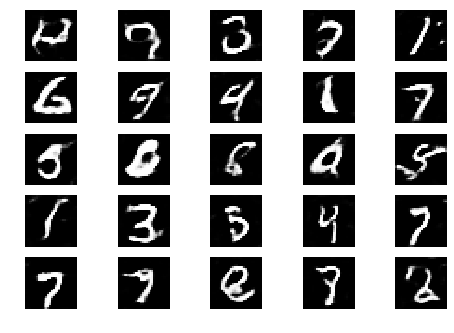

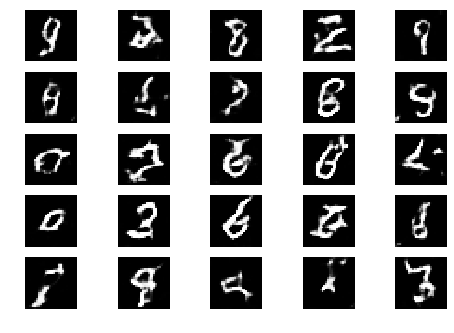

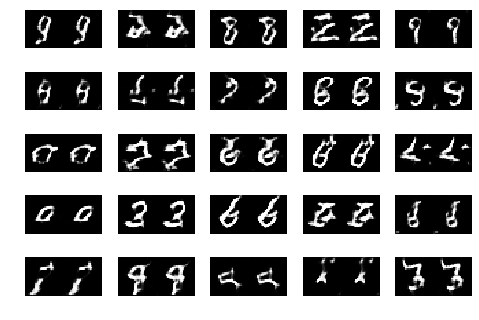

Epoch 1 Batch 1101/1875 [D loss: 0.008567, acc.: 100.00%] [G loss: 5.641484]
Epoch 1 Batch 1102/1875 [D loss: 0.123048, acc.: 93.75%] [G loss: 5.016967]
Epoch 1 Batch 1103/1875 [D loss: 0.032455, acc.: 96.88%] [G loss: 5.033511]
Epoch 1 Batch 1104/1875 [D loss: 0.074130, acc.: 96.88%] [G loss: 5.034277]
Epoch 1 Batch 1105/1875 [D loss: 0.073414, acc.: 96.88%] [G loss: 4.405908]
Epoch 1 Batch 1106/1875 [D loss: 0.071002, acc.: 96.88%] [G loss: 5.024365]
Epoch 1 Batch 1107/1875 [D loss: 0.035892, acc.: 100.00%] [G loss: 5.481395]
Epoch 1 Batch 1108/1875 [D loss: 0.082665, acc.: 96.88%] [G loss: 4.913870]
Epoch 1 Batch 1109/1875 [D loss: 0.015878, acc.: 100.00%] [G loss: 5.405496]
Epoch 1 Batch 1110/1875 [D loss: 0.008758, acc.: 100.00%] [G loss: 5.483520]
Epoch 1 Batch 1111/1875 [D loss: 0.077736, acc.: 96.88%] [G loss: 5.764039]
Epoch 1 Batch 1112/1875 [D loss: 0.008130, acc.: 100.00%] [G loss: 6.003661]
Epoch 1 Batch 1113/1875 [D loss: 0.149381, acc.: 96.88%] [G loss: 5.234314]
Epoch 1

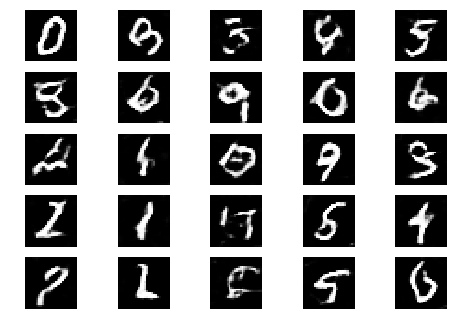

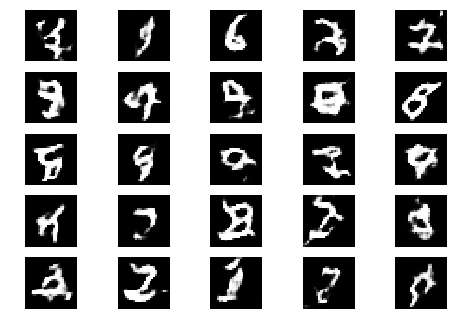

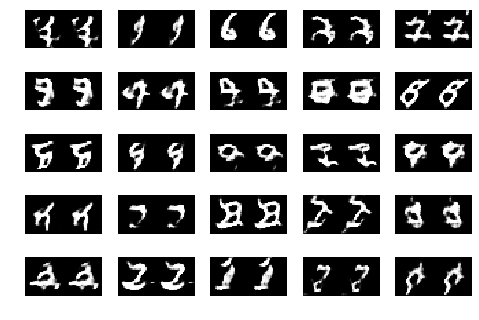

Epoch 1 Batch 1201/1875 [D loss: 0.019338, acc.: 100.00%] [G loss: 5.491299]
Epoch 1 Batch 1202/1875 [D loss: 0.026298, acc.: 100.00%] [G loss: 5.295650]
Epoch 1 Batch 1203/1875 [D loss: 0.089831, acc.: 93.75%] [G loss: 5.098026]
Epoch 1 Batch 1204/1875 [D loss: 0.008734, acc.: 100.00%] [G loss: 5.547205]
Epoch 1 Batch 1205/1875 [D loss: 0.237615, acc.: 87.50%] [G loss: 4.732692]
Epoch 1 Batch 1206/1875 [D loss: 0.057175, acc.: 100.00%] [G loss: 5.590131]
Epoch 1 Batch 1207/1875 [D loss: 0.012708, acc.: 100.00%] [G loss: 6.449273]
Epoch 1 Batch 1208/1875 [D loss: 0.045827, acc.: 96.88%] [G loss: 5.611856]
Epoch 1 Batch 1209/1875 [D loss: 0.011857, acc.: 100.00%] [G loss: 5.707087]
Epoch 1 Batch 1210/1875 [D loss: 0.031042, acc.: 96.88%] [G loss: 6.232116]
Epoch 1 Batch 1211/1875 [D loss: 0.051199, acc.: 96.88%] [G loss: 6.912097]
Epoch 1 Batch 1212/1875 [D loss: 0.035707, acc.: 96.88%] [G loss: 6.976749]
Epoch 1 Batch 1213/1875 [D loss: 0.040052, acc.: 100.00%] [G loss: 6.555627]
Epoch

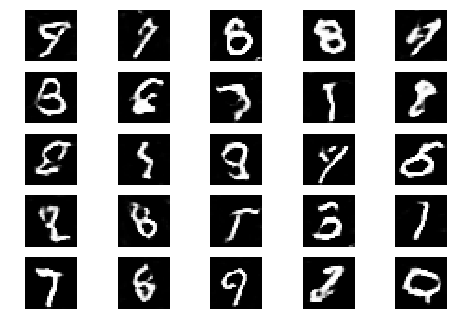

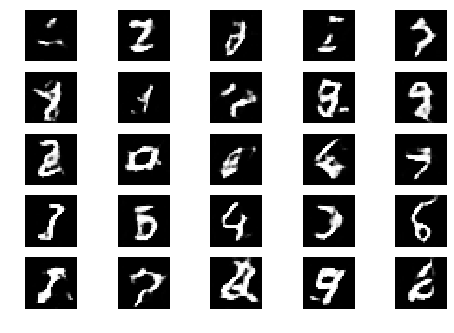

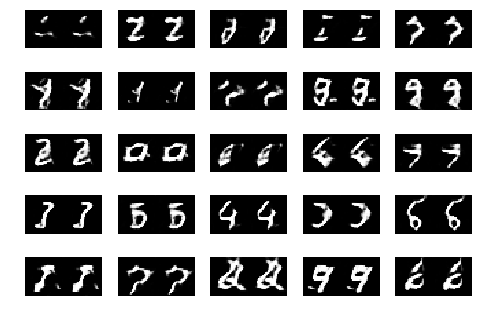

Epoch 1 Batch 1301/1875 [D loss: 0.060644, acc.: 96.88%] [G loss: 5.468678]
Epoch 1 Batch 1302/1875 [D loss: 0.012197, acc.: 100.00%] [G loss: 5.564113]
Epoch 1 Batch 1303/1875 [D loss: 0.022215, acc.: 100.00%] [G loss: 5.799294]
Epoch 1 Batch 1304/1875 [D loss: 0.022123, acc.: 100.00%] [G loss: 5.980208]
Epoch 1 Batch 1305/1875 [D loss: 0.019989, acc.: 100.00%] [G loss: 5.403167]
Epoch 1 Batch 1306/1875 [D loss: 0.014860, acc.: 100.00%] [G loss: 6.384919]
Epoch 1 Batch 1307/1875 [D loss: 0.016942, acc.: 100.00%] [G loss: 6.217434]
Epoch 1 Batch 1308/1875 [D loss: 0.025686, acc.: 100.00%] [G loss: 5.690069]
Epoch 1 Batch 1309/1875 [D loss: 0.009626, acc.: 100.00%] [G loss: 6.022624]
Epoch 1 Batch 1310/1875 [D loss: 0.004242, acc.: 100.00%] [G loss: 6.379294]
Epoch 1 Batch 1311/1875 [D loss: 0.006320, acc.: 100.00%] [G loss: 6.414957]
Epoch 1 Batch 1312/1875 [D loss: 0.013135, acc.: 100.00%] [G loss: 6.187031]
Epoch 1 Batch 1313/1875 [D loss: 0.103999, acc.: 93.75%] [G loss: 4.311781]
E

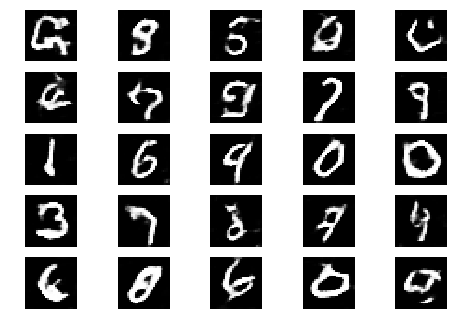

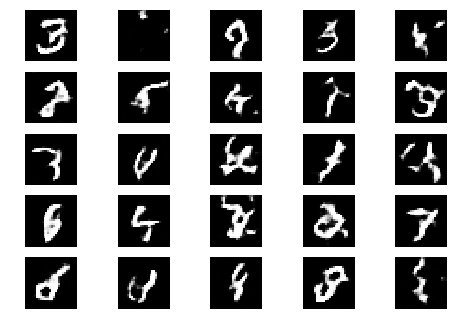

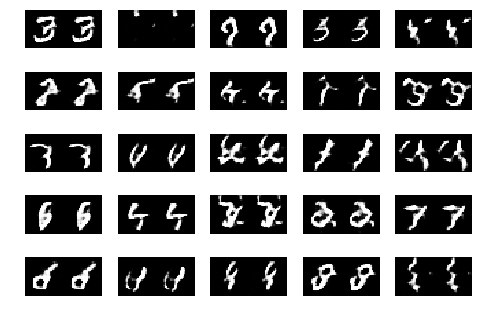

Epoch 1 Batch 1401/1875 [D loss: 0.126998, acc.: 93.75%] [G loss: 5.205708]
Epoch 1 Batch 1402/1875 [D loss: 0.020483, acc.: 100.00%] [G loss: 6.859456]
Epoch 1 Batch 1403/1875 [D loss: 0.016364, acc.: 100.00%] [G loss: 7.258674]
Epoch 1 Batch 1404/1875 [D loss: 0.002352, acc.: 100.00%] [G loss: 7.218502]
Epoch 1 Batch 1405/1875 [D loss: 0.009493, acc.: 100.00%] [G loss: 7.107016]
Epoch 1 Batch 1406/1875 [D loss: 0.037992, acc.: 96.88%] [G loss: 7.160476]
Epoch 1 Batch 1407/1875 [D loss: 0.009516, acc.: 100.00%] [G loss: 6.771381]
Epoch 1 Batch 1408/1875 [D loss: 0.035349, acc.: 96.88%] [G loss: 6.751121]
Epoch 1 Batch 1409/1875 [D loss: 0.092920, acc.: 96.88%] [G loss: 5.645973]
Epoch 1 Batch 1410/1875 [D loss: 0.074092, acc.: 93.75%] [G loss: 5.148165]
Epoch 1 Batch 1411/1875 [D loss: 0.006868, acc.: 100.00%] [G loss: 6.318310]
Epoch 1 Batch 1412/1875 [D loss: 0.042275, acc.: 96.88%] [G loss: 4.924968]
Epoch 1 Batch 1413/1875 [D loss: 0.013581, acc.: 100.00%] [G loss: 5.072150]
Epoch

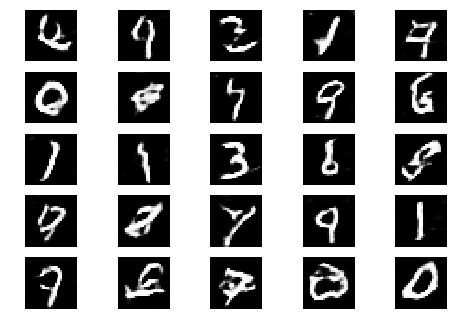

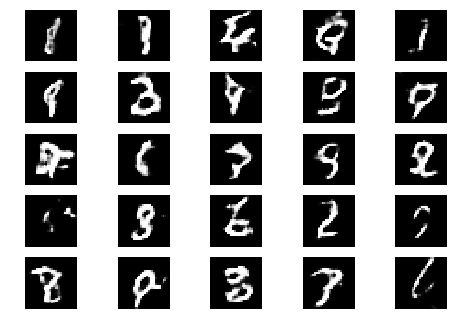

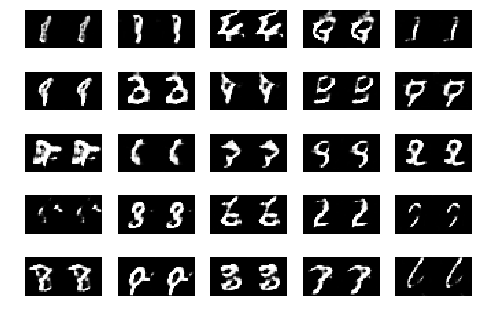

Epoch 1 Batch 1501/1875 [D loss: 0.014038, acc.: 100.00%] [G loss: 5.988964]
Epoch 1 Batch 1502/1875 [D loss: 0.005755, acc.: 100.00%] [G loss: 6.162064]
Epoch 1 Batch 1503/1875 [D loss: 0.017653, acc.: 100.00%] [G loss: 5.979732]
Epoch 1 Batch 1504/1875 [D loss: 0.091137, acc.: 93.75%] [G loss: 5.826952]
Epoch 1 Batch 1505/1875 [D loss: 0.047175, acc.: 96.88%] [G loss: 4.738198]
Epoch 1 Batch 1506/1875 [D loss: 0.030183, acc.: 100.00%] [G loss: 5.005935]
Epoch 1 Batch 1507/1875 [D loss: 0.040134, acc.: 100.00%] [G loss: 4.838564]
Epoch 1 Batch 1508/1875 [D loss: 0.032202, acc.: 100.00%] [G loss: 5.449872]
Epoch 1 Batch 1509/1875 [D loss: 0.042113, acc.: 96.88%] [G loss: 6.237454]
Epoch 1 Batch 1510/1875 [D loss: 0.007677, acc.: 100.00%] [G loss: 6.237500]
Epoch 1 Batch 1511/1875 [D loss: 0.018251, acc.: 100.00%] [G loss: 6.201198]
Epoch 1 Batch 1512/1875 [D loss: 0.022169, acc.: 100.00%] [G loss: 6.437904]
Epoch 1 Batch 1513/1875 [D loss: 0.003150, acc.: 100.00%] [G loss: 6.394710]
Ep

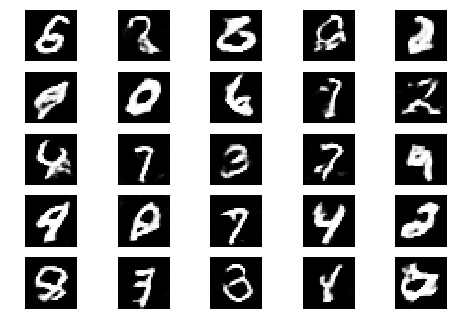

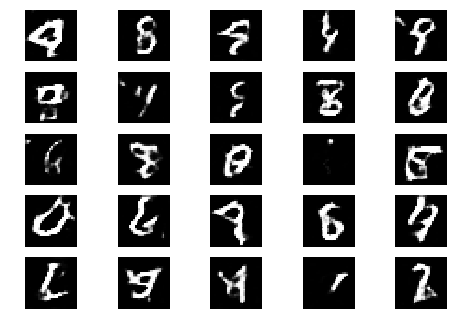

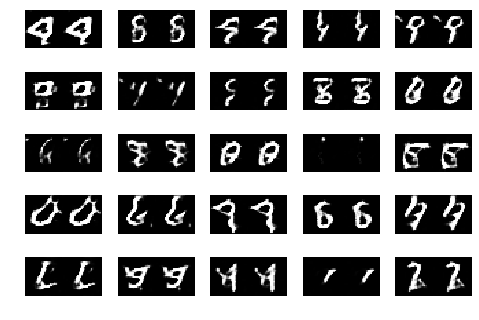

Epoch 1 Batch 1601/1875 [D loss: 0.019921, acc.: 100.00%] [G loss: 6.484266]
Epoch 1 Batch 1602/1875 [D loss: 0.068562, acc.: 96.88%] [G loss: 5.827114]
Epoch 1 Batch 1603/1875 [D loss: 0.029970, acc.: 100.00%] [G loss: 5.877702]
Epoch 1 Batch 1604/1875 [D loss: 0.103903, acc.: 96.88%] [G loss: 5.863388]
Epoch 1 Batch 1605/1875 [D loss: 0.017237, acc.: 100.00%] [G loss: 6.224457]
Epoch 1 Batch 1606/1875 [D loss: 0.026569, acc.: 100.00%] [G loss: 6.031689]
Epoch 1 Batch 1607/1875 [D loss: 0.054148, acc.: 96.88%] [G loss: 6.720004]
Epoch 1 Batch 1608/1875 [D loss: 0.020496, acc.: 100.00%] [G loss: 7.433186]
Epoch 1 Batch 1609/1875 [D loss: 0.046802, acc.: 96.88%] [G loss: 6.480626]
Epoch 1 Batch 1610/1875 [D loss: 0.121992, acc.: 96.88%] [G loss: 5.537805]
Epoch 1 Batch 1611/1875 [D loss: 0.031872, acc.: 100.00%] [G loss: 5.681894]
Epoch 1 Batch 1612/1875 [D loss: 0.028780, acc.: 100.00%] [G loss: 6.474333]
Epoch 1 Batch 1613/1875 [D loss: 0.068014, acc.: 93.75%] [G loss: 7.980910]
Epoch

KeyboardInterrupt: ignored

In [32]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=32, save_interval=1, modeltotrain = 3)

In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNandriNEW( averagemode = 3 ,  loadpretrainedweights=True)


In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=64, save_interval=1, modeltotrain = 3)

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=64, save_interval=100, modeltotrain = 3)

In [0]:
plotamodel(combined, showdetails=False )
files.download('modelsmall.png')

In [0]:
!rm -rf generator1fminst.h5



In [0]:

generator1.save('generator1fminst.h5')



In [0]:
files.download('generator1fminst.h5')


In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 2 ,  loadpretrainedweights=False)


In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=1, batch_size=32, save_interval=20, modeltotrain=3)

In [0]:
!rm -rf generator2fmnist.h5


In [0]:

generator2.save('generator2fmnist.h5')

In [0]:
!ls -al


In [0]:
files.download('generator2fmnist.h5')

In [0]:
##!wget https://github.com/rajagopalmotivate/try1/raw/master/generatorTrainedepoch2git.h5

In [0]:
!rm -rf generator1fminst.h5
!rm -rf generator2fminst.h5

In [0]:
!ls -all

In [0]:
!wget https://github.com/rajagopalmotivate/try1/raw/master/generator1fminst.h5

In [0]:
!wget https://github.com/rajagopalmotivate/try1/raw/master/generator2fminst.h5

In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


In [0]:
plotamodel(combined, showdetails=False )
files.download('modelsmall.png')

In [0]:
plotamodel(combined, showdetails=True )
files.download('model.png')

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=1)

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=2)

In [0]:
generator1, generator2, discriminator, combined , mergedmodel = build_modelsNEW( averagemode = 3 ,  loadpretrainedweights=True)


In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=3)

In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1, modeltotrain=3)

In [0]:
plotamodel(combined)
files.download('model.png')

In [0]:
!rm -rf generatorTrainedepoch2.h5

generator1.save('generator1fminst.h5')

!rm -rf generator2Trainedepoch2.h5

generator2.save('generator2fminst.h5')


In [0]:
generator1 = generator1.load_weights('generator1fmnist.h5')


In [0]:
generator2 = generator2.load_weights('generator1fminst.h5')




In [0]:
train(generator1, generator2,  discriminator, combined, mergedmodel,  epochs=2, batch_size=32, save_interval=1)

In [0]:
generator1.save('generatorTrained1epoch4.h5')

In [0]:
files.download('generator1fmnist.h5')

In [0]:
files.download('generator2fmnist.h5')

In [0]:
##files.download('discriminator1.h5')

In [0]:
##files.download('combined1.h5')

In [0]:
#generator1 = load_model('generator1.h5')
#discriminator1 = load_model('discriminator1.h5')
#combined1 = load_model('combined1.h5')

